In [1]:
import os
import sys
from pathlib import Path

# Limpiar posibles rutas incorrectas heredadas
os.environ.pop("PROJ_LIB", None)
os.environ.pop("PROJ_DATA", None)

# Buscar proj.db dentro del entorno virtual activo
entorno = Path(sys.prefix)

resultados = list(entorno.rglob("proj.db"))

print("Entorno activo:")
print(entorno)

print("\nArchivos proj.db encontrados:")
for ruta in resultados:
    print(ruta)


import os
import sys
from pathlib import Path

entorno = Path(sys.prefix)

rutas_rasterio = [
    ruta.parent
    for ruta in entorno.rglob("proj.db")
    if "rasterio" in str(ruta).lower()
]

if not rutas_rasterio:
    raise FileNotFoundError(
        "No se encontró proj.db dentro de la instalación de rasterio."
    )

ruta_proj = rutas_rasterio[0]

os.environ["PROJ_DATA"] = str(ruta_proj)
os.environ["PROJ_LIB"] = str(ruta_proj)

print("PROJ configurado en:")
print(ruta_proj)
print("proj.db existe:", (ruta_proj / "proj.db").exists())

Entorno activo:
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv

Archivos proj.db encontrados:
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~~proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~yproj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~=proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~.proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~-proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~%proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\rasterio\proj_data\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\pyproj\proj_dir\share\proj\proj.db
c:\Analisis_Geo

In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from libpysal import weights
import seaborn as sns
from esda import Moran_Local
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from esda import Moran

from splot.esda import plot_local_autocorrelation

import warnings
warnings.filterwarnings('ignore')

c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
gdf = gpd.read_file(r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Poligonos\Poligonos\Municipios_Antioquia.shp")
#gdf = gpd.read_file(r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Poligonos\Poligonos\Subzonas_Antioquia.shp")
#gdf = gpd.read_file(r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Poligonos\Poligonos\Subzonas_Extension_Antioquia.shp")
print(gdf.crs)
gdf["Gradiente"]=gdf["Elev_max"]-gdf["Elev_min"]
gdf_ON = gdf.to_crs(9377)
gdf.to_file(r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Poligonos\Poligonos\R\Muncipios_ON.shp")
gdf.head()

EPSG:4326


,OBJECTID_1,NOMBRE_ENT,CATEGORIA,DEPARTAMEN,COD_DEPART,COD_MUNICI,AREA_KM,OBSERVACIO,PK_CUE,ACTO_ADMIN,...,TPI_std,TPI_cv,Curv_std,Curv_cv,Pend_std,Pend_cv,Elev_std,Elev_cv,geometry,Gradiente
0,4267.0,YARUMAL,M,ANTIOQUIA,05,887,717.285352,None,NaN,None,...,2.504917,1302.269109,0.985391,1649.239133,18.299343,0.553453,571.171727,0.270422,"POLYGON ((-75.31983 7.24079, -75.31946 7.24077...",2436.510071
1,4306.0,ANGOSTURA,M,ANTIOQUIA,05,038,329.457055,None,NaN,None,...,2.422017,1071.740520,0.926558,1166.526582,13.356039,0.472276,407.187806,0.199472,"POLYGON ((-75.26615 6.96567, -75.26514 6.96303...",1618.769897
2,4536.0,NARIÑO,M,ANTIOQUIA,05,483,314.940324,None,501785.0,None,...,3.471513,-155.312073,1.353369,-192.803303,22.404906,0.420936,614.566000,0.384461,"POLYGON ((-75.23043 5.67613, -75.22987 5.67602...",2885.710022
3,4571.0,CARAMANTA,M,ANTIOQUIA,05,145,90.521818,None,501752.0,None,...,3.015808,380.332995,1.181636,426.117632,19.547508,0.417466,591.767063,0.331119,"POLYGON ((-75.58067 5.60548, -75.58068 5.60545...",2501.120056
4,4579.0,SANTA ROSA DE OSOS,M,ANTIOQUIA,05,686,861.242001,None,502270.0,None,...,2.248501,-1334.154124,0.853320,-1660.639540,12.810342,0.550760,338.358861,0.139148,"POLYGON ((-75.5764 6.87091, -75.57589 6.86958,...",1885.729980


In [3]:
import numpy as np
# import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

from libpysal import weights
from esda import Moran


# =====================================================
# FUNCIÓN DE MÉTRICAS
# =====================================================
def metricas_statsmodels(modelo, y_obs, y_pred, n_variables):

    y_obs = np.asarray(y_obs, dtype=float).flatten()
    y_pred = np.asarray(y_pred, dtype=float).flatten()

    rmse = np.sqrt(mean_squared_error(y_obs, y_pred))
    mae = mean_absolute_error(y_obs, y_pred)
    r2 = r2_score(y_obs, y_pred)

    n = len(y_obs)

    r2_ajustado = (
        1 - (1 - r2) * (n - 1) / (n - n_variables - 1)
        if n > n_variables + 1
        else np.nan
    )

    print(f"RMSE          : {rmse:.4f}")
    print(f"MAE           : {mae:.4f}")
    print(f"R²            : {r2:.4f}")
    print(f"R² ajustado   : {r2_ajustado:.4f}")

    if hasattr(modelo, "aic"):
        print(f"AIC           : {modelo.aic:.2f}")

    if hasattr(modelo, "bic"):
        try:
            print(f"BIC           : {modelo.bic:.2f}")
        except Exception:
            pass

    if hasattr(modelo, "deviance"):
        print(f"Deviance      : {modelo.deviance:.4f}")

    if hasattr(modelo, "pearson_chi2"):
        print(f"Pearson chi²  : {modelo.pearson_chi2:.4f}")

    return {
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "R2_ajustado": r2_ajustado
    }


# =====================================================
# FUNCIÓN DE GRÁFICAS
# =====================================================
def graficas_statsmodels(
    gdf,
    indices,
    y_obs,
    y_pred,
    nombre_modelo="Modelo",
    matriz="queen"
):

    gdf_resultado = gdf.copy()

    y_obs = np.asarray(y_obs, dtype=float).flatten()
    y_pred = np.asarray(y_pred, dtype=float).flatten()

    gdf_resultado["Observado"] = np.nan
    gdf_resultado["Predicho"] = np.nan
    gdf_resultado["Residuo"] = np.nan
    gdf_resultado["Residuo_abs"] = np.nan

    gdf_resultado.loc[indices, "Observado"] = y_obs
    gdf_resultado.loc[indices, "Predicho"] = y_pred
    gdf_resultado.loc[indices, "Residuo"] = y_obs - y_pred
    gdf_resultado.loc[indices, "Residuo_abs"] = np.abs(y_obs - y_pred)

    # =================================================
    # MAPAS
    # =================================================
    fig, ax = plt.subplots(1, 3, figsize=(20, 7), dpi=150)

    vmin = min(
        gdf_resultado.loc[indices, "Observado"].min(),
        gdf_resultado.loc[indices, "Predicho"].min()
    )

    vmax = max(
        gdf_resultado.loc[indices, "Observado"].max(),
        gdf_resultado.loc[indices, "Predicho"].max()
    )

    gdf_resultado.plot(
        column="Observado",
        cmap="viridis",
        legend=True,
        edgecolor="black",
        linewidth=0.2,
        ax=ax[0]
    )

    ax[0].set_title("Observado")
    ax[0].set_axis_off()

    gdf_resultado.plot(
        column="Predicho",
        cmap="viridis",
        legend=True,
        edgecolor="black",
        linewidth=0.2,
        ax=ax[1]
    )

    ax[1].set_title("Predicho")
    ax[1].set_axis_off()

    vmax_resid = np.nanmax(
        np.abs(gdf_resultado.loc[indices, "Residuo"])
    )

    gdf_resultado.plot(
        column="Residuo",
        cmap="RdBu_r",
        vmin=-vmax_resid,
        vmax=vmax_resid,
        legend=True,
        edgecolor="black",
        linewidth=0.2,
        ax=ax[2]
    )

    ax[2].set_title("Residuos")
    ax[2].set_axis_off()

    fig.suptitle(nombre_modelo, fontsize=17, fontweight="bold")

    plt.tight_layout()
    plt.show()

    # =================================================
    # OBSERVADO VS PREDICHO
    # =================================================
    fig, ax = plt.subplots(figsize=(7, 7), dpi=150)

    ax.scatter(
        y_obs,
        y_pred,
        s=35,
        alpha=0.7,
        edgecolor="black",
        linewidth=0.3
    )

    minimo = min(y_obs.min(), y_pred.min())
    maximo = max(y_obs.max(), y_pred.max())

    ax.plot(
        [minimo, maximo],
        [minimo, maximo],
        color="red",
        linestyle="--",
        linewidth=2,
        label="Línea 1:1"
    )

    ax.set_xlim(minimo, maximo)
    ax.set_ylim(minimo, maximo)
    ax.set_xlabel("Observado")
    ax.set_ylabel("Predicho")
    ax.set_title(f"Observado vs. predicho — {nombre_modelo}")
    ax.grid(True, linestyle="--", alpha=0.35)
    ax.legend()

    plt.tight_layout()
    plt.show()

    # =================================================
    # DIAGNÓSTICO DE RESIDUOS
    # =================================================
    gdf_valid = gdf_resultado.loc[indices].copy()

    if matriz.lower() == "queen":
        w = weights.Queen.from_dataframe(gdf_valid)
    elif matriz.lower() == "rook":
        w = weights.Rook.from_dataframe(gdf_valid)
    else:
        raise ValueError("La matriz debe ser 'queen' o 'rook'.")

    w.transform = "R"

    lag_resid = weights.lag_spatial(w, gdf_valid["Residuo"])
    mi = Moran(gdf_valid["Residuo"], w)

    fig, ax = plt.subplots(1, 3, figsize=(18, 5), dpi=150)

    ax[0].scatter(
        gdf_valid["Predicho"],
        gdf_valid["Residuo"],
        s=35,
        alpha=0.7
    )

    ax[0].axhline(0, color="red", linestyle="--")
    ax[0].set_title("Residuos vs. ajustados")
    ax[0].set_xlabel("Valores ajustados")
    ax[0].set_ylabel("Residuos")
    ax[0].grid(True, alpha=0.35)

    sns.histplot(
        gdf_valid["Residuo"],
        kde=True,
        bins=20,
        ax=ax[1]
    )

    ax[1].set_title("Distribución de residuos")
    ax[1].set_xlabel("Residuos")
    ax[1].set_ylabel("Frecuencia")
    ax[1].grid(True, alpha=0.35)

    sns.regplot(
        x=gdf_valid["Residuo"],
        y=lag_resid,
        ci=None,
        ax=ax[2],
        scatter_kws={"s": 35, "alpha": 0.7},
        line_kws={"color": "red"}
    )

    ax[2].axvline(0, color="black", linestyle="--", alpha=0.5)
    ax[2].axhline(0, color="black", linestyle="--", alpha=0.5)
    ax[2].set_title("Moran de los residuos")
    ax[2].set_xlabel("Residuos")
    ax[2].set_ylabel("Rezago espacial")
    ax[2].grid(True, alpha=0.35)

    ax[2].text(
        0.05,
        0.95,
        f"I de Moran = {mi.I:.3f}\np_sim = {mi.p_sim:.4f}",
        transform=ax[2].transAxes,
        va="top",
        bbox=dict(
            facecolor="white",
            edgecolor="black",
            alpha=0.85
        )
    )

    plt.tight_layout()
    plt.show()

    return gdf_resultado, mi

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from libpysal import weights
from esda import Moran


def graficar_moran_residuos(gdf, y_obs, y_pred):

    # Residuos
    residuos = (
        np.asarray(y_obs, dtype=float).flatten()
        - np.asarray(y_pred, dtype=float).flatten()
    )

    # Matriz Queen
    w = weights.Queen.from_dataframe(gdf)
    w.transform = "R"

    # Rezago espacial y Moran
    lag_residuos = weights.lag_spatial(w, residuos)
    mi = Moran(residuos, w, permutations=999)

    # Gráfica
    fig, ax = plt.subplots(figsize=(7, 6), dpi=150)

    sns.regplot(
        x=residuos,
        y=lag_residuos,
        ci=None,
        ax=ax,
        scatter_kws={
            "s": 35,
            "alpha": 0.7
        },
        line_kws={
            "color": "red"
        }
    )

    ax.axvline(
        0,
        color="black",
        linestyle="--",
        alpha=0.5
    )

    ax.axhline(
        0,
        color="black",
        linestyle="--",
        alpha=0.5
    )

    ax.set_title("Moran de los residuos")
    ax.set_xlabel("Residuos")
    ax.set_ylabel("Rezago espacial")
    ax.grid(True, alpha=0.35)

    ax.text(
        0.05,
        0.95,
        f"I de Moran = {mi.I:.3f}\n"
        f"p_sim = {mi.p_sim:.4f}",
        transform=ax.transAxes,
        va="top",
        bbox=dict(
            facecolor="white",
            edgecolor="black",
            alpha=0.85
        )
    )

    plt.tight_layout()
    plt.show()

    return mi


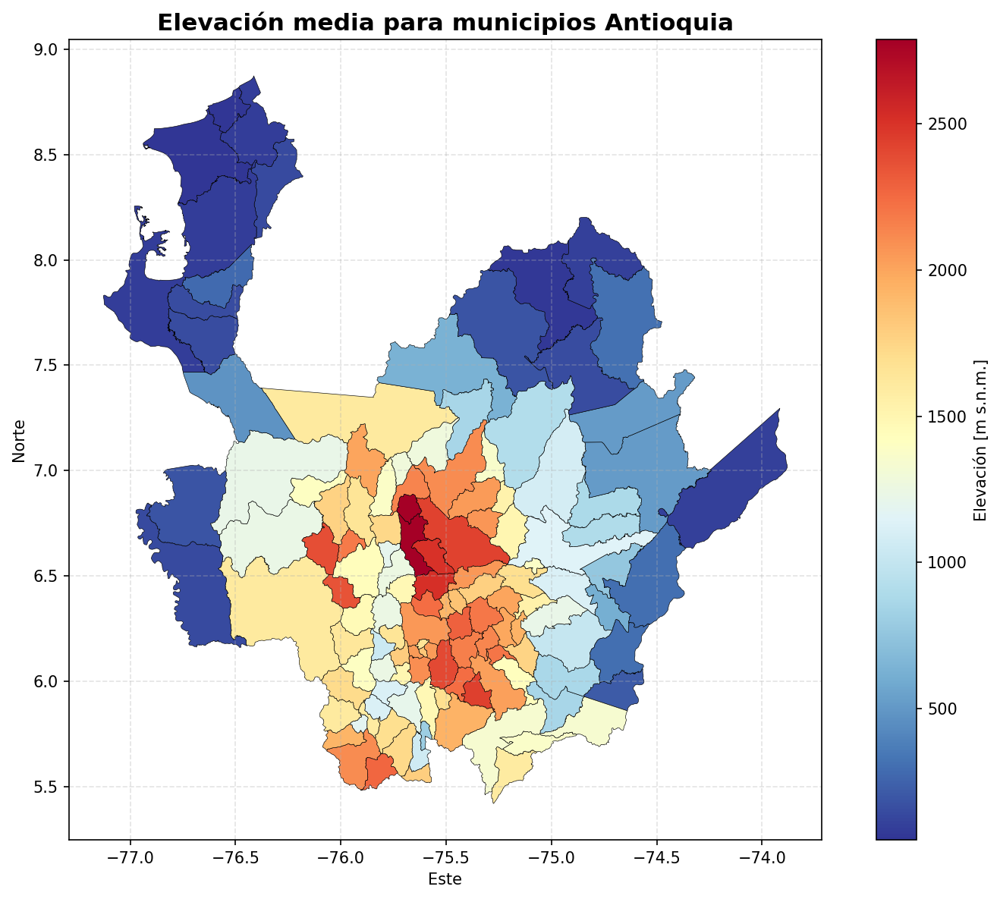

In [4]:
fig, ax = plt.subplots(figsize=(10, 8), dpi=150)

gdf.plot(
    ax=ax,
    column="Elev_mean",
    cmap="RdYlBu_r",
    legend=True,
    edgecolor="black",
    linewidth=0.3,
    legend_kwds={
        "label": "Elevación [m s.n.m.]"
    }
)

ax.set_title("Elevación media para municipios Antioquia", fontsize=15, fontweight="bold")
ax.set_xlabel("Este")
ax.set_ylabel("Norte")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.35)

plt.tight_layout()
plt.show()

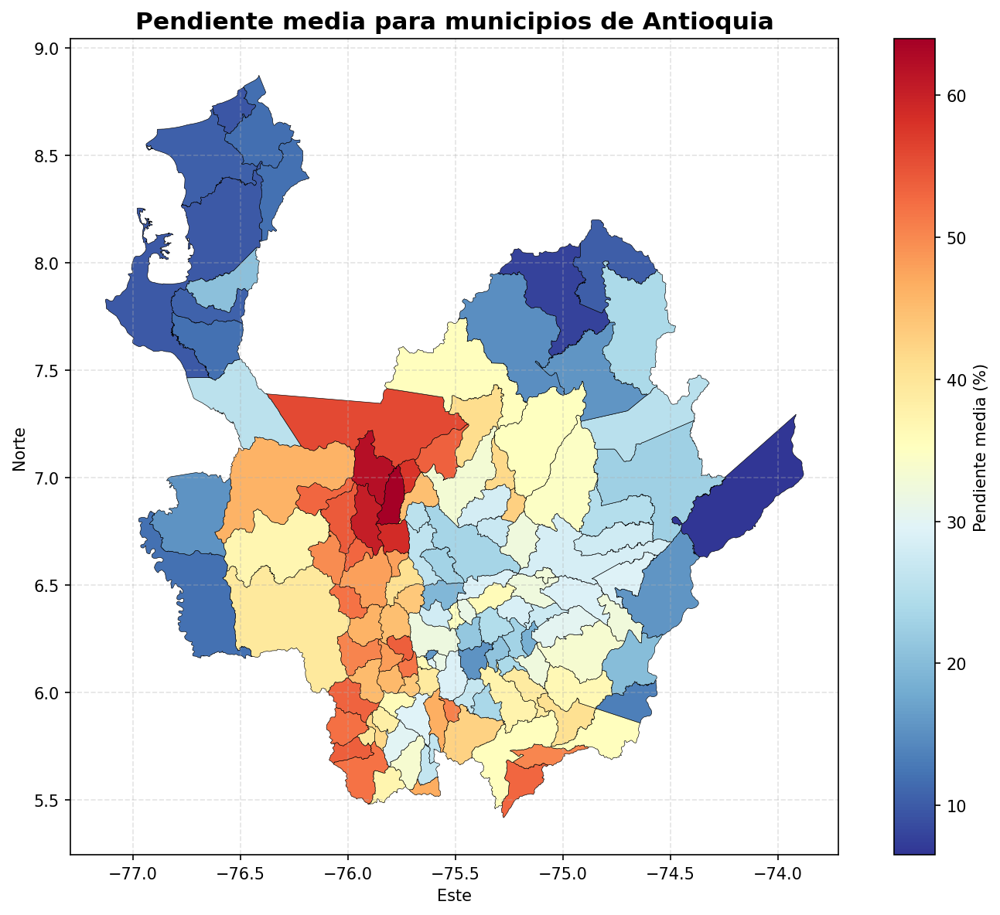

In [5]:
fig, ax = plt.subplots(figsize=(10, 8), dpi=150)

gdf.plot(
    ax=ax,
    column="Pend_mean",
    cmap="RdYlBu_r",
    legend=True,
    edgecolor="black",
    linewidth=0.3,
    legend_kwds={
        "label": "Pendiente media (%)"
    }
)

ax.set_title("Pendiente media para municipios de Antioquia", fontsize=15, fontweight="bold")
ax.set_xlabel("Este")
ax.set_ylabel("Norte")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.35)

plt.tight_layout()
plt.show()

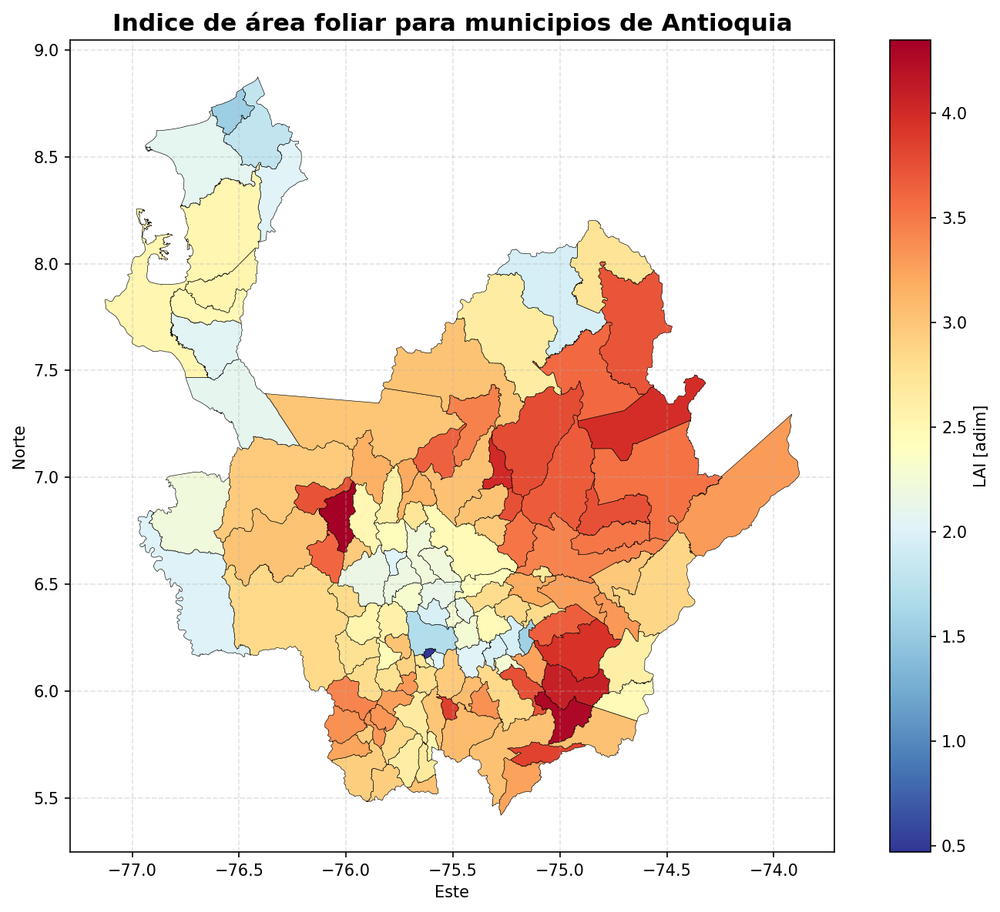

In [7]:
fig, ax = plt.subplots(figsize=(10, 8), dpi=150)

gdf.plot(
    ax=ax,
    column="LAI_mean",
    cmap="RdYlBu_r",
    legend=True,
    edgecolor="black",
    linewidth=0.3,
    legend_kwds={
        "label": "LAI [adim]"
    }
)

ax.set_title("Indice de área foliar para municipios de Antioquia", fontsize=15, fontweight="bold")
ax.set_xlabel("Este")
ax.set_ylabel("Norte")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.35)

plt.tight_layout()
plt.show()

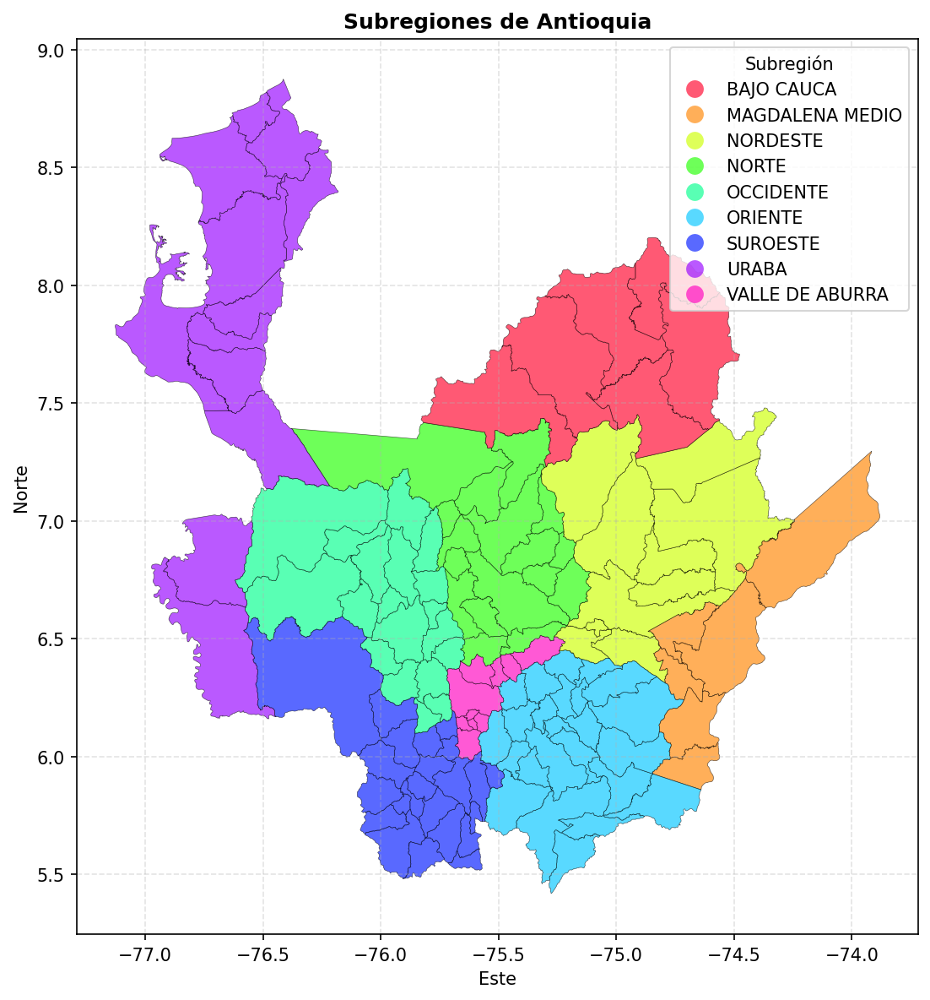

In [7]:
fig, ax = plt.subplots(figsize=(10, 8), dpi=150)

gdf.plot(
    ax=ax,
    column="Subregion",
    categorical=True,
    cmap="gist_rainbow",
    legend=True,
    edgecolor="black",
    alpha=0.65,
    linewidth=0.3,
    legend_kwds={
        "title": "Subregión"
    }
)

ax.set_title("Subregiones de Antioquia", fontsize=12, fontweight="bold")
ax.set_xlabel("Este")
ax.set_ylabel("Norte")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.35)

plt.tight_layout()
plt.show()

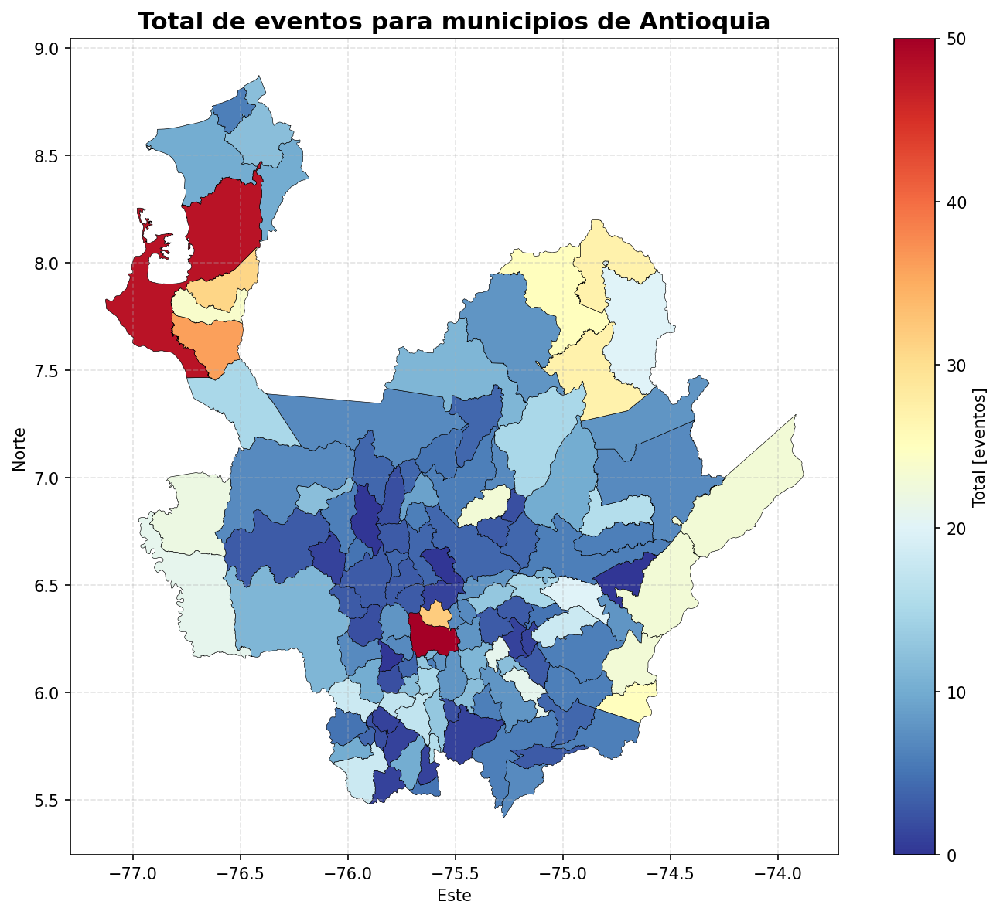

In [8]:
fig, ax = plt.subplots(figsize=(10, 8), dpi=150)

gdf.plot(
    ax=ax,
    column="Tot_event",
    cmap="RdYlBu_r",
    legend=True,
    edgecolor="black",
    linewidth=0.3,
    legend_kwds={
        "label": "Total [eventos]"
    }
)

ax.set_title("Total de eventos para municipios de Antioquia", fontsize=15, fontweight="bold")
ax.set_xlabel("Este")
ax.set_ylabel("Norte")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.35)

plt.tight_layout()
plt.show()

In [8]:
#w_queen = weights.Queen.from_dataframe(gdf, idVariable="objectid")
w_queen = weights.Queen.from_dataframe(gdf, idVariable="COD_MUNICI")
w_queen = weights.Queen.from_dataframe(gdf)
print(w_queen.neighbors[7])
print(w_queen.weights[7])
print(7 in w_queen.neighbors[5])
queen_card = pd.Series(w_queen.cardinalities)
queen_card.head(20)

[32, 68, 39, 123, 13, 63]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
False


0      8
1      5
2      2
3      2
4     11
5      4
6      6
7      6
8      5
9      6
10     3
11     7
12     2
13     7
14     6
15     5
16     4
17     4
18     9
19     6
dtype: int64

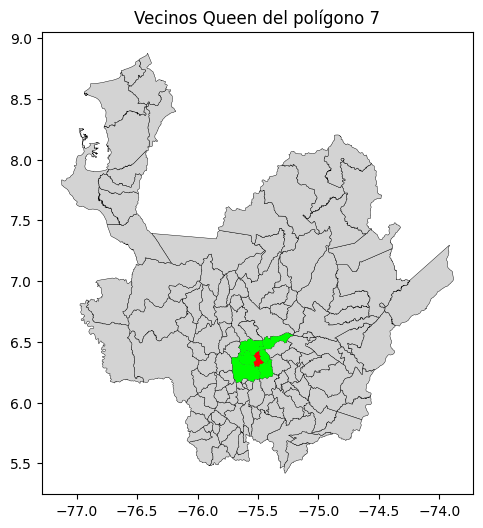

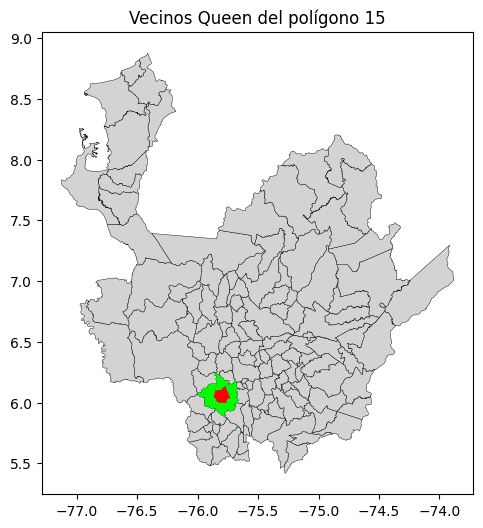

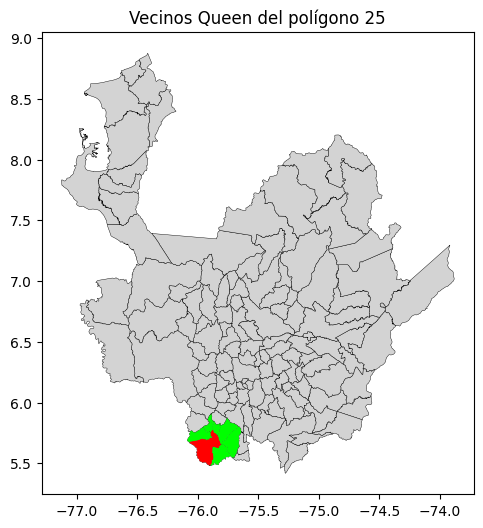

In [9]:
def plot_neighbors(i):
    fig, ax = plt.subplots(figsize=(6,6))

    gdf.plot(ax=ax, color="lightgray", edgecolor="black", linewidth=0.3)
    gdf.loc[w_queen.neighbors[i]].plot(ax=ax, color="lime")
    gdf.loc[[i]].plot(ax=ax, color="red")

    ax.set_title(f"Vecinos Queen del polígono {i}")
    plt.show()

plot_neighbors(7)
plot_neighbors(15)
plot_neighbors(25)

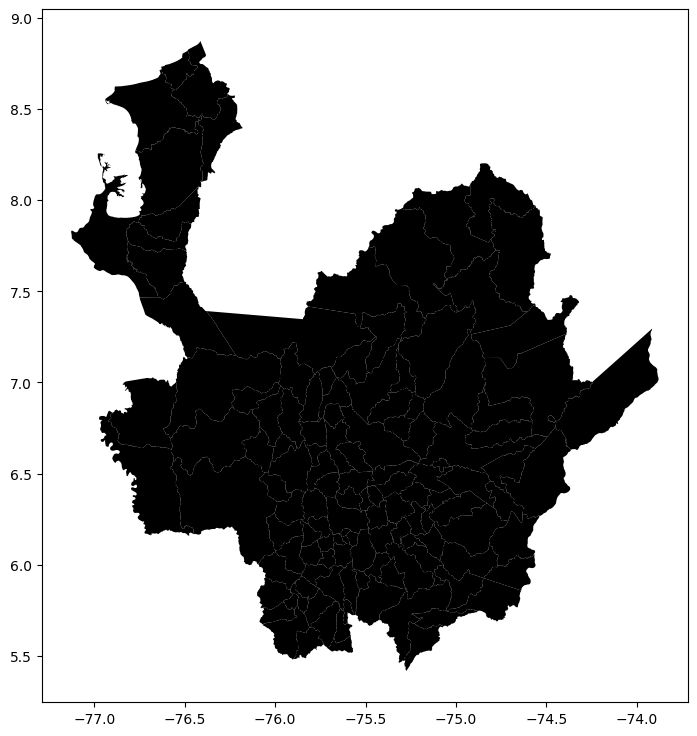

In [10]:
ax = gdf.plot(color='k', figsize=(9, 9))
#gdf.loc[w_queen.islands, :].plot(color='red', ax=ax);

In [9]:
#w = weights.Queen.from_dataframe(gdf, idVariable='objectid')
w = weights.Queen.from_dataframe(gdf, idVariable='COD_MUNICI')
w.transform = 'R'
gdf['w_Tot_event'] = weights.lag_spatial(w, gdf['Tot_event'])
gdf['w_Pend_mean'] = weights.lag_spatial(w, gdf['Pend_mean'])
gdf['w_Elev_mean'] = weights.lag_spatial(w, gdf['Elev_mean'])
gdf['w_LAI_mean'] = weights.lag_spatial(w, gdf['LAI_mean'])
gdf['w_Curv_mean'] = weights.lag_spatial(w, gdf['Curv_mean'])
gdf['w_TRI_mean'] = weights.lag_spatial(w, gdf['TRI_mean'])
gdf['w_TPI_mean'] = weights.lag_spatial(w, gdf['TPI_mean'])
gdf['w_Gradiente'] = weights.lag_spatial(w, gdf['Gradiente'])

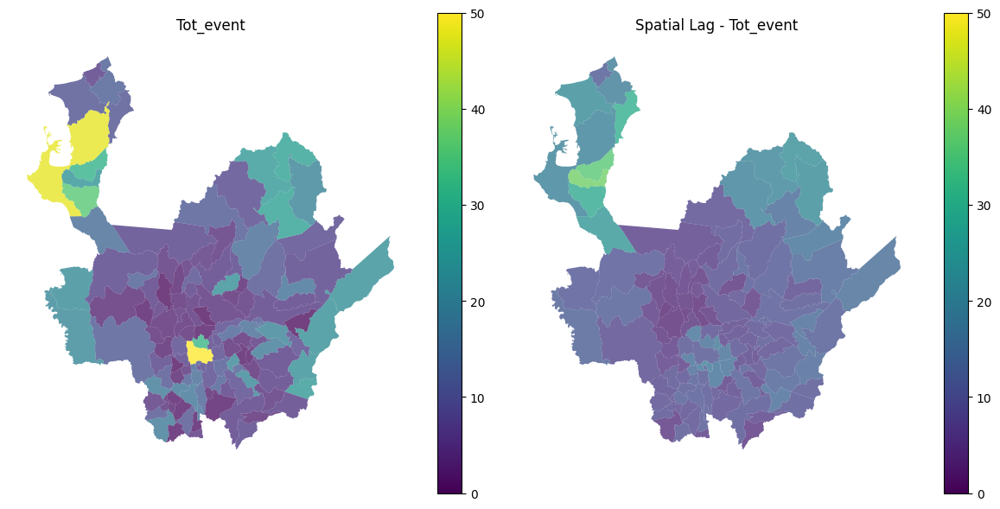

In [12]:
variable="Tot_event"

vmin = min(gdf[variable].min(), gdf[f"w_{variable}"].min())
vmax = max(gdf[variable].max(), gdf[f"w_{variable}"].max())

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

gdf.plot(
    column=variable,
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    legend=True,
    edgecolor="white",
    linewidth=0,
    alpha=0.75,
    ax=ax1
)

ax1.set_title(f"{variable}")
ax1.set_axis_off()

gdf.plot(
    column=f"w_{variable}",
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    legend=True,
    edgecolor="white",
    linewidth=0,
    alpha=0.75,
    ax=ax2
)

ax2.set_title(f"Spatial Lag - {variable}")
ax2.set_axis_off()

plt.tight_layout()
plt.show()

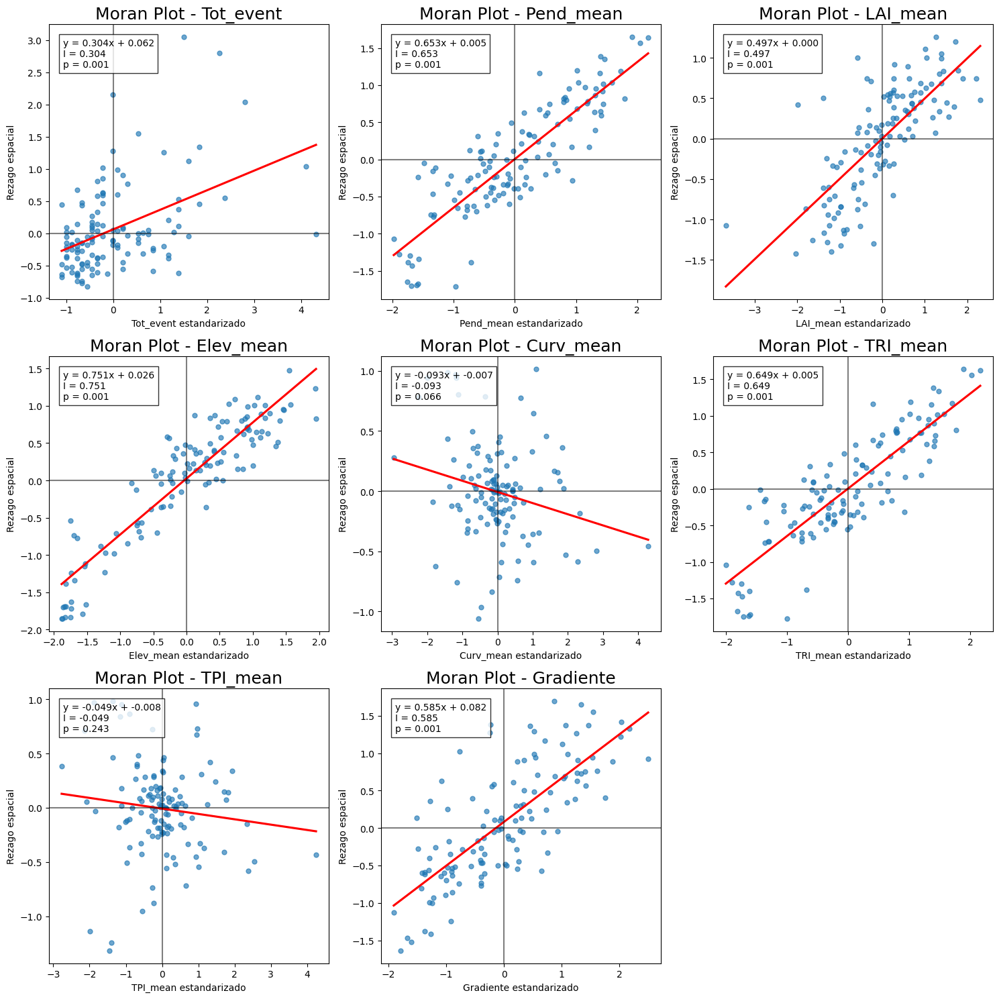

,Variable,Moran_I,p_sim
0,Tot_event,0.304364,0.001
1,Pend_mean,0.653293,0.001
2,LAI_mean,0.496697,0.001
3,Elev_mean,0.750803,0.001
4,Curv_mean,-0.092719,0.066
5,TRI_mean,0.649322,0.001
6,TPI_mean,-0.049345,0.243
7,Gradiente,0.585304,0.001


In [11]:
def moran_plots(gdf, variables, ncols=3):
    w = weights.Queen.from_dataframe(gdf)
    w.transform = "R"

    resultados = []

    nrows = int(np.ceil(len(variables) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
    axes = axes.flatten()

    for ax, variable in zip(axes, variables):

        x = gdf[variable].astype(float)
        x_std = (x - x.mean()) / x.std()
        y_lag = weights.lag_spatial(w, x_std)

        mi = Moran(x, w)

        resultados.append({
            "Variable": variable,
            "Moran_I": mi.I,
            "p_sim": mi.p_sim
        })

        m, b = np.polyfit(x_std, y_lag, 1)

        sns.regplot(
            x=x_std,
            y=y_lag,
            ax=ax,
            ci=None,
            line_kws={"color": "red"},
            scatter_kws={"alpha": 0.65, "s": 25}
        )

        ax.axvline(0, color="black", alpha=0.5)
        ax.axhline(0, color="black", alpha=0.5)

        ax.text(
            0.05, 0.95,
            f"y = {m:.3f}x + {b:.3f}\nI = {mi.I:.3f}\np = {mi.p_sim:.3f}",
            transform=ax.transAxes,
            fontsize=10,
            va="top",
            bbox=dict(facecolor="white", edgecolor="black", alpha=0.8)
        )

        ax.set_title(f"Moran Plot - {variable}", fontsize=18)
        ax.set_xlabel(f"{variable} estandarizado")
        ax.set_ylabel("Rezago espacial")

    for ax in axes[len(variables):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    return pd.DataFrame(resultados)

tabla_moran = moran_plots(
    gdf,
    [
        "Tot_event",
        #"Area",
        "Pend_mean",
        "LAI_mean",
        "Elev_mean",
        "Curv_mean",
        "TRI_mean",
        "TPI_mean",
        "Gradiente"
    ]
)

tabla_moran

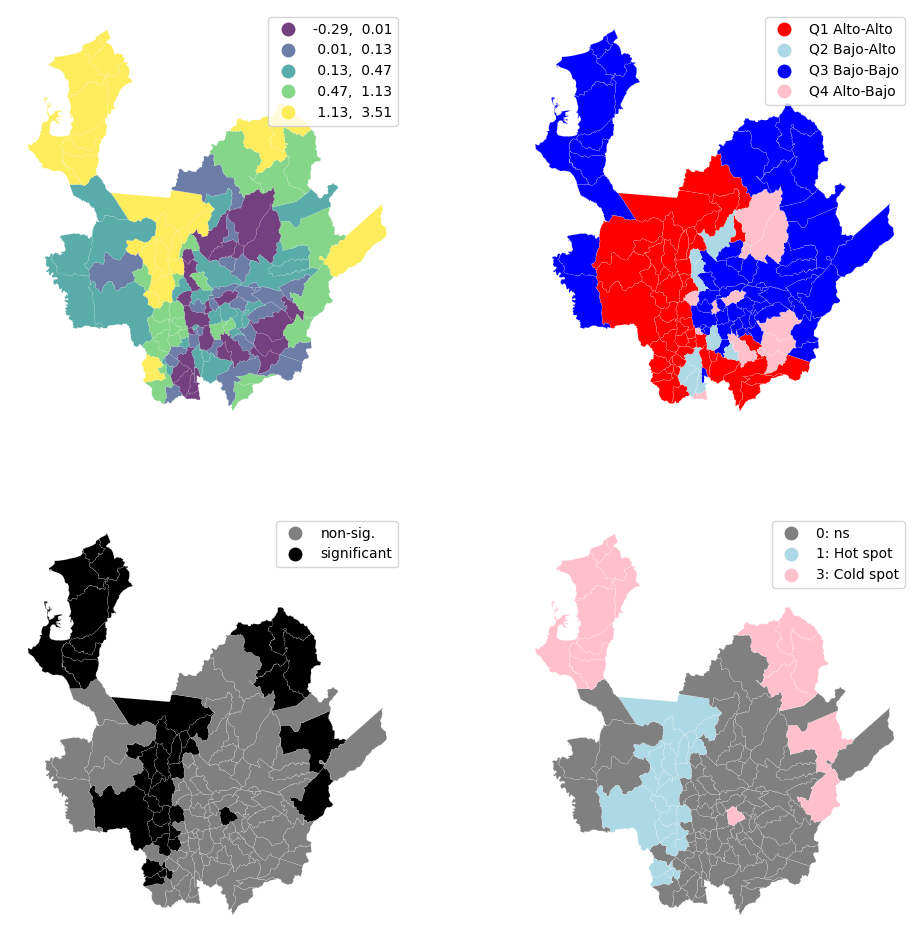

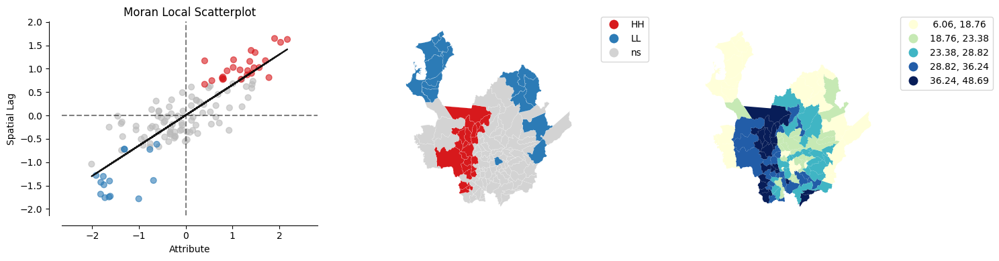

In [16]:
def lisa_plot(gdf, variable):
    
    br = gdf.copy()

    w = weights.Queen.from_dataframe(br)
    w.transform = "R"

    lisa = Moran_Local(br[variable], w)

    br["Is"] = lisa.Is

    f, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
    axs = axs.flatten()

    # Subplot 1
    ax = axs[0]
    br.plot(column="Is", cmap="viridis", scheme="quantiles",
            k=5, edgecolor="white", linewidth=0.1, alpha=0.75,
            legend=True, ax=ax)
    ax.set_aspect("equal")
    ax.set_axis_off()

    # Subplot 2
    ax = axs[1]
    q_labels = ["Q1 Alto-Alto", "Q2 Bajo-Alto", "Q3 Bajo-Bajo", "Q4 Alto-Bajo"]
    labels = [q_labels[i-1] for i in lisa.q]
    hmap = ListedColormap(["red", "lightblue", "blue", "pink"])
    br.assign(cl=labels).plot(column="cl", categorical=True,
            k=2, cmap=hmap, linewidth=0.1, ax=ax,
            edgecolor="white", legend=True)
    ax.set_aspect("equal")
    ax.set_axis_off()

    # Subplot 3
    ax = axs[2]
    sig = 1 * (lisa.p_sim < 0.05)
    hmap = ListedColormap(["grey", "black"])
    labels = ["non-sig.", "significant"]
    labels = [labels[i] for i in sig]
    br.assign(cl=labels).plot(column="cl", categorical=True,
            k=2, cmap=hmap, linewidth=0.1, ax=ax,
            edgecolor="white", legend=True)
    ax.set_aspect("equal")
    ax.set_axis_off()

    # Subplot 4
    ax = axs[3]
    hotspot = 1 * (sig * lisa.q == 1)
    coldspot = 3 * (sig * lisa.q == 3)
    doughnut = 2 * (sig * lisa.q == 2)
    diamond = 4 * (sig * lisa.q == 4)
    spots = hotspot + coldspot + doughnut + diamond

    spot_labels = ["0: ns", "1: Hot spot", "2: Doughnut", "3: Cold spot", "4: Diamond"]
    labels = [spot_labels[i] for i in spots]
    hmap = ListedColormap(["grey", "red", "lightblue", "blue", "pink"])

    br.assign(cl=labels).plot(column="cl", categorical=True,
            k=2, cmap=hmap, linewidth=0.1, ax=ax,
            edgecolor="white", legend=True)
    ax.set_aspect("equal")
    ax.set_axis_off()

    # =====================================================
    # Gráfico de autocorrelación local (splot)
    # =====================================================
    plot_local_autocorrelation(lisa, gdf, variable)
    plt.tight_layout()
    plt.show()

    return gdf, lisa

#gdf_lisa, lisa = lisa_plot(gdf, "TRI_mean")
gdf_lisa, lisa = lisa_plot(gdf, "TRI_mean")

Número de observaciones: 125
Media: 10.12
Varianza: 85.44516129032259
Varianza / Media: 8.44319775596073
Proporción de ceros: 0.032

VERIFICACIÓN DE BINOMIAL NEGATIVA Y ZINB

BINOMIAL NEGATIVA
Mu estimada              : 10.120000
Alpha                    : 0.663932
r                        : 1.506178
p                        : 0.129551
Suma PMF                 : 1.0000000000
AIC                      : 836.6064

ZINB
Inflate const            : -12.576803
Prob. cero estructural   : 0.0000034511
Mu componente NB         : 10.120000
Alpha                    : 0.663932
r                        : 1.506178
p                        : 0.129551
Suma PMF                 : 1.0000000000
AIC                      : 838.6066

COMPARACIÓN
Diferencia máxima PMF    : 3.3009238193e-06
Diferencia de AIC        : 2.0003

Parámetros de la binomial negativa
Media estimada : 10.1200
Alpha          : 0.6639
r              : 1.5062
p              : 0.1296

Suma de probabilidades
Gaussiana : 0.874701
Poisson   : 

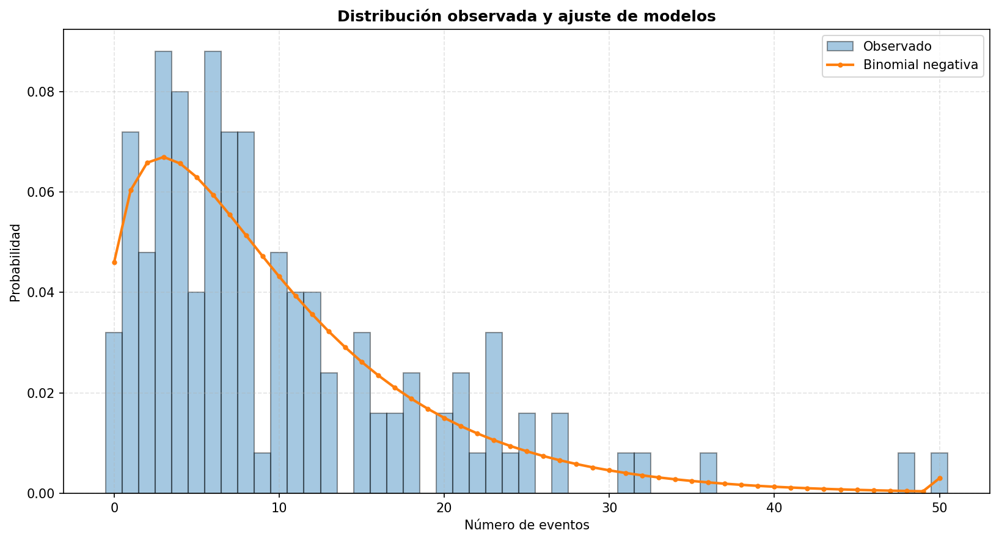


PRUEBA DE BONDAD DE AJUSTE CHI-CUADRADO
           Modelo     Chi2  p_valor
Binomial negativa   6.3715 0.382887
             ZINB   6.3715 0.382883
        Gaussiano  34.1674 0.000006
        Logístico  35.3614 0.000004
          Poisson 278.8025 0.000000

AIC DE LOS MODELOS ESTIMADOS POR MÁXIMA VEROSIMILITUD
           Modelo      AIC
Binomial negativa 836.6064
             ZINB 838.6066


In [ ]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

from scipy import stats
from scipy.stats import chisquare
from statsmodels.discrete.count_model import ZeroInflatedNegativeBinomialP

warnings.filterwarnings("ignore")

# =====================================================
# DATOS
# =====================================================
y = (
    gdf["Tot_event"]
    .replace(-9999, np.nan)
    .dropna()
    .astype(int)
    .to_numpy()
)

# Solo conteos válidos
y = y[y >= 0]

x = np.arange(0, y.max() + 1)
n = len(y)

# Modelo con solo intercepto
X = np.ones((n, 1))

# =====================================================
# ESTADÍSTICOS BÁSICOS
# =====================================================
mu = y.mean()
varianza = y.var(ddof=1)
sigma = y.std(ddof=1)

print("Número de observaciones:", n)
print("Media:", mu)
print("Varianza:", varianza)
print("Varianza / Media:", varianza / mu)
print("Proporción de ceros:", np.mean(y == 0))

# =====================================================
# 1. POISSON
# =====================================================
pmf_poisson = stats.poisson.pmf(x, mu)

# Añadir a la última categoría la probabilidad de valores > máximo observado
pmf_poisson[-1] += stats.poisson.sf(x[-1], mu)

# =====================================================
# 2. GAUSSIANA DISCRETIZADA
# P(Y=x) = F(x+0.5) - F(x-0.5)
# =====================================================
limite_inferior = x - 0.5
limite_superior = x + 0.5

# Para x=0, incluir toda la probabilidad por debajo de 0.5
# Gaussiana discretizada
pmf_gauss = (
    stats.norm.cdf(x + 0.5, loc=mu, scale=sigma)
    - stats.norm.cdf(x - 0.5, loc=mu, scale=sigma)
)

# Condicionar la normal al rango observado no negativo
pmf_gauss = pmf_gauss / pmf_gauss.sum()

pmf_gauss = (
    stats.norm.cdf(limite_superior, loc=mu, scale=sigma)
    - stats.norm.cdf(limite_inferior, loc=mu, scale=sigma)
)

# Añadir cola superior a la última categoría
pmf_gauss[-1] += stats.norm.sf(x[-1] + 0.5, loc=mu, scale=sigma)

from scipy.special import expit

# =====================================================
# 3. BINOMIAL NEGATIVA NB2 POR MÁXIMA VEROSIMILITUD
# Var(Y) = mu + alpha * mu²
# =====================================================
modelo_nb = sm.NegativeBinomial(
    endog=y,
    exog=X,
    loglike_method="nb2"
).fit(
    method="bfgs",
    maxiter=2000,
    disp=False
)

# Parámetros NB
beta_nb = modelo_nb.params[0]
alpha_nb = modelo_nb.params[-1]

mu_nb = np.exp(beta_nb)
r_nb = 1 / alpha_nb
p_nb = r_nb / (r_nb + mu_nb)

# PMF NB
pmf_nb = stats.nbinom.pmf(
    x,
    n=r_nb,
    p=p_nb
)

# Acumular la cola superior en la última categoría
pmf_nb[-1] += stats.nbinom.sf(
    x[-1],
    n=r_nb,
    p=p_nb
)

# =====================================================
# 4. BINOMIAL NEGATIVA CERO-INFLADA ZINB
# =====================================================
modelo_zinb = ZeroInflatedNegativeBinomialP(
    endog=y,
    exog=X,
    exog_infl=X,
    inflation="logit",
    p=2
).fit(
    method="bfgs",
    maxiter=5000,
    disp=False
)

# En un modelo con solo intercepto, el orden suele ser:
# inflate_const, const, alpha
inflate_const = modelo_zinb.params[0]
beta_zinb = modelo_zinb.params[1]
alpha_zinb = modelo_zinb.params[-1]

# Probabilidad de cero estructural
pi_zinb = expit(inflate_const)

# Parámetros de la componente binomial negativa
mu_zinb = np.exp(beta_zinb)
r_zinb = 1 / alpha_zinb
p_zinb = r_zinb / (r_zinb + mu_zinb)

# PMF de la componente NB
pmf_nb_interna = stats.nbinom.pmf(
    x,
    n=r_zinb,
    p=p_zinb
)

# Mezcla ZINB
pmf_zinb = (1 - pi_zinb) * pmf_nb_interna

# Masa adicional de ceros estructurales
pmf_zinb[0] += pi_zinb

# Acumular la cola superior en la última categoría
cola_zinb = (
    (1 - pi_zinb)
    * stats.nbinom.sf(
        x[-1],
        n=r_zinb,
        p=p_zinb
    )
)

pmf_zinb[-1] += cola_zinb

# =====================================================
# 5. LOGÍSTICA DISCRETIZADA
# P(Y=x)=F(x+0.5)-F(x-0.5)
# =====================================================

# La desviación estándar de una logística es:
# sigma = s*pi/sqrt(3)

scale_log = sigma * np.sqrt(3) / np.pi

pmf_logistica = (
    stats.logistic.cdf(
        limite_superior,
        loc=mu,
        scale=scale_log
    )
    -
    stats.logistic.cdf(
        limite_inferior,
        loc=mu,
        scale=scale_log
    )
)

# Incorporar la cola superior
pmf_logistica[-1] += stats.logistic.sf(
    x[-1] + 0.5,
    loc=mu,
    scale=scale_log
)

# Normalizar
pmf_logistica /= pmf_logistica.sum()

# =====================================================
# VERIFICACIÓN NB VS ZINB
# =====================================================
print("\n" + "=" * 65)
print("VERIFICACIÓN DE BINOMIAL NEGATIVA Y ZINB")
print("=" * 65)

print("\nBINOMIAL NEGATIVA")
print(f"Mu estimada              : {mu_nb:.6f}")
print(f"Alpha                    : {alpha_nb:.6f}")
print(f"r                        : {r_nb:.6f}")
print(f"p                        : {p_nb:.6f}")
print(f"Suma PMF                 : {pmf_nb.sum():.10f}")
print(f"AIC                      : {modelo_nb.aic:.4f}")

print("\nZINB")
print(f"Inflate const            : {inflate_const:.6f}")
print(f"Prob. cero estructural   : {pi_zinb:.10f}")
print(f"Mu componente NB         : {mu_zinb:.6f}")
print(f"Alpha                    : {alpha_zinb:.6f}")
print(f"r                        : {r_zinb:.6f}")
print(f"p                        : {p_zinb:.6f}")
print(f"Suma PMF                 : {pmf_zinb.sum():.10f}")
print(f"AIC                      : {modelo_zinb.aic:.4f}")

diferencia_maxima = np.max(np.abs(pmf_nb - pmf_zinb))

print("\nCOMPARACIÓN")
print(f"Diferencia máxima PMF    : {diferencia_maxima:.10e}")
print(f"Diferencia de AIC        : {modelo_zinb.aic - modelo_nb.aic:.4f}")
print("=" * 65)

# =====================================================
# VERIFICACIÓN DE LAS PMF
# =====================================================
print("\nParámetros de la binomial negativa")
print(f"Media estimada : {mu_nb:.4f}")
print(f"Alpha          : {alpha_nb:.4f}")
print(f"r              : {r_nb:.4f}")
print(f"p              : {p_nb:.4f}")

print("\nSuma de probabilidades")
print(f"Gaussiana : {pmf_gauss.sum():.6f}")
print(f"Poisson   : {pmf_poisson.sum():.6f}")
print(f"NB        : {pmf_nb.sum():.6f}")
print(f"ZINB      : {pmf_zinb.sum():.6f}")

# =====================================================
# GRÁFICA
# =====================================================
fig, ax = plt.subplots(figsize=(11, 6), dpi=150)

ax.hist(
    y,
    bins=np.arange(-0.5, y.max() + 1.5, 1),
    density=True,
    alpha=0.40,
    edgecolor="black",
    label="Observado"
)


ax.plot(
    x,
    pmf_gauss,
    linewidth=2,
    marker="o",
    markersize=3,
    label="Gaussiana"
)

ax.plot(
    x,
    pmf_poisson,
    linewidth=2,
    marker="o",
    markersize=3,
    label="Poisson"
)


ax.plot(
    x,
    pmf_zinb,
    linewidth=2,
    marker="o",
    markersize=3,
    label="Binomial negativa cero-inflada"
)

ax.plot(
    x,
    pmf_logistica,
    linewidth=2,
    marker="o",
    markersize=3,
    label="Logística"
)

ax.plot(
    x,
    pmf_nb,
    linewidth=2,
    marker="o",
    markersize=3,
    label="Binomial negativa"
)

ax.set_xlabel("Número de eventos")
ax.set_ylabel("Probabilidad")
ax.set_title(
    "Distribución observada y ajuste de modelos",
    fontweight="bold"
)

ax.legend()
ax.grid(True, linestyle="--", alpha=0.35)

plt.tight_layout()
plt.show()

# =====================================================
# FRECUENCIAS OBSERVADAS Y ESPERADAS
# =====================================================
frec_observada = np.bincount(
    y,
    minlength=len(x)
).astype(float)

esperados = {
    "Gaussiano": pmf_gauss * n,
    "Logístico": pmf_logistica * n,
    "Poisson": pmf_poisson * n,
    "Binomial negativa": pmf_nb * n,
    "ZINB": pmf_zinb * n
}

# =====================================================
# AGRUPAR CLASES PARA CHI-CUADRADO
# Se usan las mismas agrupaciones para todos los modelos.
# =====================================================
def crear_grupos_chi2(observado, esperados_dict, umbral=5):
    """
    Agrupa categorías consecutivas hasta que:
    - la frecuencia observada acumulada sea >= umbral;
    - todas las esperadas acumuladas sean >= umbral.
    """

    grupos = []
    grupo_actual = []

    suma_obs = 0.0
    suma_exp = {nombre: 0.0 for nombre in esperados_dict}

    for i in range(len(observado)):
        grupo_actual.append(i)
        suma_obs += observado[i]

        for nombre, valores in esperados_dict.items():
            suma_exp[nombre] += valores[i]

        cumple = (
            suma_obs >= umbral
            and all(valor >= umbral for valor in suma_exp.values())
        )

        if cumple:
            grupos.append(grupo_actual)
            grupo_actual = []

            suma_obs = 0.0
            suma_exp = {nombre: 0.0 for nombre in esperados_dict}

    # Incorporar el remanente al último grupo
    if grupo_actual:
        if grupos:
            grupos[-1].extend(grupo_actual)
        else:
            grupos.append(grupo_actual)

    return grupos


grupos = crear_grupos_chi2(
    observado=frec_observada,
    esperados_dict=esperados,
    umbral=5
)

# Sumar frecuencias dentro de cada grupo
f_obs_agrupada = np.array([
    frec_observada[grupo].sum()
    for grupo in grupos
])

esperados_agrupados = {}

for nombre, valores in esperados.items():
    f_exp = np.array([
        valores[grupo].sum()
        for grupo in grupos
    ])

    # Ajustar pequeñas diferencias numéricas
    f_exp *= f_obs_agrupada.sum() / f_exp.sum()

    esperados_agrupados[nombre] = f_exp

# =====================================================
# PRUEBAS CHI-CUADRADO
# =====================================================
resultados_chi = []

for nombre, f_exp in esperados_agrupados.items():
    estadistico, p_valor = chisquare(
        f_obs=f_obs_agrupada,
        f_exp=f_exp
    )

    resultados_chi.append({
        "Modelo": nombre,
        "Chi2": estadistico,
        "p_valor": p_valor
    })

tabla_chi = (
    pd.DataFrame(resultados_chi)
    .sort_values("Chi2")
    .reset_index(drop=True)
)

# =====================================================
# AIC
# =====================================================
tabla_aic = pd.DataFrame({
    "Modelo": [
        "Binomial negativa",
        "ZINB"
    ],
    "AIC": [
        modelo_nb.aic,
        modelo_zinb.aic
    ]
}).sort_values("AIC")

# =====================================================
# RESULTADOS
# =====================================================
print("\n" + "=" * 70)
print("PRUEBA DE BONDAD DE AJUSTE CHI-CUADRADO")
print("=" * 70)
print(tabla_chi.to_string(
    index=False,
    formatters={
        "Chi2": "{:.4f}".format,
        "p_valor": "{:.6f}".format
    }
))
print("=" * 70)

print("\nAIC DE LOS MODELOS ESTIMADOS POR MÁXIMA VEROSIMILITUD")
print(tabla_aic.to_string(
    index=False,
    formatters={"AIC": "{:.4f}".format}
))

                            OLS Regression Results                            
Dep. Variable:              Tot_event   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.288
Method:                 Least Squares   F-statistic:                     17.76
Date:                Fri, 10 Jul 2026   Prob (F-statistic):           1.29e-09
Time:                        22:26:30   Log-Likelihood:                -432.06
No. Observations:                 125   AIC:                             872.1
Df Residuals:                     121   BIC:                             883.4
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     10.1200      0.697     14.511      0.0

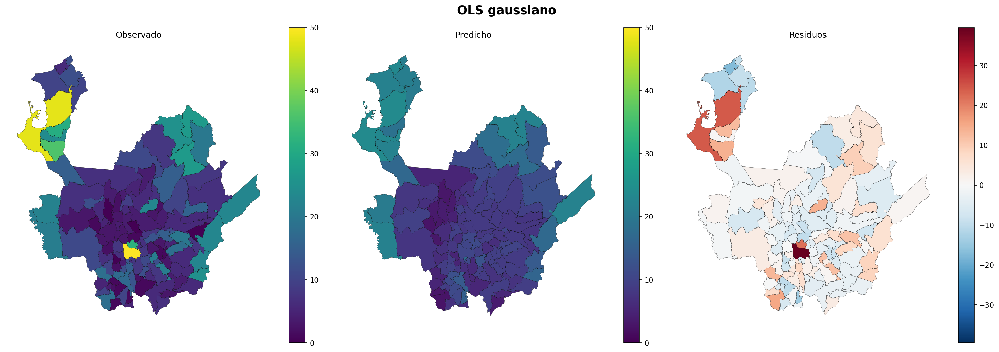

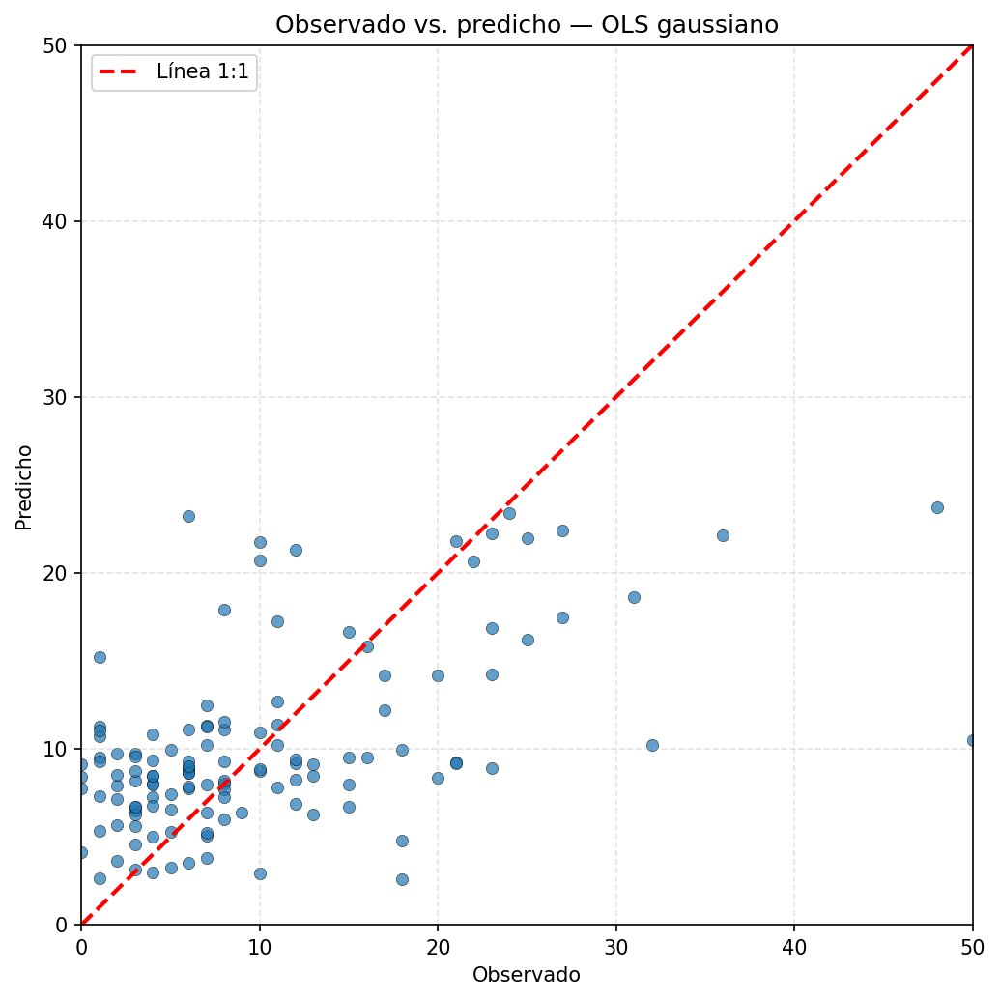

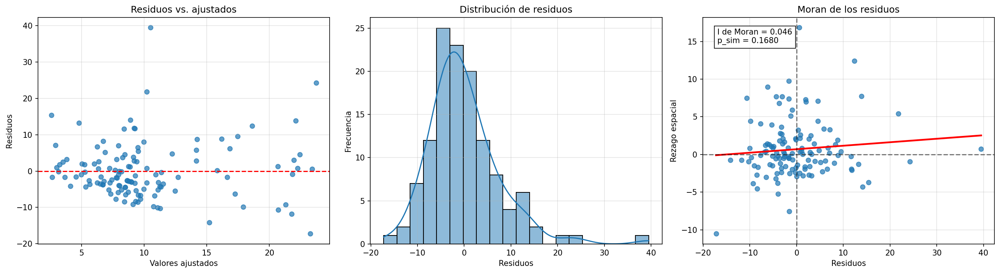

In [12]:
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler
import spreg

# Crear dummies sin borrar Subregion
if not any(c.startswith("Sg_") for c in gdf.columns):
    dummies = pd.get_dummies(
        gdf["Subregion"],
        prefix="Sg",
        drop_first=True,
        dtype=int
    )

dummies.columns = dummies.columns.str.replace(" ", "_")

gdf = pd.concat([gdf, dummies], axis=1)

variable_names = [
    #"Area",
    "Pend_mean",
    "Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    #"Gradiente"
] #+ [c for c in gdf.columns if c.startswith("Sg_")]


df_modelo = (
    gdf[["Tot_event", "geometry"] + variable_names]
    .replace(-9999, np.nan)
    .dropna()
    .copy()
)
scaler = StandardScaler()
df_modelo[variable_names] = scaler.fit_transform(df_modelo[variable_names])

formula = "Tot_event ~ " + " + ".join(variable_names)

modelo_ols = smf.ols(
    formula,
    data=df_modelo
).fit()

print(modelo_ols.summary())

y_obs = df_modelo["Tot_event"]
y_pred = modelo_ols.predict(df_modelo)

df_modelo["Predicho"] = y_pred
df_modelo["Residuo"] = y_obs - y_pred
df_modelo["Residuo_abs"] = np.abs(df_modelo["Residuo"]) 

metricas = metricas_statsmodels(
    modelo=modelo_ols,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=len(variable_names)
)

gdf_resultado, moran_residuos = graficas_statsmodels(
    gdf=gdf,
    indices=df_modelo.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="OLS gaussiano"
)

Modelo OLS con estandarización de variables

                            OLS Regression Results                            
Dep. Variable:             Dens_event   R-squared:                       0.212
Model:                            OLS   Adj. R-squared:                  0.186
Method:                 Least Squares   F-statistic:                     8.073
Date:                Fri, 10 Jul 2026   Prob (F-statistic):           8.47e-06
Time:                        13:14:52   Log-Likelihood:                 155.78
No. Observations:                 125   AIC:                            -301.6
Df Residuals:                     120   BIC:                            -287.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0485      0.006      7.628      0.0

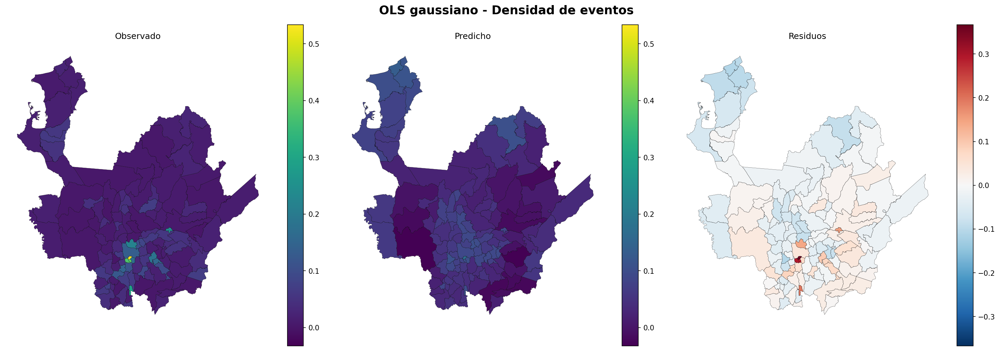

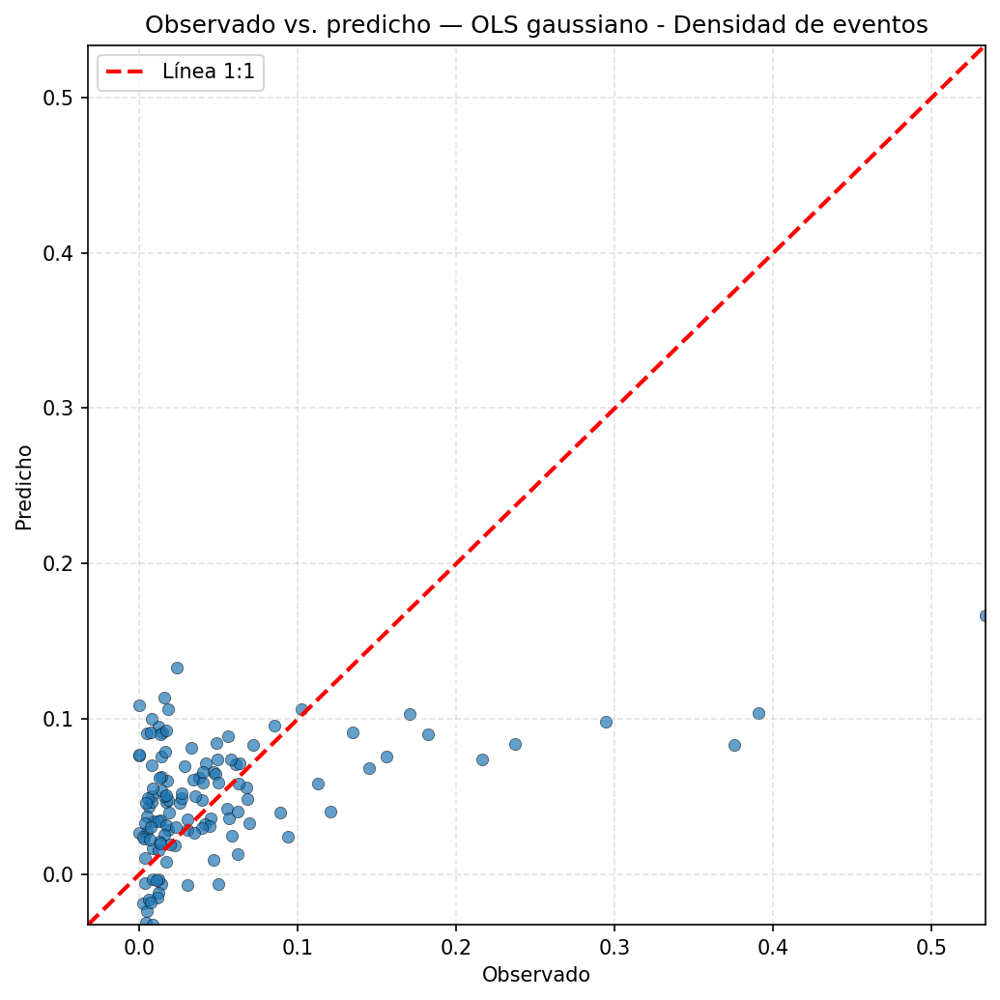

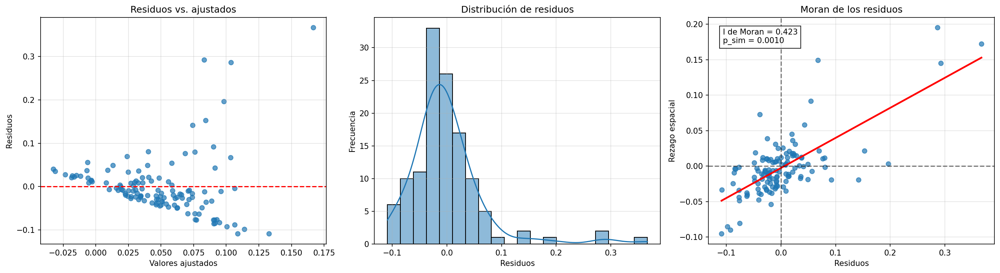

In [6]:

if not any(c.startswith("Sg_") for c in gdf.columns):

    dummies = pd.get_dummies(
        gdf["Subregion"],
        prefix="Sg",
        drop_first=True,
        dtype=int
    )

    dummies.columns = (
        dummies.columns
        .str.replace(" ", "_", regex=False)
        .str.replace("-", "_", regex=False)
    )

    gdf = pd.concat([gdf, dummies], axis=1)

# Variables continuas
vars_continuas = [
#    "Area",
    "Pend_mean",
    "LAI_mean",
#    "Curv_mean",
#    "TPI_mean",
    "TRI_mean",
    "Gradiente"
]


vars_dummy = [c for c in gdf.columns if c.startswith("Sg_")]
vars_dummy= []
# Base limpia
df = (
    gdf[["Tot_event"] + vars_continuas + vars_dummy]
    .replace(-9999, np.nan)
    .dropna()
    .copy()
)

# Densidad de eventos
df["Dens_event"] = df["Tot_event"] / gdf["Area"]

# Estandarizar únicamente variables continuas
scaler = StandardScaler()
df[vars_continuas] = scaler.fit_transform(df[vars_continuas])

# Fórmula del modelo
formula = "Dens_event ~ " + " + ".join(vars_continuas + vars_dummy)

# Modelo OLS gaussiano
modelo_densidad = smf.ols(
    formula=formula,
    data=df
).fit()

# Resumen del modelo correcto
print(modelo_densidad.summary())

# ==========================
# Observado y predicho
# ==========================
y_obs = df["Dens_event"]
y_pred = modelo_densidad.predict(df)

df["Predicho"] = y_pred
df["Residuo"] = y_obs - y_pred
df["Residuo_abs"] = np.abs(df["Residuo"])

metricas = metricas_statsmodels(
    modelo=modelo_densidad,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=len(vars_continuas + vars_dummy)
)

gdf_resultado, moran_residuos = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="OLS gaussiano - Densidad de eventos"
)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Tot_event   No. Observations:                  125
Model:                            GLM   Df Residuals:                      120
Model Family:                 Poisson   Df Model:                            4
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -760.63
Date:                Fri, 10 Jul 2026   Deviance:                       1056.3
Time:                        13:15:18   Pearson chi2:                 1.37e+03
No. Iterations:                     5   Pseudo R-squ. (CS):             0.9724
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.6700      0.031   -120.114      0.0

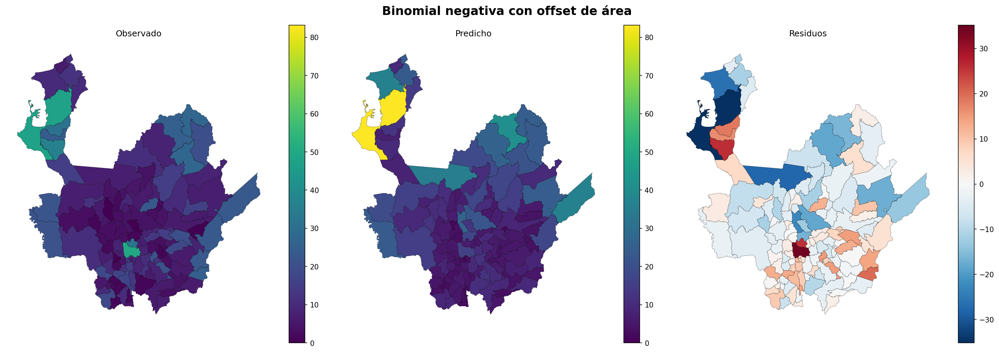

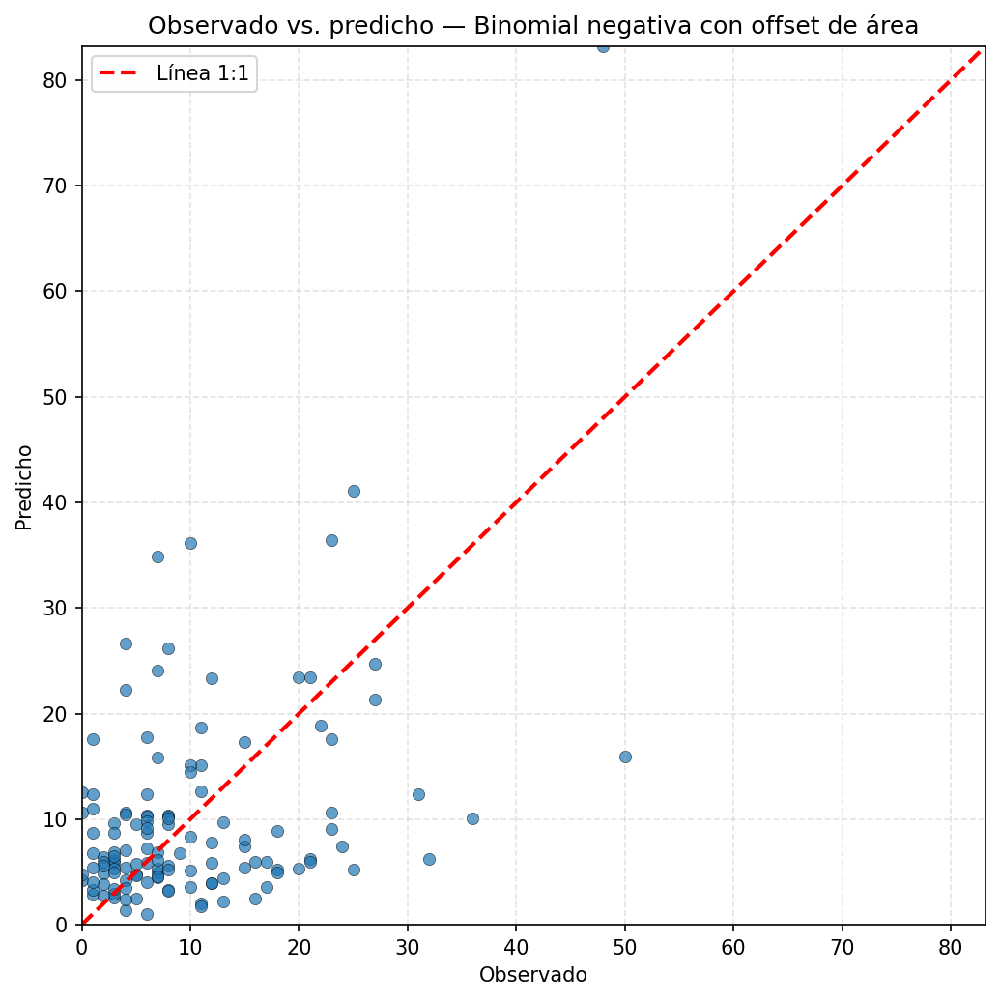

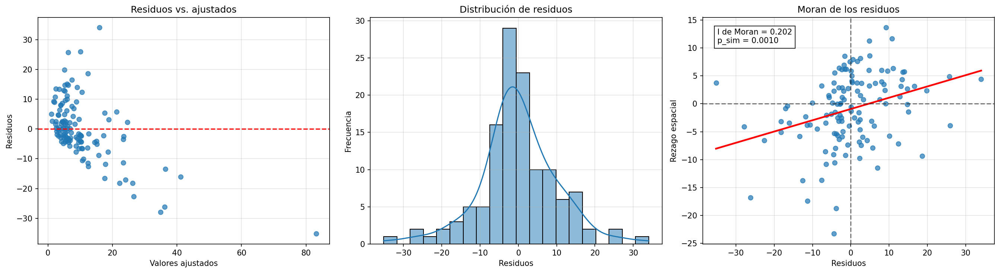

In [8]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod import families

# ==========================
# Variables
# ==========================
vars_continuas = [
    "Pend_mean",
    "Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    "Gradiente"
]

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area"] + vars_continuas]
    .replace(-9999, np.nan)
    .dropna()
    .copy()
)

df = df[df["Area"] > 0].copy()

# ==========================
# Estandarizar variables
# ==========================
scaler = StandardScaler()

X = pd.DataFrame(
    scaler.fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = sm.add_constant(X)

# ==========================
# Variable respuesta y offset
# ==========================
y = df["Tot_event"]

offset = np.log(df["Area"])

# ==========================
# Modelo binomial negativo
# ==========================
modelo_nb = GLM(
    y,
    X,
    family=families.Poisson(),
    offset=offset
).fit()

print(modelo_nb.summary())

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ==========================
# Predicciones
# ==========================
y_pred = modelo_nb.predict(
    exog=X,
    offset=offset
)

# ==========================
# Métricas manuales
# ==========================
y_obs = y.to_numpy(dtype=float)
y_pred = np.asarray(y_pred, dtype=float)

rmse = np.sqrt(mean_squared_error(y_obs, y_pred))
mae = mean_absolute_error(y_obs, y_pred)
r2 = r2_score(y_obs, y_pred)

n = len(y_obs)
p = X.shape[1] - 1

r2_ajustado = 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Pseudo R² de McFadden
pseudo_r2_mcfadden = 1 - modelo_nb.llf / modelo_nb.llnull

# Dispersión
dispersion_deviance = modelo_nb.deviance / modelo_nb.df_resid
dispersion_pearson = modelo_nb.pearson_chi2 / modelo_nb.df_resid

# BIC basado en log-verosimilitud
bic_llf = -2 * modelo_nb.llf + len(modelo_nb.params) * np.log(n)

print("\n" + "=" * 50)
print("MÉTRICAS DEL MODELO BINOMIAL NEGATIVO")
print("=" * 50)
print(f"RMSE                         : {rmse:.4f}")
print(f"MAE                          : {mae:.4f}")
print(f"R² observado-predicho        : {r2:.4f}")
print(f"R² ajustado                  : {r2_ajustado:.4f}")
print(f"Pseudo R² de McFadden        : {pseudo_r2_mcfadden:.4f}")
print(f"AIC                          : {modelo_nb.aic:.2f}")
print(f"BIC                          : {bic_llf:.2f}")
print(f"Log-Likelihood               : {modelo_nb.llf:.2f}")
print(f"Deviance                     : {modelo_nb.deviance:.4f}")
print(f"Pearson chi²                 : {modelo_nb.pearson_chi2:.4f}")
print(f"Deviance / gl residuales     : {dispersion_deviance:.4f}")
print(f"Pearson chi² / gl residuales : {dispersion_pearson:.4f}")
print("=" * 50)

# ==========================
# Guardar resultados
# ==========================
gdf["Observado"] = np.nan
gdf["Predicho"] = np.nan
gdf["Residuo"] = np.nan
gdf["Residuo_abs"] = np.nan

gdf.loc[df.index, "Observado"] = y_obs
gdf.loc[df.index, "Predicho"] = y_pred
gdf.loc[df.index, "Residuo"] = y_obs - y_pred
gdf.loc[df.index, "Residuo_abs"] = np.abs(y_obs - y_pred)

# ==========================
# Gráficas
# ==========================
gdf_resultado_nb, moran_residuos_nb = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="Binomial negativa con offset de área"
)

Media: 10.12
Varianza: 85.44516129032259
Proporción de ceros: 0.032
Optimization terminated successfully.
         Current function value: 4.810803
         Iterations: 37
         Function evaluations: 41
         Gradient evaluations: 41
                     ZeroInflatedPoisson Regression Results                    
Dep. Variable:               Tot_event   No. Observations:                  125
Model:             ZeroInflatedPoisson   Df Residuals:                      111
Method:                            MLE   Df Model:                           13
Date:                 Fri, 10 Jul 2026   Pseudo R-squ.:                  0.3858
Time:                         13:15:47   Log-Likelihood:                -601.35
converged:                        True   LL-Null:                       -979.06
Covariance Type:             nonrobust   LLR p-value:                4.838e-153
                         coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------

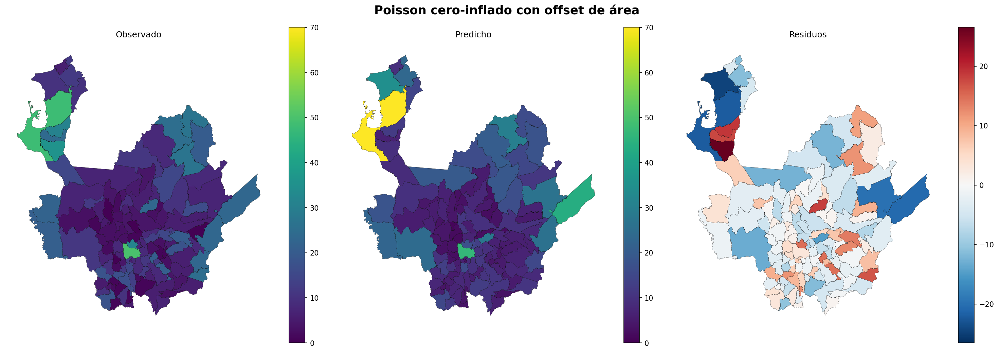

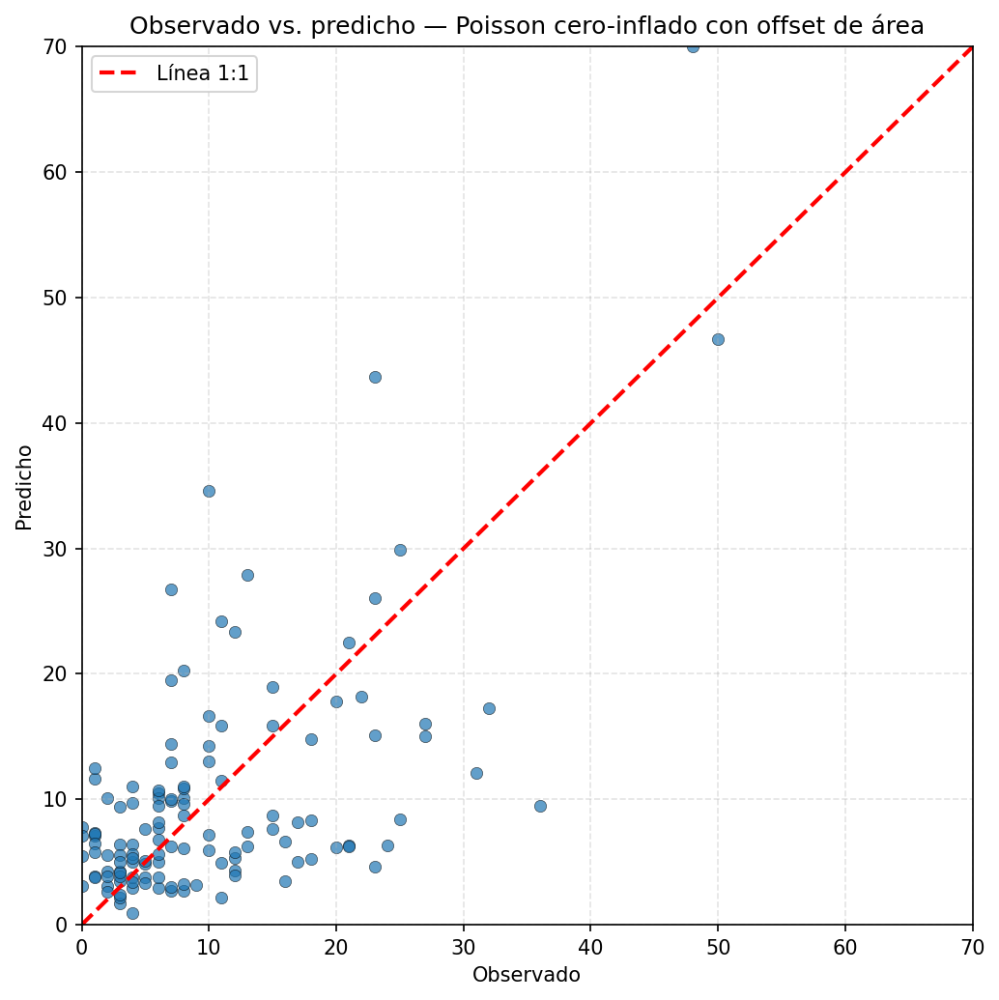

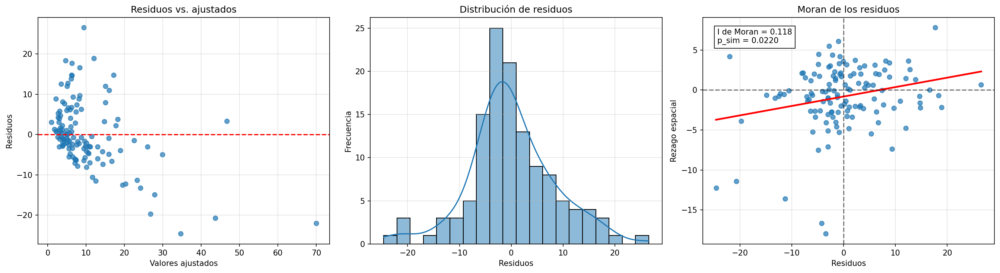

In [9]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler
from statsmodels.discrete.count_model import ZeroInflatedPoisson

# ==========================
# Variables
# ==========================
vars_continuas = [
    "Pend_mean",
    "Elev_mean",
    "LAI_mean",
    # "Curv_mean",
    # "TPI_mean",
    "TRI_mean",
    "Gradiente"
]

vars_dummy = [c for c in gdf.columns if c.startswith("Sg_")]

# Para excluir las subregiones:
# vars_dummy = []

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area"] + vars_continuas + vars_dummy]
    .replace(-9999, np.nan)
    .dropna()
    .copy()
)

df = df[df["Area"] > 0].copy()

print("Media:", df["Tot_event"].mean())
print("Varianza:", df["Tot_event"].var())
print("Proporción de ceros:", (df["Tot_event"] == 0).mean())

# ==========================
# Estandarizar continuas
# ==========================
scaler = StandardScaler()

X_cont = pd.DataFrame(
    scaler.fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = pd.concat(
    [X_cont, df[vars_dummy].astype(float)],
    axis=1
)

X = sm.add_constant(X)

# ==========================
# Respuesta y offset
# ==========================
y_obs = df["Tot_event"].astype(float)
offset = np.log(df["Area"])

# Componente de inflación de ceros:
# únicamente intercepto
X_infl = np.ones((len(df), 1))

# ==========================
# Modelo ZIP
# ==========================
modelo_zip = ZeroInflatedPoisson(
    endog=y_obs,
    exog=X,
    exog_infl=X_infl,
    offset=offset,
    inflation="logit"
).fit(
    method="bfgs",
    maxiter=500,
    disp=True
)

print(modelo_zip.summary())

# ==========================
# Predicción de conteos esperados
# ==========================
y_pred = modelo_zip.predict(
    exog=X,
    exog_infl=X_infl,
    offset=offset,
    which="mean"
)

# ==========================
# Métricas
# ==========================
metricas_zip = metricas_statsmodels(
    modelo=modelo_zip,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1] - 1
)

# ==========================
# Gráficas y Moran residual
# ==========================
gdf_resultado_zip, moran_residuos_zip = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="Poisson cero-inflado con offset de área"
)

c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


                 Generalized Linear Model Regression Results                  
Dep. Variable:              Tot_event   No. Observations:                  125
Model:                            GLM   Df Residuals:                      121
Model Family:        NegativeBinomial   Df Model:                            3
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -406.42
Date:                Tue, 14 Jul 2026   Deviance:                       71.145
Time:                        17:02:42   Pearson chi2:                     58.4
No. Iterations:                     6   Pseudo R-squ. (CS):             0.1991
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.1925      0.095     23.127      0.0

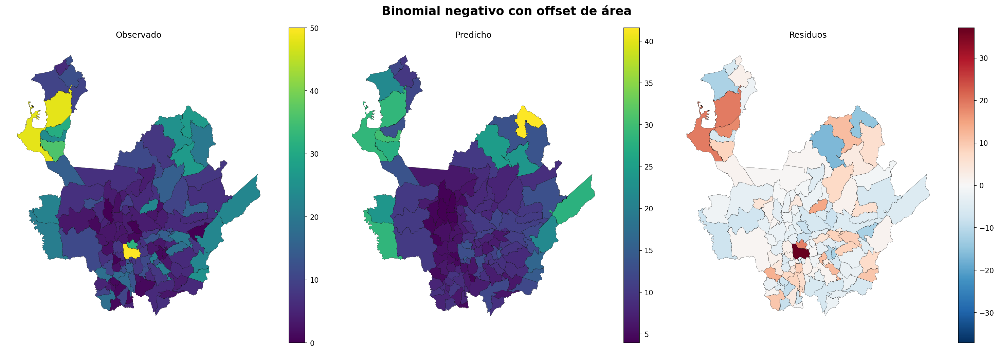

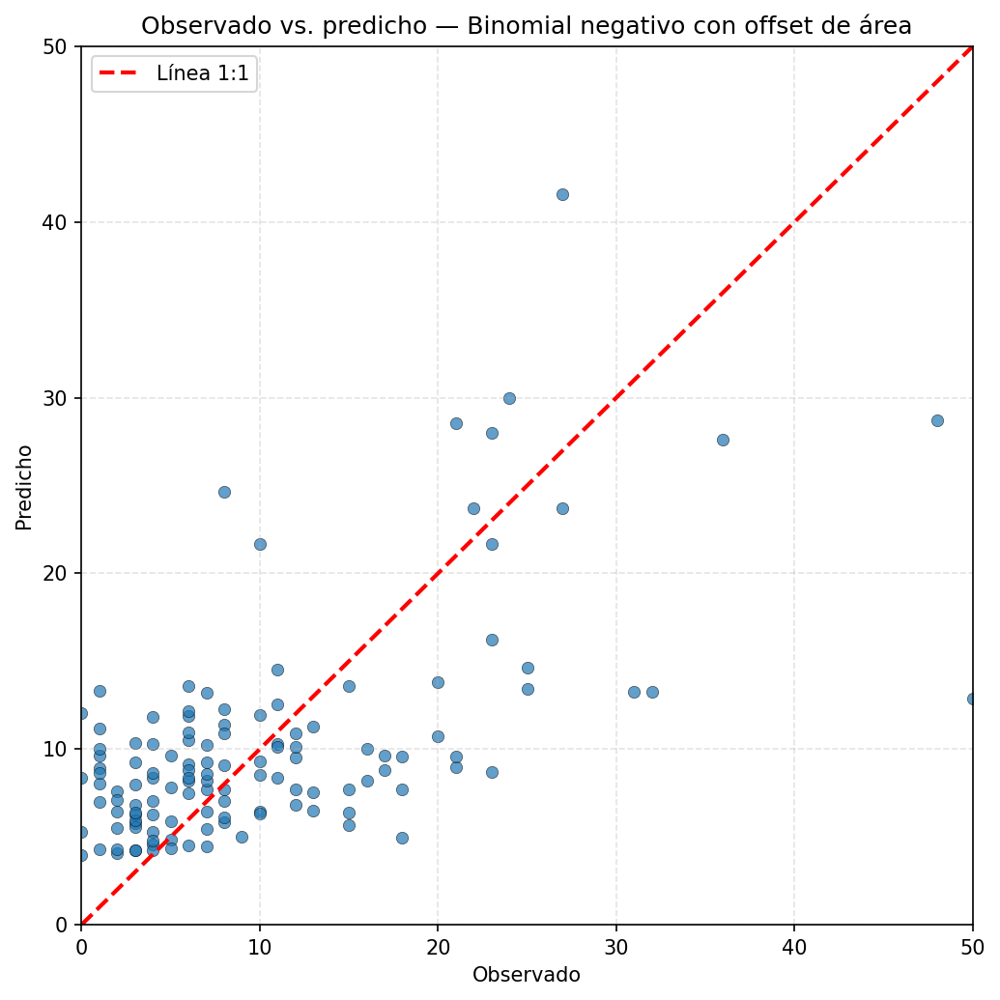

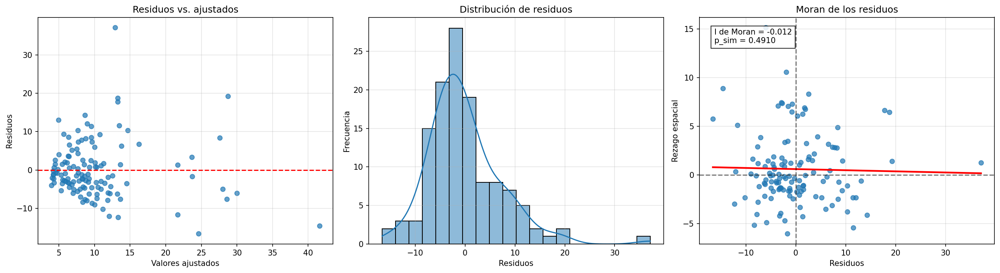

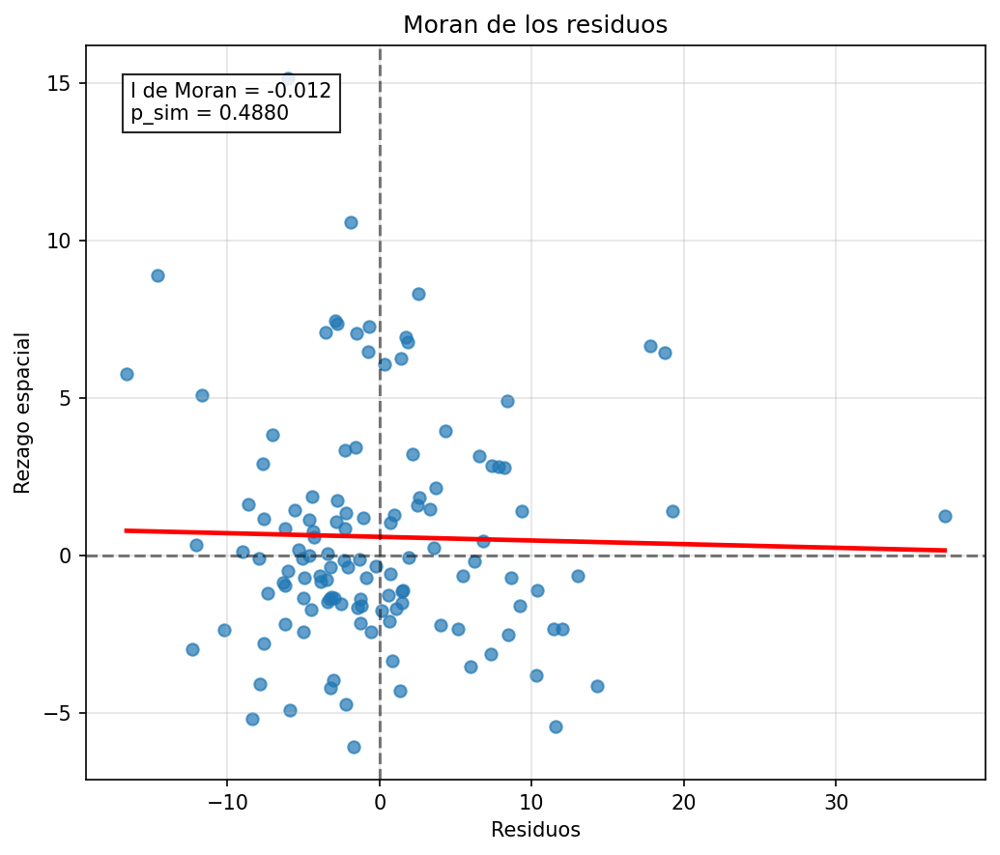

In [27]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod import families
from sklearn.preprocessing import StandardScaler

y = gdf['Tot_event']
var = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    #"TRI_mean",
    #"Gradiente",
    #"Pend_std",
    #"Elev_std",
    "LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    "Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
]

var = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    #"TRI_mean",
    #"Gradiente",
    #"Pend_std",
    #"Elev_std",
    "LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    "Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
] 

vars_dummy = [c for c in gdf.columns if c.startswith("Sg_")]

exposure = np.log(gdf['Area']) 
st = StandardScaler()
X_scaled = st.fit_transform(gdf[var])
X = sm.add_constant(X_scaled)
negative_binomial_model_offset = GLM(y, X, family=families.NegativeBinomial()).fit()
print(negative_binomial_model_offset.summary())
y_pred_freq_offset_nb = negative_binomial_model_offset.predict(X)
gdf['y_pred'] = y_pred_freq_offset_nb
gdf['Diferencias'] = gdf['Tot_event'] - gdf['y_pred']

metricas_zip = metricas_statsmodels(
    modelo=negative_binomial_model_offset,
    y_obs=y,
    y_pred=gdf["y_pred"],
    n_variables=X.shape[1] - 1
)

gdf_resultado_nb, moran_residuos_nb = graficas_statsmodels(
    gdf=gdf,
    indices=gdf.index,
    y_obs=gdf["Tot_event"],
    y_pred=gdf["y_pred"],
    nombre_modelo="Binomial negativo con offset de área"
)

moran_residuos_nb = graficar_moran_residuos(
    gdf=gdf,
    y_obs=gdf["Tot_event"],
    y_pred=gdf["y_pred"]
)


                 Generalized Linear Model Regression Results                  
Dep. Variable:              Tot_event   No. Observations:                  125
Model:                            GLM   Df Residuals:                      119
Model Family:                 Poisson   Df Model:                            5
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -541.25
Date:                Tue, 14 Jul 2026   Deviance:                       617.55
Time:                        17:16:10   Pearson chi2:                     703.
No. Iterations:                     5   Pseudo R-squ. (CS):             0.9061
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.2084      0.031     71.705      0.0

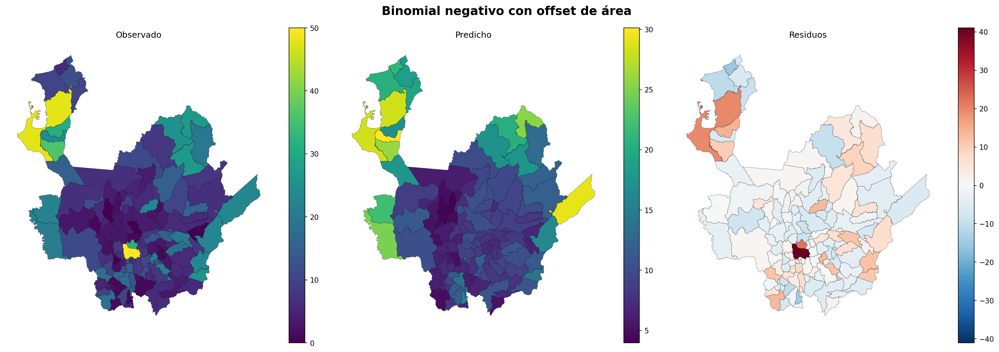

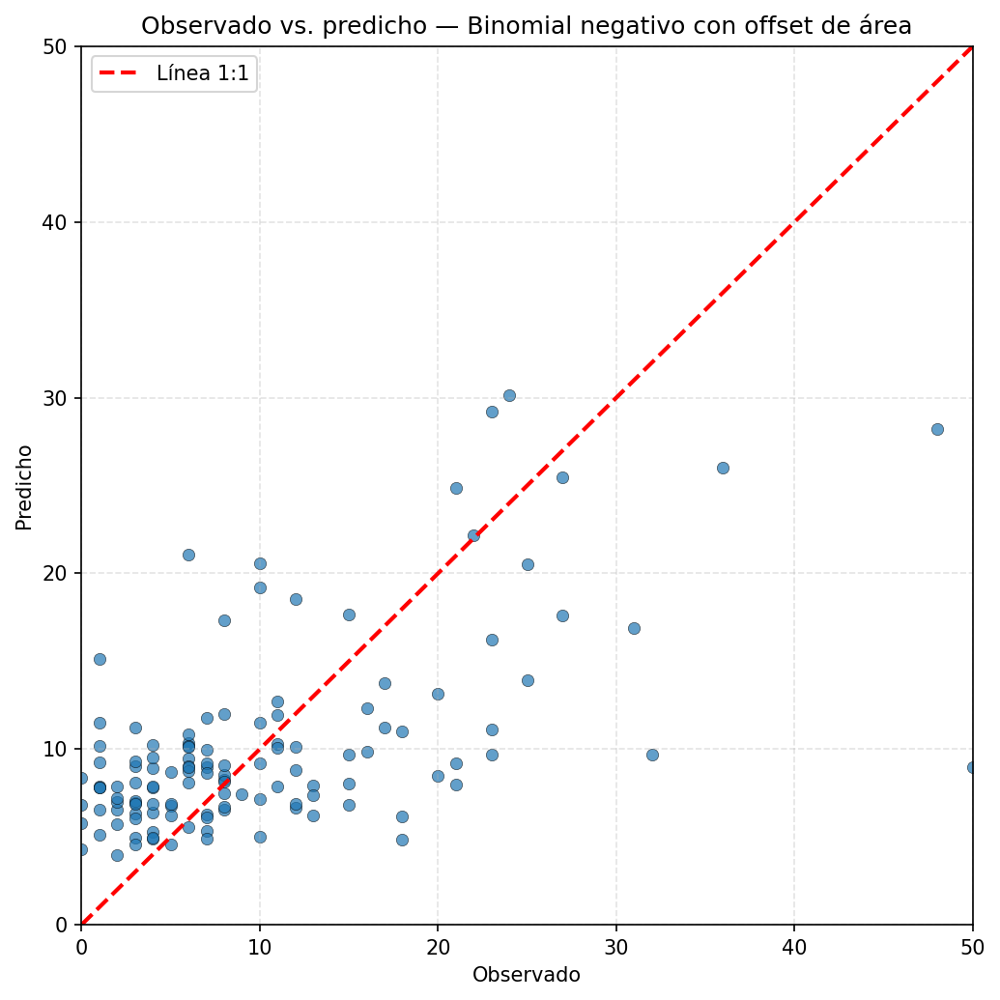

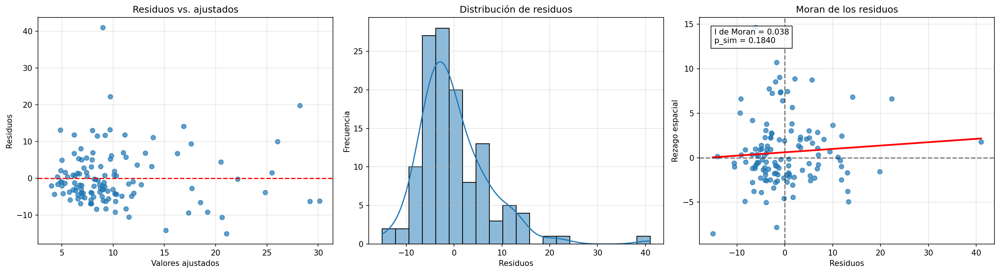

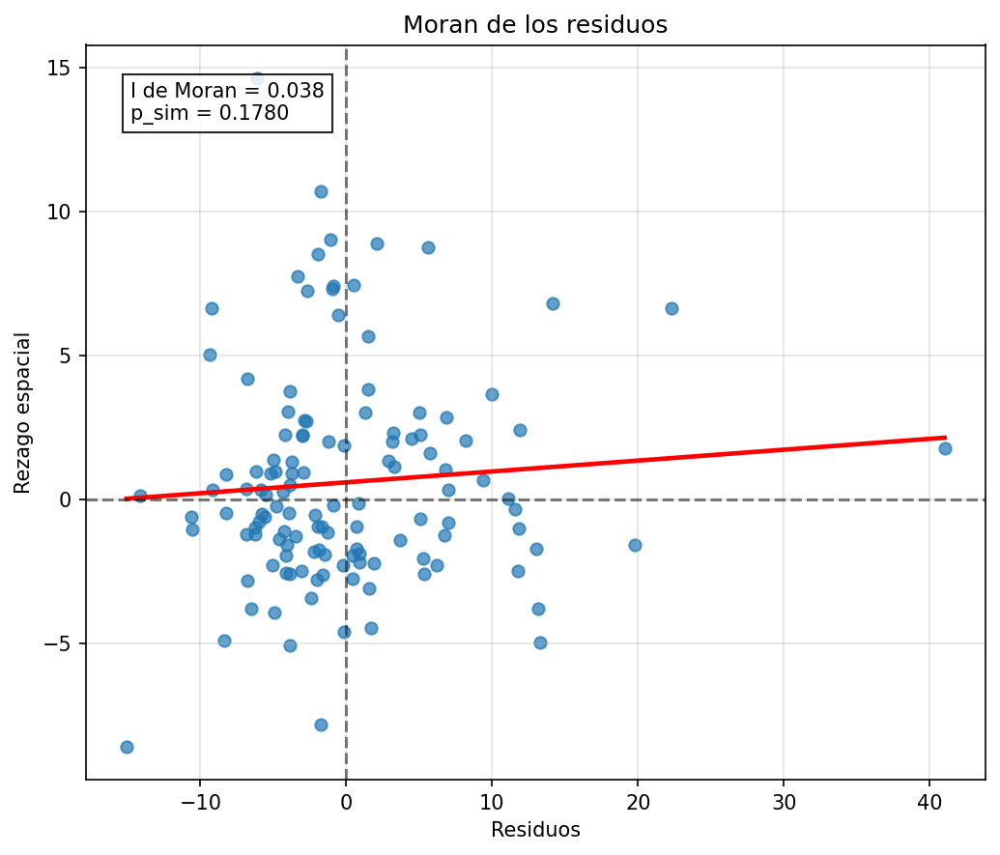

In [31]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod import families
from sklearn.preprocessing import StandardScaler

y = gdf['Tot_event']
var = [
    "Pend_mean",
    "Elev_mean",
    "LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    "Gradiente",
    #"Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    #"Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
] 

vars_dummy = [c for c in gdf.columns if c.startswith("Sg_")]

exposure = np.log(gdf['Area']) 
st = StandardScaler()
X_scaled = st.fit_transform(gdf[var])
X = sm.add_constant(X_scaled)
negative_binomial_model_offset = GLM(y, X, family=families.Poisson()).fit()
print(negative_binomial_model_offset.summary())
y_pred_freq_offset_nb = negative_binomial_model_offset.predict(X)
gdf['y_pred'] = y_pred_freq_offset_nb
gdf['Diferencias'] = gdf['Tot_event'] - gdf['y_pred']

metricas_zip = metricas_statsmodels(
    modelo=negative_binomial_model_offset,
    y_obs=y,
    y_pred=gdf["y_pred"],
    n_variables=X.shape[1] - 1
)

gdf_resultado_nb, moran_residuos_nb = graficas_statsmodels(
    gdf=gdf,
    indices=gdf.index,
    y_obs=gdf["Tot_event"],
    y_pred=gdf["y_pred"],
    nombre_modelo="Binomial negativo con offset de área"
)

moran_residuos_nb = graficar_moran_residuos(
    gdf=gdf,
    y_obs=gdf["Tot_event"],
    y_pred=gdf["y_pred"]
)

ML_Lag
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG WITH SLX - SPATIAL DURBIN MODEL (METHOD = FULL)
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :       KNN_5
Dependent Variable  :log(Tot_event + 1) - log(Area)                Number of Observations:         125
Mean dependent var  :     -3.5989                Number of Variables   :           6
S.D. dependent var  :      1.1412                Degrees of Freedom    :         119
Pseudo R-squared    :      0.3488
Spatial Pseudo R-squared:  0.1050
Log likelihood      :   -171.8320
Sigma-square ML     :      0.8567                Akaike info criterion :     355.664
S.E of regression   :      0.9256                Schwarz criterion     :     372.634

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic    

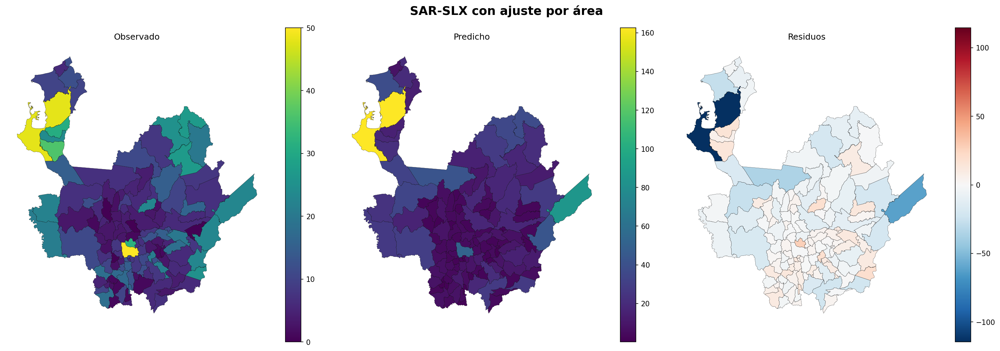

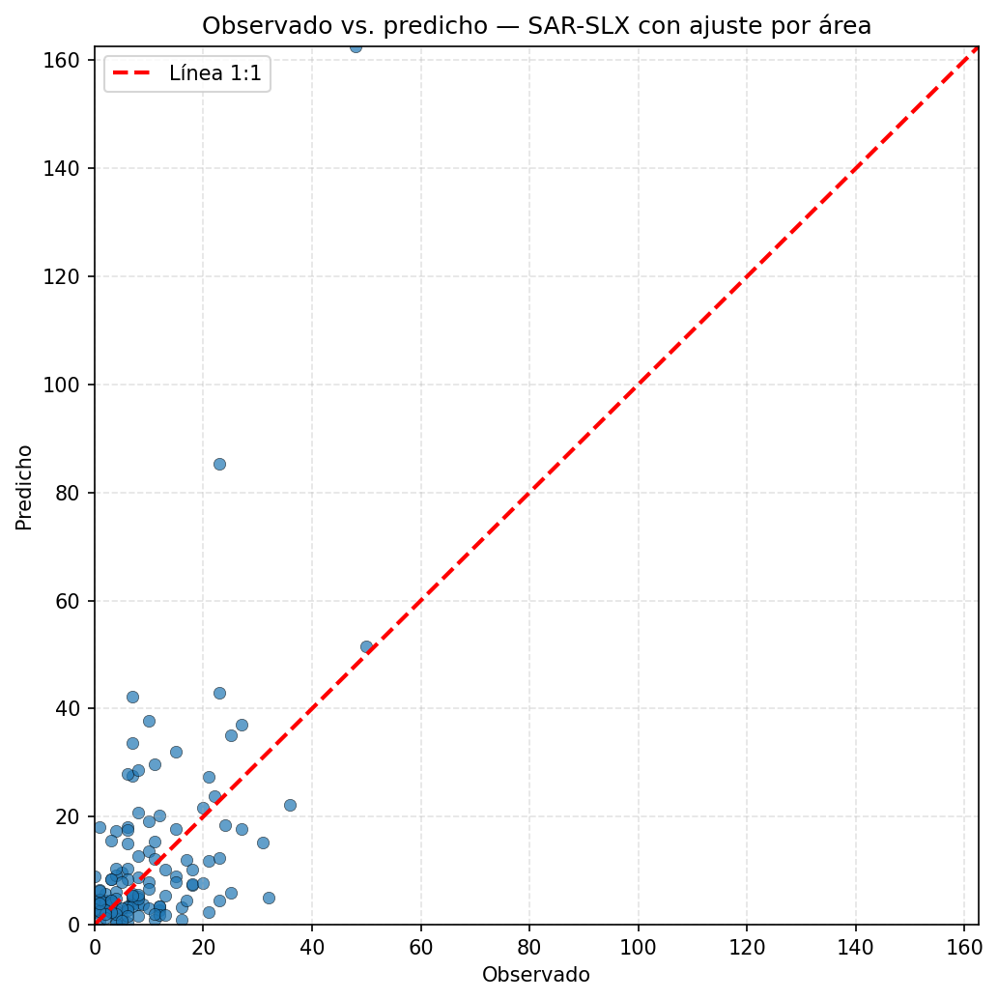

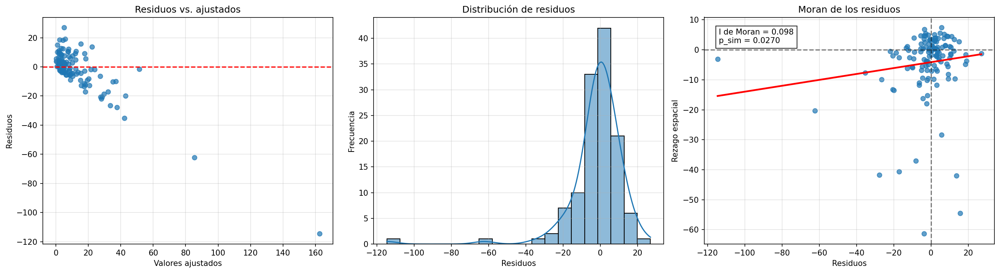

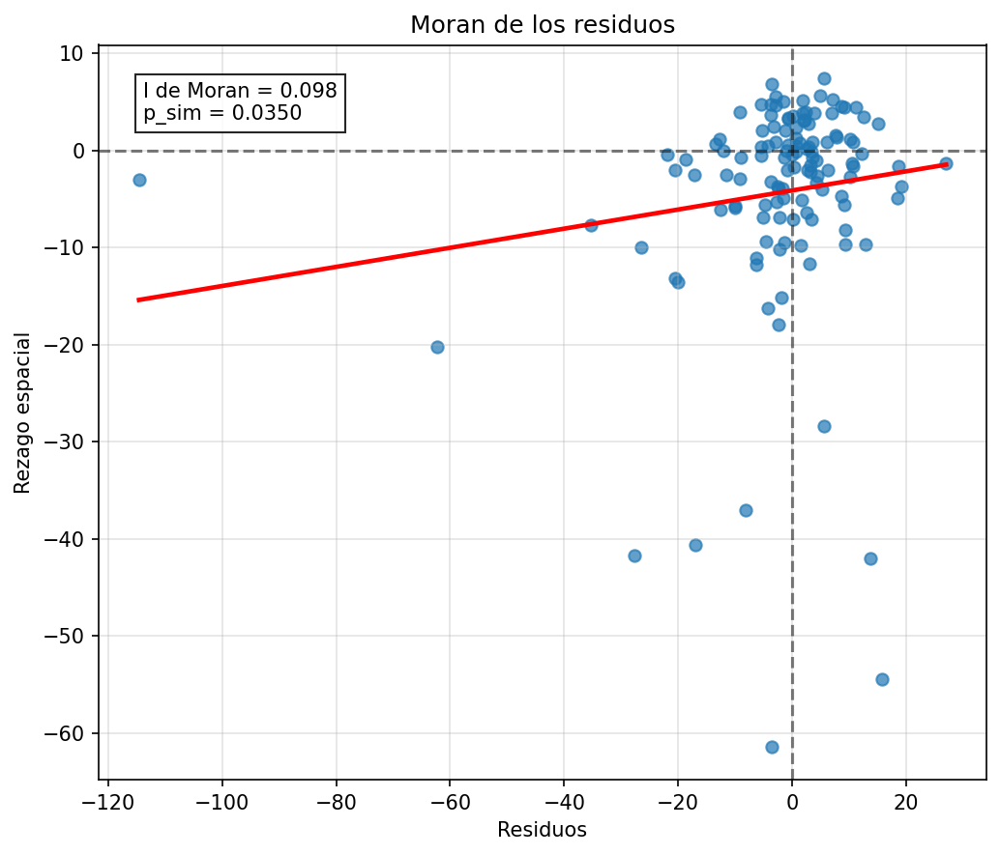

In [36]:
import spreg

# ==========================
# Variables
# ==========================
var = [
    "Pend_mean",
#    "Elev_mean",
#    "LAI_mean",
#    "Curv_mean",
#    "TPI_mean",
    "TRI_mean",
#    "Gradiente"
]

vars_dummy = [c for c in gdf.columns if c.startswith("Sg_")]

# Para excluir subregiones:
# vars_dummy = []

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area", "geometry"] + var + vars_dummy]
    .replace(-9999, np.nan)
    .dropna()
    .query("Area > 0")
    .copy()
)

# ==========================
# Respuesta ajustada por área
# ==========================
df["y_offset"] = (
    np.log(df["Tot_event"] + 1)
    - np.log(df["Area"])
)

y = df[["y_offset"]].values

# ==========================
# Variables explicativas
# ==========================
X_cont = pd.DataFrame(
    StandardScaler().fit_transform(df[var]),
    columns=var,
    index=df.index
)

X = pd.concat(
    [X_cont, df[vars_dummy].astype(float)],
    axis=1
)

# ==========================
# Matriz KNN de 5 vecinos
# ==========================
df_w = (
    df.to_crs(df.estimate_utm_crs())
    if df.crs.is_geographic
    else df.copy()
)

w = weights.KNN.from_dataframe(df_w, k=5)
w.transform = "R"

# ==========================
# Modelo SAR-SLX
# ==========================
modelo_sar_slx = spreg.ML_Lag(
    y=y,
    x=X.values,
    w=w,
    slx_lags=1,
    method="full",
    name_y="log(Tot_event + 1) - log(Area)",
    name_x=list(X.columns),
    name_w="KNN_5"
)

print(modelo_sar_slx.summary)

# ==========================
# Predicciones en escala original
# ==========================
y_pred_offset = modelo_sar_slx.predy.flatten()

y_pred = (
    np.exp(
        y_pred_offset + np.log(df["Area"].values)
    ) - 1
)

y_obs = df["Tot_event"].to_numpy()

gdf["y_pred_sar"] = np.nan
gdf["Diferencias_sar"] = np.nan

gdf.loc[df.index, "y_pred_sar"] = y_pred
gdf.loc[df.index, "Diferencias_sar"] = y_obs - y_pred

# ==========================
# Métricas
# ==========================
metricas_sar = metricas_statsmodels(
    modelo=modelo_sar_slx,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1]
)

# ==========================
# Gráficas
# ==========================
gdf_resultado_sar, moran_residuos_sar = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="SAR-SLX con ajuste por área"
)

moran_residuos_nb = graficar_moran_residuos(
    gdf=gdf,
    y_obs=y_obs,
    y_pred=y_pred,
)

ML_Lag
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG WITH SLX - SPATIAL DURBIN MODEL (METHOD = FULL)
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :       KNN_5
Dependent Variable  :log(Tot_event + 1) - log(Area)                Number of Observations:         125
Mean dependent var  :     -3.5989                Number of Variables   :           6
S.D. dependent var  :      1.1412                Degrees of Freedom    :         119
Pseudo R-squared    :      0.3811
Spatial Pseudo R-squared:  0.0914
Log likelihood      :   -170.3667
Sigma-square ML     :      0.8218                Akaike info criterion :     352.733
S.E of regression   :      0.9065                Schwarz criterion     :     369.703

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic    

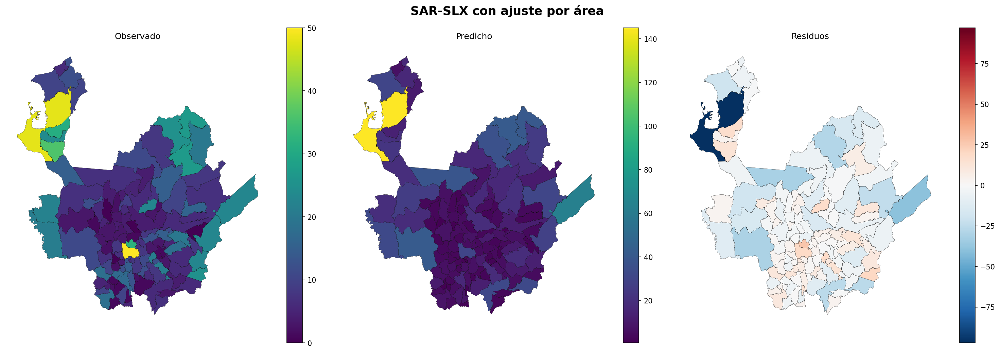

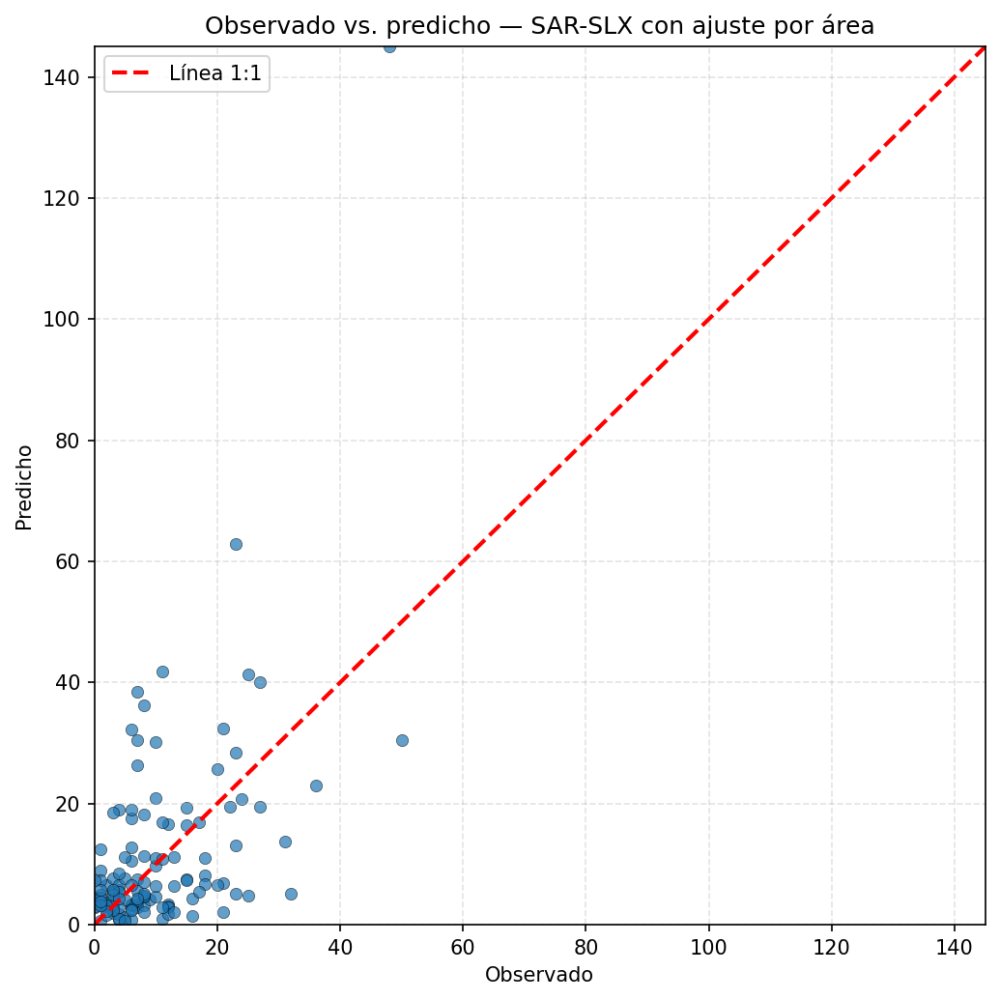

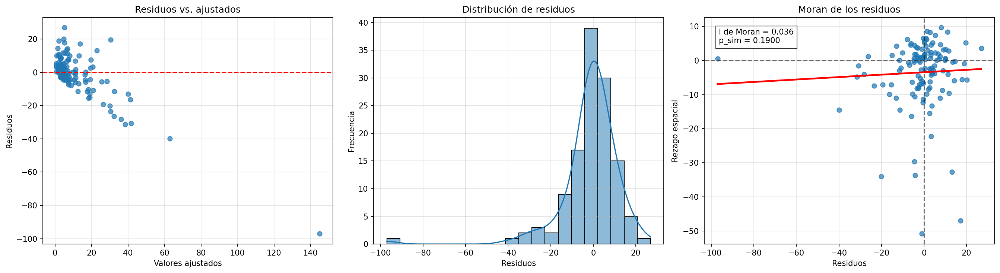

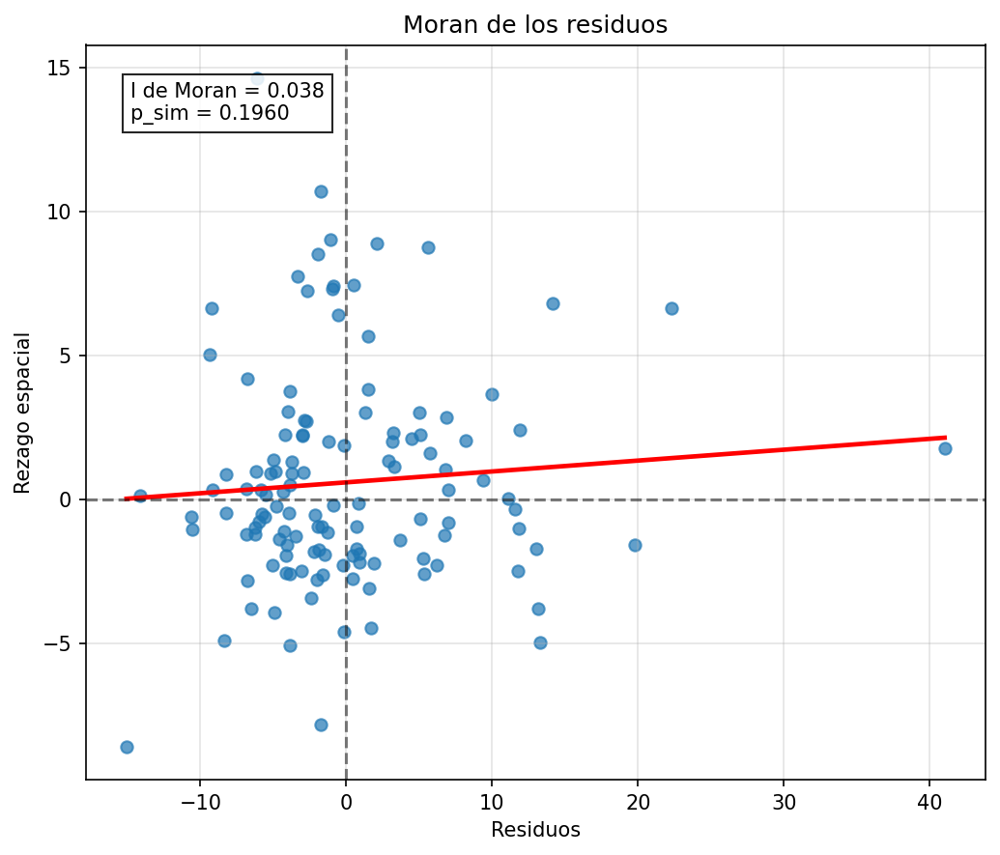

In [38]:
import numpy as np
import pandas as pd
import spreg
from libpysal import weights
from sklearn.preprocessing import StandardScaler

# ==========================
# Variables explicativas
# ==========================
vars_continuas = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    #"Gradiente",
    #"Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    #"Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
] 

vars_dummy = [c for c in gdf.columns if c.startswith("Sg_")]
vars_dummy = []

variables = vars_continuas + vars_dummy

df = gdf[["Tot_event", "Area", "geometry"] + variables].replace(-9999, np.nan).dropna().copy()
df["log_Area"] = np.log(df["Area"])
df["y_offset"] = np.log(df["Tot_event"] + 1) - df["log_Area"]

if df.crs.is_geographic:
    df_w = df.to_crs(df.estimate_utm_crs())
else:
    df_w = df.copy()

w = weights.Queen.from_dataframe(df_w)
w.transform = "R"

scaler = StandardScaler()

X_cont = pd.DataFrame(
    scaler.fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = pd.concat([X_cont, df[vars_dummy]], axis=1)

y = df[["y_offset"]].values

modelo_sar_slx = spreg.ML_Lag(
    y,
    X.values,
    w=w,
    slx_lags=1,
    name_y="log(Tot_event + 1) - log(Area)",
    name_x=list(X.columns),
    name_w="KNN_5",
    method="full"
)

print(modelo_sar_slx.summary)

# ==========================
# Predicciones del SAR-SLX
# ==========================
y_pred_offset = modelo_sar_slx.predy.flatten()

# Volver a escala de eventos
y_pred = np.exp(
    y_pred_offset + df["log_Area"].to_numpy()
) - 1

y_obs = df["Tot_event"].to_numpy(dtype=float)

# Evitar valores negativos por la transformación inversa
y_pred = np.maximum(y_pred, 0)

# ==========================
# Guardar resultados
# ==========================
gdf["y_pred_sar"] = np.nan
gdf["Diferencias_sar"] = np.nan
gdf["Residuo_offset"] = np.nan

gdf.loc[df.index, "y_pred_sar"] = y_pred
gdf.loc[df.index, "Diferencias_sar"] = y_obs - y_pred
gdf.loc[df.index, "Residuo_offset"] = modelo_sar_slx.u.flatten()

# ==========================
# Métricas
# ==========================
metricas_sar = metricas_statsmodels(
    modelo=modelo_sar_slx,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1]
)

# ==========================
# Gráficas
# ==========================
gdf_resultado_sar, moran_residuos_sar = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="SAR-SLX con ajuste por área"
)
moran_residuos_nb = graficar_moran_residuos(
    gdf=gdf,
    y_obs=gdf["Tot_event"],
    y_pred=gdf["y_pred"]
)

In [ ]:
import numpy as np
import pandas as pd
import spreg

from libpysal import weights
from sklearn.preprocessing import StandardScaler

# ==========================
# Variables explicativas
# ==========================
vars_continuas = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    "Gradiente",
    #"Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    #"Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
] 
vars_dummy = []

variables = vars_continuas + vars_dummy

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area", "geometry"] + variables]
    .replace(-9999, np.nan)
    .dropna()
    .query("Area > 0")
    .copy()
)

# ==========================
# Respuesta ajustada por área
# ==========================
df["log_Area"] = np.log(df["Area"])

df["y_offset"] = (
    np.log(df["Tot_event"] + 1)
    - df["log_Area"]
)

# ==========================
# Reproyección para distancias
# ==========================
if df.crs.is_geographic:
    df_w = df.to_crs(df.estimate_utm_crs())
else:
    df_w = df.copy()

# ==========================
# Matriz KNN de 5 vecinos
# ==========================
w = weights.Queen.from_dataframe(df_w)

w.transform = "R"

# ==========================
# Estandarizar variables
# ==========================
scaler = StandardScaler()

X_cont = pd.DataFrame(
    scaler.fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = pd.concat(
    [X_cont, df[vars_dummy].astype(float)],
    axis=1
)

y = df[["y_offset"]].values

# ==========================
# MODELO SAR
# Spatially Lagged Y Model
# ==========================
modelo_sar = spreg.ML_Lag(
    y=y,
    x=X.values,
    w=w,
    method="full",
    name_y="log(Tot_event + 1) - log(Area)",
    name_x=list(X.columns),
    name_w="KNN_5"
)

print(modelo_sar.summary)

# ==========================
# Predicciones en escala del modelo
# ==========================
y_pred_offset = modelo_sar.predy.flatten()

# ==========================
# Regresar a escala de eventos
# ==========================
y_pred = (
    np.exp(
        y_pred_offset
        + df["log_Area"].to_numpy()
    )
    - 1
)

y_pred = np.maximum(y_pred, 0)

y_obs = df["Tot_event"].to_numpy(dtype=float)

# ==========================
# Guardar resultados
# ==========================
gdf["y_pred_sar"] = np.nan
gdf["Diferencias_sar"] = np.nan
gdf["Residuo_offset_sar"] = np.nan

gdf.loc[df.index, "y_pred_sar"] = y_pred

gdf.loc[df.index, "Diferencias_sar"] = (
    y_obs - y_pred
)

gdf.loc[df.index, "Residuo_offset_sar"] = (
    modelo_sar.u.flatten()
)

# ==========================
# Métricas
# ==========================
metricas_sar = metricas_statsmodels(
    modelo=modelo_sar,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1]
)

# ==========================
# Gráficas
# ==========================
gdf_resultado_sar, moran_residuos_sar = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="SAR: Spatially Lagged Y Model"
)

moran_residuos_nb = graficar_moran_residuos(
    gdf=gdf,
    y_obs=y_obs,
    y_pred=y_pred,
)

ML_Lag
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :       KNN_5
Dependent Variable  :log(Tot_event + 1) - log(Area)                Number of Observations:         125
Mean dependent var  :     -3.5989                Number of Variables   :           5
S.D. dependent var  :      1.1412                Degrees of Freedom    :         120
Pseudo R-squared    :      0.4236
Spatial Pseudo R-squared:  0.2540
Log likelihood      :   -162.8081
Sigma-square ML     :      0.7496                Akaike info criterion :     335.616
S.E of regression   :      0.8658                Schwarz criterion     :     349.758

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
-------------------

ML_Error
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR WITH SLX (SLX-Error) (METHOD = full)
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :       Queen
Dependent Variable  :log(Tot_event + 1) - log(Area)                Number of Observations:         125
Mean dependent var  :     -3.5989                Number of Variables   :           7
S.D. dependent var  :      1.1412                Degrees of Freedom    :         118
Pseudo R-squared    :      0.2347
Log likelihood      :   -161.2803
Sigma-square ML     :      0.7134                Akaike info criterion :     336.561
S.E of regression   :      0.8446                Schwarz criterion     :     356.359

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
--------------------------------------------

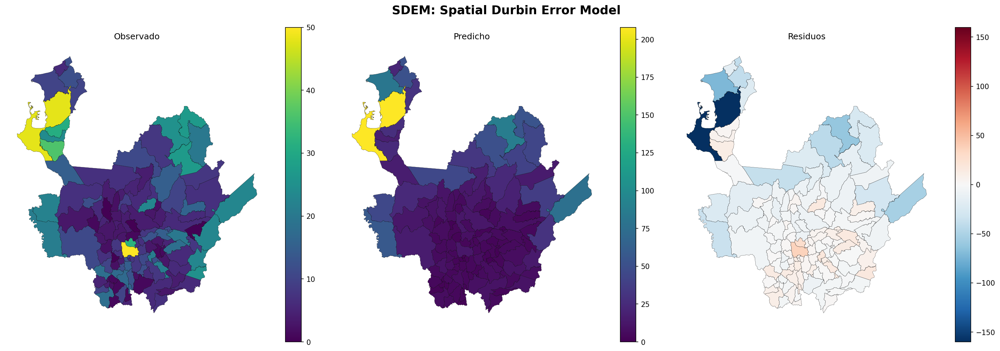

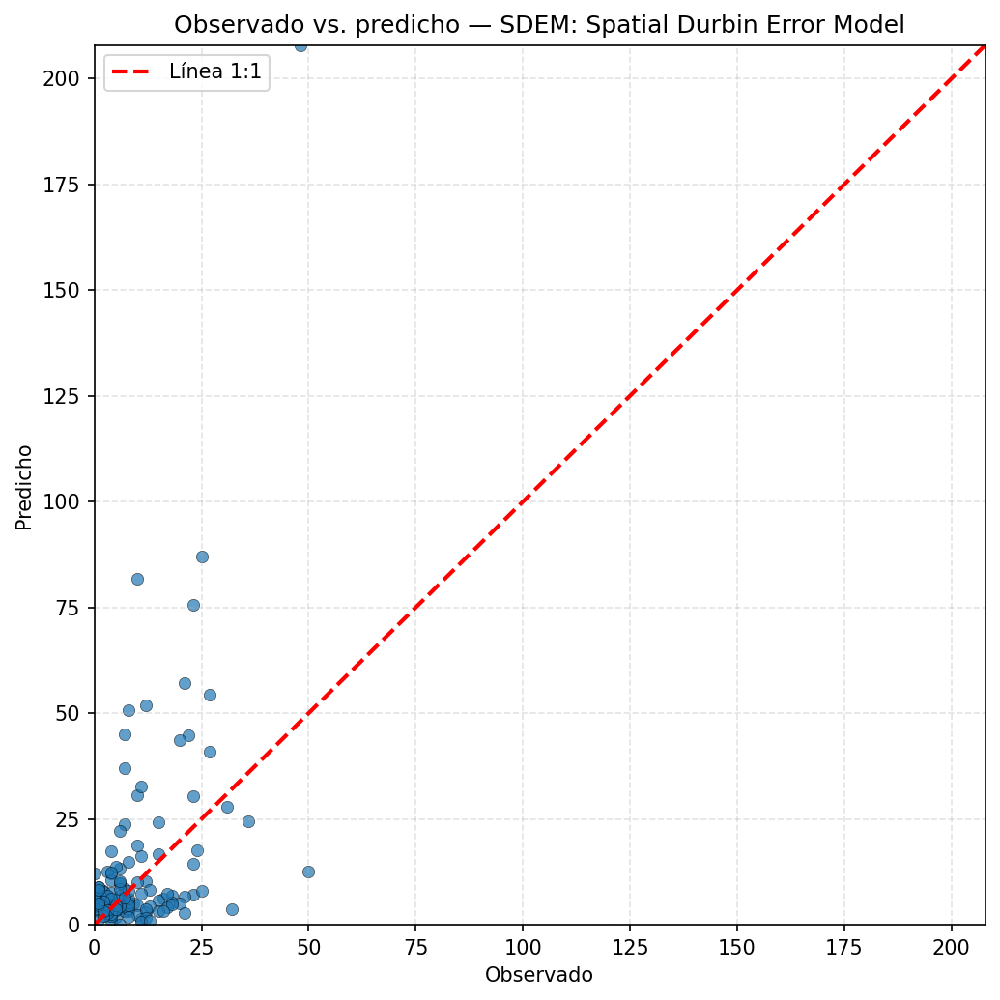

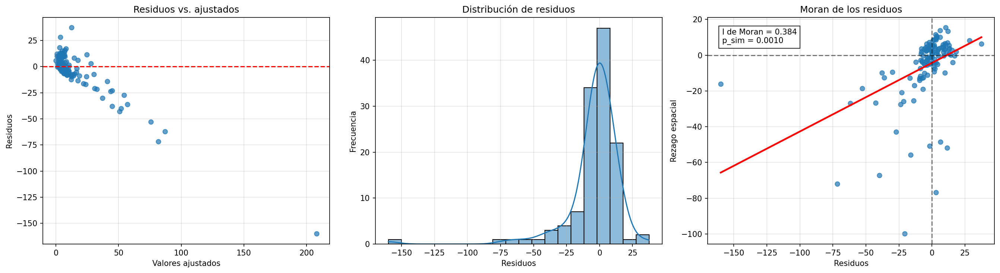

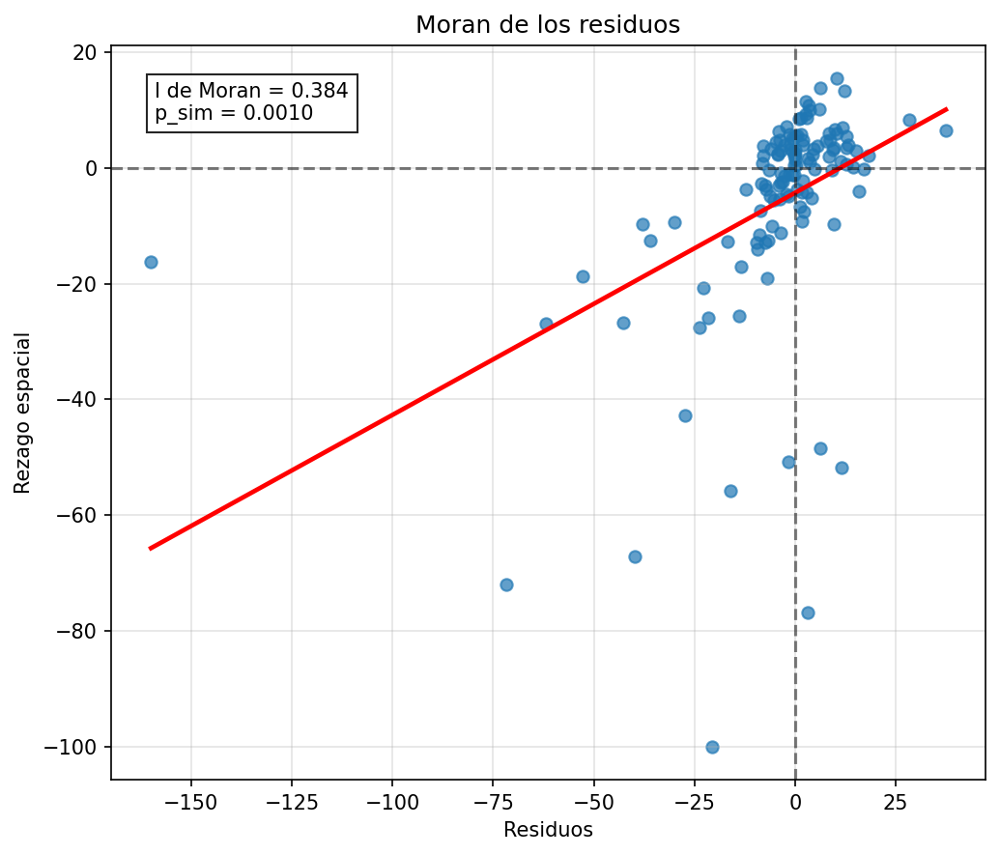

In [44]:
import numpy as np
import pandas as pd
import spreg

from libpysal import weights
from sklearn.preprocessing import StandardScaler

# ==========================
# Variables explicativas
# ==========================
vars_continuas = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    "Gradiente",
    #"Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    #"Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
] 

vars_dummy = []

variables = vars_continuas + vars_dummy

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area", "geometry"] + variables]
    .replace(-9999, np.nan)
    .dropna()
    .query("Area > 0")
    .copy()
)

# ==========================
# Respuesta ajustada por área
# ==========================
df["log_Area"] = np.log(df["Area"])

df["y_offset"] = (
    np.log(df["Tot_event"] + 1)
    - df["log_Area"]
)

# ==========================
# Proyección para calcular vecinos
# ==========================
df_w = (
    df.to_crs(df.estimate_utm_crs())
    if df.crs.is_geographic
    else df.copy()
)

# ==========================
# Matriz KNN de 5 vecinos
# ==========================
w = weights.Queen.from_dataframe(df_w)

w.transform = "R"

# ==========================
# Estandarizar variables
# ==========================
X_cont = pd.DataFrame(
    StandardScaler().fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = pd.concat(
    [X_cont, df[vars_dummy].astype(float)],
    axis=1
)

y = df[["y_offset"]].to_numpy()

# ==========================
# MODELO SDEM
# Spatial Durbin Error Model
# ==========================
modelo_sdem = spreg.ML_Error(
    y=y,
    x=X.to_numpy(),
    w=w,
    slx_lags=1,
    method="full",
    name_y="log(Tot_event + 1) - log(Area)",
    name_x=list(X.columns),
    name_w="Queen"
)

print(modelo_sdem.summary)

# ==========================
# Predicciones en escala del modelo
# ==========================
y_pred_offset = modelo_sdem.predy.flatten()

# ==========================
# Regresar a escala de eventos
# ==========================
y_pred = (
    np.exp(
        y_pred_offset
        + df["log_Area"].to_numpy()
    )
    - 1
)

y_pred = np.maximum(y_pred, 0)

y_obs = df["Tot_event"].to_numpy(dtype=float)

# ==========================
# Guardar resultados
# ==========================
gdf["y_pred_sdem"] = np.nan
gdf["Diferencias_sdem"] = np.nan
gdf["Residuo_offset_sdem"] = np.nan

gdf.loc[df.index, "y_pred_sdem"] = y_pred

gdf.loc[df.index, "Diferencias_sdem"] = (
    y_obs - y_pred
)

gdf.loc[df.index, "Residuo_offset_sdem"] = (
    modelo_sdem.u.flatten()
)

# ==========================
# Métricas
# ==========================
metricas_sdem = metricas_statsmodels(
    modelo=modelo_sdem,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1] * 2
)

# ==========================
# Gráficas
# ==========================
gdf_resultado_sdem, moran_residuos_sdem = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="SDEM: Spatial Durbin Error Model"
)

moran_residuos_nb = graficar_moran_residuos(
    gdf=gdf,
    y_obs=y_obs,
    y_pred=y_pred,
)

ML_Lag
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG WITH SLX - SPATIAL DURBIN MODEL (METHOD = FULL)
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :       Queen
Dependent Variable  :log(Tot_event + 1) - log(Area)                Number of Observations:         125
Mean dependent var  :     -3.5989                Number of Variables   :           8
S.D. dependent var  :      1.1412                Degrees of Freedom    :         117
Pseudo R-squared    :      0.4525
Spatial Pseudo R-squared:  0.2649
Log likelihood      :   -161.1300
Sigma-square ML     :      0.7159                Akaike info criterion :     338.260
S.E of regression   :      0.8461                Schwarz criterion     :     360.886

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic    

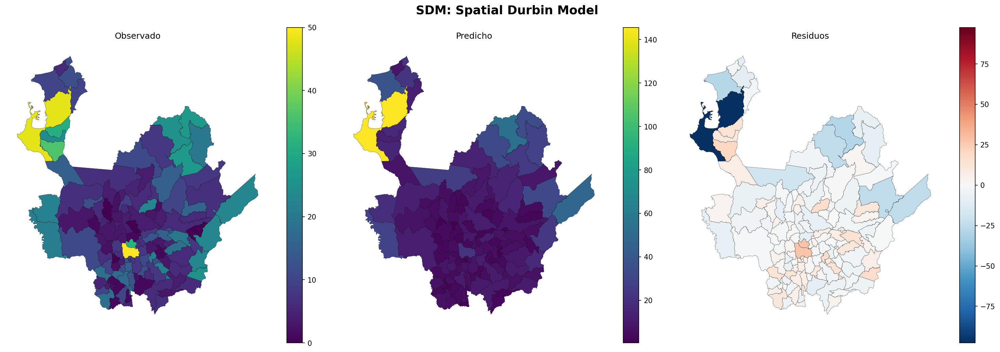

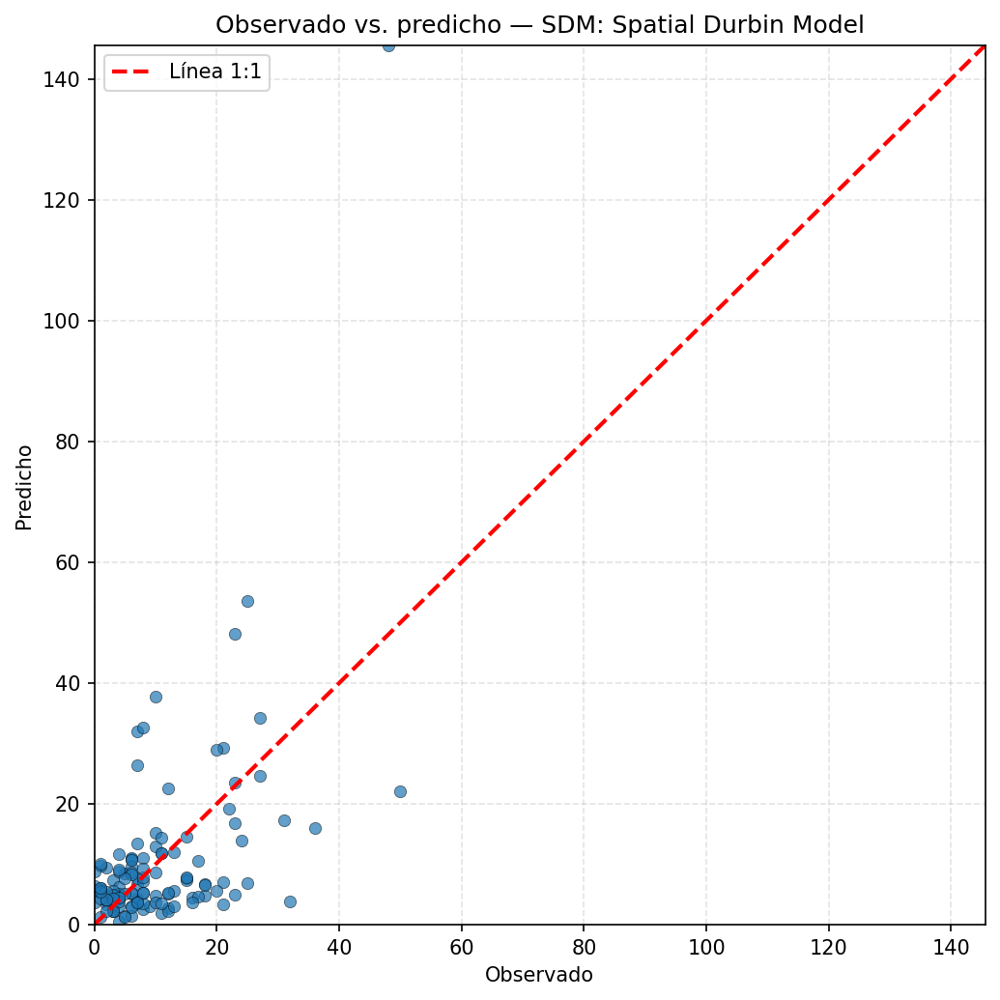

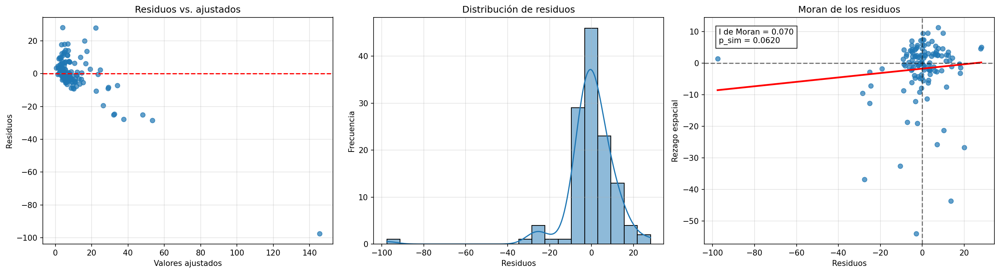

In [23]:
import numpy as np
import pandas as pd
import spreg

from libpysal import weights
from sklearn.preprocessing import StandardScaler

# ==========================
# Variables explicativas
# ==========================
vars_continuas = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    "Gradiente",
    #"Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    #"Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
] 

vars_dummy = []

variables = vars_continuas + vars_dummy

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area", "geometry"] + variables]
    .replace(-9999, np.nan)
    .dropna()
    .query("Area > 0")
    .copy()
)

# ==========================
# Respuesta ajustada por área
# ==========================
df["log_Area"] = np.log(df["Area"])

df["y_offset"] = (
    np.log(df["Tot_event"] + 1)
    - df["log_Area"]
)

# ==========================
# Proyección para vecinos
# ==========================
df_w = (
    df.to_crs(df.estimate_utm_crs())
    if df.crs.is_geographic
    else df.copy()
)

# ==========================
# Matriz KNN de 5 vecinos
# ==========================
w = weights.Queen.from_dataframe(df_w)

w.transform = "R"

# ==========================
# Estandarizar variables
# ==========================
X_cont = pd.DataFrame(
    StandardScaler().fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = pd.concat(
    [X_cont, df[vars_dummy].astype(float)],
    axis=1
)

y = df[["y_offset"]].to_numpy()

# ==========================
# MODELO SDM
# Spatial Durbin Model
# ==========================
modelo_sdm = spreg.ML_Lag(
    y=y,
    x=X.to_numpy(),
    w=w,
    slx_lags=1,
    method="full",
    name_y="log(Tot_event + 1) - log(Area)",
    name_x=list(X.columns),
    name_w="Queen"
)

print(modelo_sdm.summary)

# ==========================
# Predicciones en escala del modelo
# ==========================
y_pred_offset = modelo_sdm.predy.flatten()

# ==========================
# Regresar a escala de eventos
# ==========================
y_pred = (
    np.exp(
        y_pred_offset
        + df["log_Area"].to_numpy()
    )
    - 1
)

y_pred = np.maximum(y_pred, 0)

y_obs = df["Tot_event"].to_numpy(dtype=float)

# ==========================
# Guardar resultados
# ==========================
gdf["y_pred_sdm"] = np.nan
gdf["Diferencias_sdm"] = np.nan
gdf["Residuo_offset_sdm"] = np.nan

gdf.loc[df.index, "y_pred_sdm"] = y_pred
gdf.loc[df.index, "Diferencias_sdm"] = y_obs - y_pred
gdf.loc[df.index, "Residuo_offset_sdm"] = modelo_sdm.u.flatten()

# ==========================
# Métricas
# ==========================
metricas_sdm = metricas_statsmodels(
    modelo=modelo_sdm,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1] * 2
)

# ==========================
# Gráficas
# ==========================
gdf_resultado_sdm, moran_residuos_sdm = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="SDM: Spatial Durbin Model"
)

In [ ]:
import numpy as np
import pandas as pd
import spreg

from libpysal import weights
from sklearn.preprocessing import StandardScaler

# ==========================
# Variables explicativas
# ==========================
vars_continuas = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    #"Gradiente",
    #"Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    "Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv",
]

vars_dummy = []

variables = vars_continuas + vars_dummy

# ==========================
# Base limpia
# ==========================
df = (
    gdf[["Tot_event", "Area", "geometry"] + variables]
    .replace(-9999, np.nan)
    .dropna()
    .query("Area > 0")
    .copy()
)

# ==========================
# Respuesta ajustada por área
# ==========================
df["log_Area"] = np.log(df["Area"])

df["y_offset"] = (
    np.log(df["Tot_event"] + 1)
    - df["log_Area"]
)

y = df[["y_offset"]].to_numpy()

# ==========================
# Matriz espacial
# ==========================
df_w = (
    df.to_crs(df.estimate_utm_crs())
    if df.crs.is_geographic
    else df.copy()
)

w = weights.Queen.from_dataframe(df_w)
w.transform = "R"

# Para usar Queen:
# w = weights.Queen.from_dataframe(df_w)
# w.transform = "R"

# ==========================
# Estandarizar covariables
# ==========================
X_cont = pd.DataFrame(
    StandardScaler().fit_transform(df[vars_continuas]),
    columns=vars_continuas,
    index=df.index
)

X = pd.concat(
    [X_cont, df[vars_dummy].astype(float)],
    axis=1
)

# ==========================
# MODELO SAC / SARAR
# Kelejian-Prucha
# ==========================
modelo_sac = spreg.GM_Combo(
    y=y,
    x=X.to_numpy(),
    w=w,
    w_lags=1,
    lag_q=True,
    name_y="log(Tot_event + 1) - log(Area)",
    name_x=list(X.columns),
    name_w="Queen"
)

print(modelo_sac.summary)

# Predicción en la escala transformada
y_pred_offset = modelo_sac.predy.flatten()

# Volver a conteos
y_pred = (
    np.exp(
        y_pred_offset
        + df["log_Area"].to_numpy()
    )
    - 1
)

y_pred = np.maximum(y_pred, 0)

y_obs = df["Tot_event"].to_numpy(dtype=float)

# Guardar resultados
gdf["y_pred_sac"] = np.nan
gdf["Diferencias_sac"] = np.nan
gdf["Residuo_offset_sac"] = np.nan
gdf["Error_filtrado_sac"] = np.nan

gdf.loc[df.index, "y_pred_sac"] = y_pred
gdf.loc[df.index, "Diferencias_sac"] = y_obs - y_pred
gdf.loc[df.index, "Residuo_offset_sac"] = modelo_sac.u.flatten()
gdf.loc[df.index, "Error_filtrado_sac"] = modelo_sac.e_filtered.flatten()

# Predicción en la escala transformada
y_pred_offset = modelo_sac.predy.flatten()

# Volver a conteos
y_pred = (
    np.exp(
        y_pred_offset
        + df["log_Area"].to_numpy()
    )
    - 1
)

y_pred = np.maximum(y_pred, 0)

y_obs = df["Tot_event"].to_numpy(dtype=float)

# Guardar resultados
gdf["y_pred_sac"] = np.nan
gdf["Diferencias_sac"] = np.nan
gdf["Residuo_offset_sac"] = np.nan
gdf["Error_filtrado_sac"] = np.nan

gdf.loc[df.index, "y_pred_sac"] = y_pred
gdf.loc[df.index, "Diferencias_sac"] = y_obs - y_pred
gdf.loc[df.index, "Residuo_offset_sac"] = modelo_sac.u.flatten()
gdf.loc[df.index, "Error_filtrado_sac"] = modelo_sac.e_filtered.flatten()
metricas_sac = metricas_statsmodels(
    modelo=modelo_sac,
    y_obs=y_obs,
    y_pred=y_pred,
    n_variables=X.shape[1]
)

gdf_resultado_sac, moran_residuos_sac = graficas_statsmodels(
    gdf=gdf,
    indices=df.index,
    y_obs=y_obs,
    y_pred=y_pred,
    nombre_modelo="SAC / SARAR Kelejian-Prucha"
)

GM_Combo
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIALLY WEIGHTED 2SLS - GM-COMBO MODEL
------------------------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :       Queen
Dependent Variable  :log(Tot_event + 1) - log(Area)                Number of Observations:         125
Mean dependent var  :     -3.5989                Number of Variables   :           5
S.D. dependent var  :      1.1412                Degrees of Freedom    :         120
Pseudo R-squared    :      0.3801
Spatial Pseudo R-squared:  0.2638

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -1.56708         0.74757        -2.09622         0.03606
           Pend_mean        10.36302         3.29044     

In [ ]:
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import spreg
from sklearn.preprocessing import StandardScaler

# ==========================
# Variables explicativas
# ==========================
variables = [
    "Pend_mean",
    #"Elev_mean",
    #"LAI_mean",
    #"Curv_mean",
    #"TPI_mean",
    "TRI_mean",
    "Gradiente",
    "Pend_std",
    #"Elev_std",
    #"LAI_std",
    #"Curv_std",
    #"TPI_std",
    #"TRI_std",
    #"Pend_cv",
    #"Elev_cv",
    #"LAI_cv",
    #"Curv_cv",
    #"TPI_cv",
    #"TRI_cv"
]

df = (
    gdf[["Tot_event", "Subregion"] + variables]
    .replace(-9999, np.nan)
    .dropna()
    .copy()
)

tabla_regimenes = (
    df["Subregion"]
    .value_counts()
    .rename_axis("Subregion")
    .reset_index(name="n")
)

display(tabla_regimenes)

scaler = StandardScaler()

df[variables] = scaler.fit_transform(df[variables])

y = df[["Tot_event"]].to_numpy(dtype=float)
X = df[variables].to_numpy(dtype=float)
regimenes = df["Subregion"].astype(str).tolist()

modelo_regimenes = spreg.OLS_Regimes(
    y=y,
    x=X,
    regimes=regimenes,

    constant_regi="many",
    cols2regi=[False] * len(variables),

    regime_err_sep=False,

    name_y="Tot_event",
    name_x=variables,
    name_regimes="Subregion",
    name_ds="Municipios"
)

print(modelo_regimenes.summary)

,Subregion,n
0,ORIENTE,23
1,SUROESTE,23
2,OCCIDENTE,19
3,NORTE,17
4,URABA,11
5,VALLE DE ABURRA,10
6,NORDESTE,10
7,MAGDALENA MEDIO,6
8,BAJO CAUCA,6


REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES - REGIMES
------------------------------------------------------------------------------------
Data set            :  Municipios
Weights matrix      :        None
Dependent Variable  :   Tot_event                Number of Observations:         125
Mean dependent var  :     10.1200                Number of Variables   :          15
S.D. dependent var  :      9.2437                Degrees of Freedom    :         110
R-squared           :      0.4744
Adjusted R-squared  :      0.4075
Sum squared residual:     5568.54                F-statistic           :      7.0926
Sigma-square        :      50.623                Prob(F-statistic)     :   3.089e-10
S.E. of regression  :       7.115                Log likelihood        :    -414.653
Sigma-square ML     :      44.548                Akaike info criterion :     859.306
S.E of regression ML:      6.6745                Schwarz criterion     :     901.731

-------


MÉTRICAS DEL MODELO ICAR
N observaciones              : 125
RMSE                         : 4.8998
MAE                          : 3.2642
R² observado-predicho        : 0.7168
R² ajustado                  : 0.7097
Correlación obs.-pred.       : 0.8801
R² de la correlación         : 0.7747


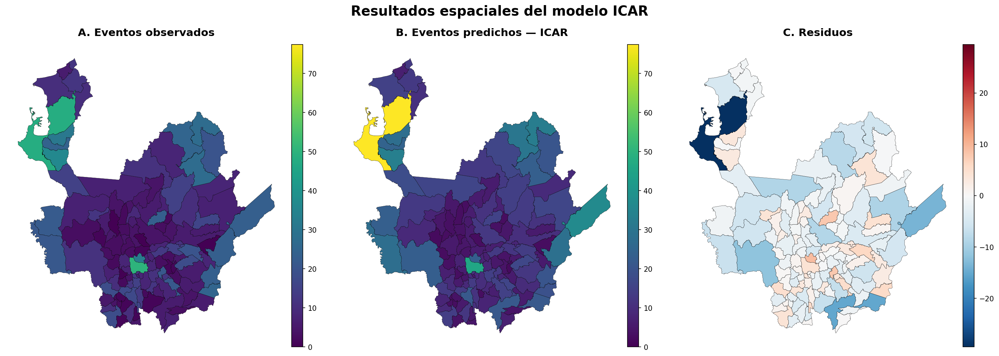

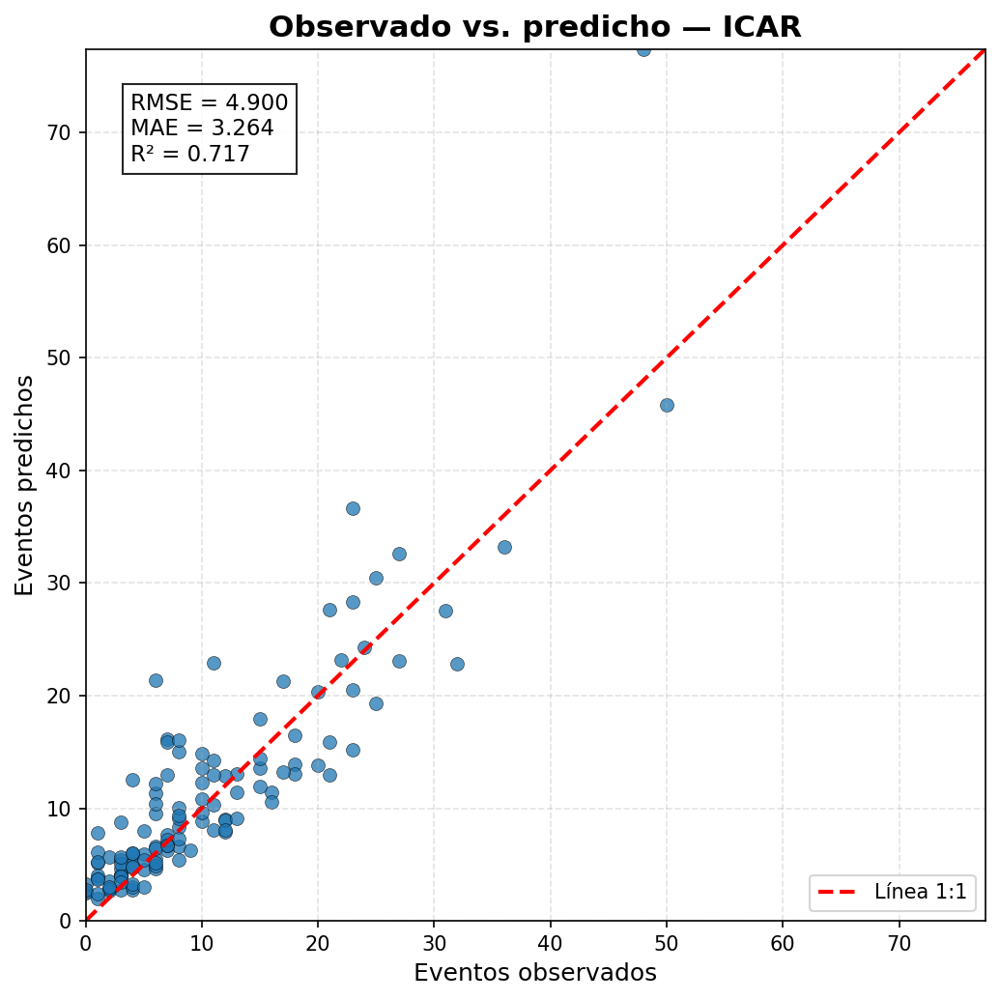

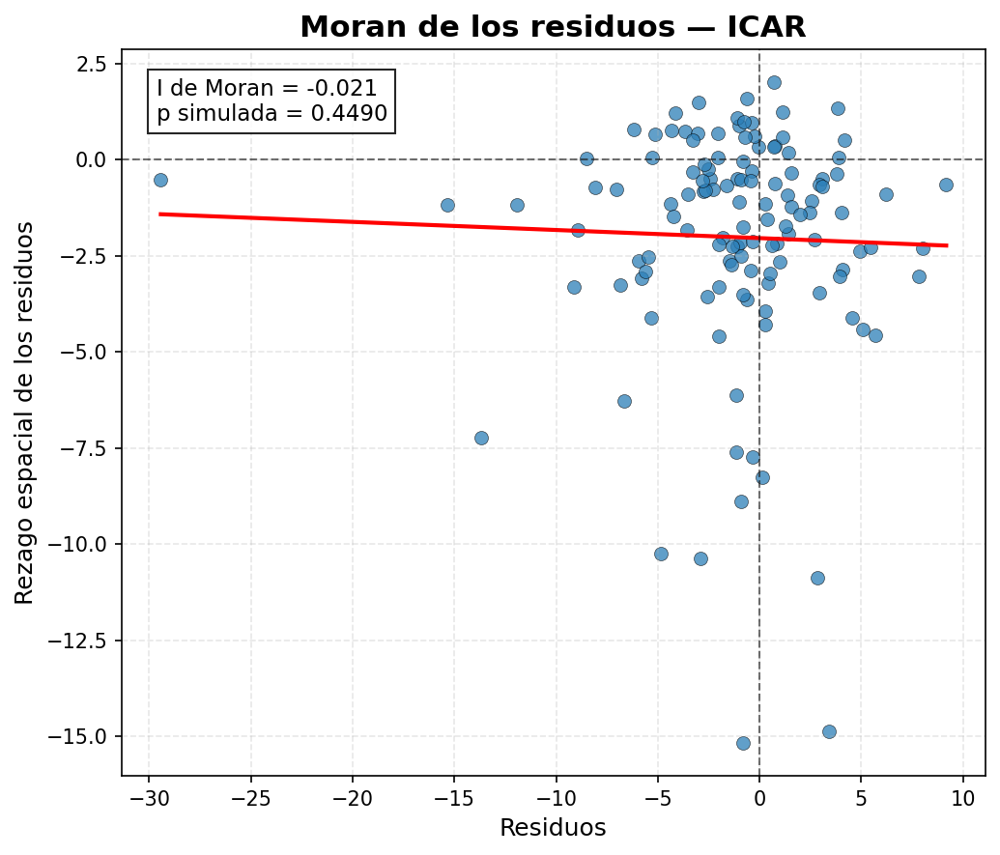


MORAN DE LOS RESIDUOS ICAR
I de Moran : -0.0211
p_sim      : 0.4490


In [7]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

from libpysal import weights
from esda import Moran
from mpl_toolkits.axes_grid1 import make_axes_locatable


# =====================================================
# 1. LEER RESULTADOS DEL MODELO ICAR
# =====================================================

ruta = (
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial"
    r"\Data\Poligonos\Poligonos\Resultados_ICAR"
    r"\Resultados_ICAR.gpkg"
)

gdf = gpd.read_file(ruta)


# =====================================================
# 2. VERIFICAR COLUMNAS
# =====================================================

columnas_requeridas = [
    "Tot_event",
    "conteo_ajustado",
    "geometry"
]

faltantes = [
    columna
    for columna in columnas_requeridas
    if columna not in gdf.columns
]

if faltantes:
    raise ValueError(
        f"Faltan las siguientes columnas: {faltantes}"
    )


# =====================================================
# 3. LIMPIEZA Y VARIABLES DEL MODELO
# =====================================================

gdf = (
    gdf
    .replace(-9999, np.nan)
    .dropna(
        subset=[
            "Tot_event",
            "conteo_ajustado",
            "geometry"
        ]
    )
    .copy()
)

gdf["Observado"] = gdf["Tot_event"].astype(float)
gdf["Predicho"] = gdf["conteo_ajustado"].astype(float)

gdf["Residuo"] = (
    gdf["Observado"]
    - gdf["Predicho"]
)

gdf["Residuo_abs"] = np.abs(
    gdf["Residuo"]
)


# =====================================================
# 4. FUNCIÓN DE MÉTRICAS
# =====================================================

def metricas_icar(
    y_obs,
    y_pred,
    n_variables=None
):
    """
    Calcula métricas descriptivas observado-predicho
    para resultados importados de un modelo ICAR.
    """

    y_obs = np.asarray(
        y_obs,
        dtype=float
    ).flatten()

    y_pred = np.asarray(
        y_pred,
        dtype=float
    ).flatten()

    mascara = (
        np.isfinite(y_obs)
        & np.isfinite(y_pred)
    )

    y_obs = y_obs[mascara]
    y_pred = y_pred[mascara]

    n = len(y_obs)

    errores = y_obs - y_pred

    rmse = np.sqrt(
        np.mean(errores**2)
    )

    mae = np.mean(
        np.abs(errores)
    )

    sse = np.sum(
        errores**2
    )

    sst = np.sum(
        (
            y_obs
            - np.mean(y_obs)
        )**2
    )

    r2 = (
        1 - sse / sst
        if sst > 0
        else np.nan
    )

    if (
        n_variables is not None
        and n > n_variables + 1
    ):
        r2_ajustado = (
            1
            - (1 - r2)
            * (n - 1)
            / (n - n_variables - 1)
        )
    else:
        r2_ajustado = np.nan

    correlacion = np.corrcoef(
        y_obs,
        y_pred
    )[0, 1]

    r2_correlacion = correlacion**2

    print("\n" + "=" * 58)
    print("MÉTRICAS DEL MODELO ICAR")
    print("=" * 58)

    print(f"N observaciones              : {n}")
    print(f"RMSE                         : {rmse:.4f}")
    print(f"MAE                          : {mae:.4f}")
    print(f"R² observado-predicho        : {r2:.4f}")

    if np.isfinite(r2_ajustado):
        print(f"R² ajustado                  : {r2_ajustado:.4f}")

    print(f"Correlación obs.-pred.       : {correlacion:.4f}")
    print(f"R² de la correlación         : {r2_correlacion:.4f}")

    print("=" * 58)

    return {
        "N": n,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "R2_ajustado": r2_ajustado,
        "Correlacion": correlacion,
        "R2_correlacion": r2_correlacion
    }


# =====================================================
# 5. CALCULAR MÉTRICAS
# =====================================================

# Cambia este valor por el número real de covariables
# utilizadas para ajustar el ICAR en MATLAB.
n_variables_icar = 3

metricas_icar_resultado = metricas_icar(
    y_obs=gdf["Observado"],
    y_pred=gdf["Predicho"],
    n_variables=n_variables_icar
)


# =====================================================
# 6. PREPARAR MAPAS
# =====================================================

# Se usa EPSG:3857 únicamente para representación.
if gdf.crs is not None and gdf.crs.is_geographic:
    gdf_plot = gdf.to_crs(epsg=3857)
else:
    gdf_plot = gdf.copy()

vmin_eventos = min(
    gdf_plot["Observado"].min(),
    gdf_plot["Predicho"].min()
)

vmax_eventos = max(
    gdf_plot["Observado"].max(),
    gdf_plot["Predicho"].max()
)

vmax_residuo = np.nanmax(
    np.abs(
        gdf_plot["Residuo"]
    )
)


# =====================================================
# 7. MAPAS: OBSERVADO, PREDICHO Y RESIDUOS
# =====================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(20, 7),
    dpi=150
)

titulos = [
    "A. Eventos observados",
    "B. Eventos predichos — ICAR",
    "C. Residuos"
]

columnas = [
    "Observado",
    "Predicho",
    "Residuo"
]

for i, columna in enumerate(columnas):

    divider = make_axes_locatable(
        axes[i]
    )

    cax = divider.append_axes(
        "right",
        size="4%",
        pad=0.08
    )

    if columna != "Residuo":

        gdf_plot.plot(
            column=columna,
            cmap="viridis",
            vmin=vmin_eventos,
            vmax=vmax_eventos,
            legend=True,
            cax=cax,
            edgecolor="black",
            linewidth=0.25,
            ax=axes[i]
        )

    else:

        gdf_plot.plot(
            column=columna,
            cmap="RdBu_r",
            vmin=-vmax_residuo,
            vmax=vmax_residuo,
            legend=True,
            cax=cax,
            edgecolor="black",
            linewidth=0.25,
            ax=axes[i]
        )

    axes[i].set_title(
        titulos[i],
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    axes[i].set_axis_off()

fig.suptitle(
    "Resultados espaciales del modelo ICAR",
    fontsize=19,
    fontweight="bold",
    y=0.98
)

plt.tight_layout(
    rect=[0, 0, 1, 0.95]
)

plt.show()


# =====================================================
# 8. OBSERVADO VS. PREDICHO
# =====================================================

y_obs = gdf["Observado"].to_numpy()
y_pred = gdf["Predicho"].to_numpy()

limite_min = min(
    y_obs.min(),
    y_pred.min()
)

limite_max = max(
    y_obs.max(),
    y_pred.max()
)

fig, ax = plt.subplots(
    figsize=(7, 7),
    dpi=150
)

ax.scatter(
    y_obs,
    y_pred,
    s=45,
    alpha=0.75,
    edgecolor="black",
    linewidth=0.3
)

ax.plot(
    [limite_min, limite_max],
    [limite_min, limite_max],
    color="red",
    linestyle="--",
    linewidth=2,
    label="Línea 1:1"
)

ax.set_xlim(
    limite_min,
    limite_max
)

ax.set_ylim(
    limite_min,
    limite_max
)

ax.set_xlabel(
    "Eventos observados",
    fontsize=12
)

ax.set_ylabel(
    "Eventos predichos",
    fontsize=12
)

ax.set_title(
    "Observado vs. predicho — ICAR",
    fontsize=15,
    fontweight="bold"
)

ax.text(
    0.05,
    0.95,
    f"RMSE = {metricas_icar_resultado['RMSE']:.3f}\n"
    f"MAE = {metricas_icar_resultado['MAE']:.3f}\n"
    f"R² = {metricas_icar_resultado['R2']:.3f}",
    transform=ax.transAxes,
    va="top",
    fontsize=11,
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        alpha=0.85
    )
)

ax.legend()

ax.grid(
    linestyle="--",
    alpha=0.35
)

plt.tight_layout()
plt.show()


# =====================================================
# 9. MORAN DE LOS RESIDUOS
# =====================================================

# Para Queen no es necesario reproyectar.
w = weights.Queen.from_dataframe(
    gdf,
    use_index=True
)

w.transform = "R"

residuos = gdf["Residuo"].to_numpy(
    dtype=float
)

lag_residuos = weights.lag_spatial(
    w,
    residuos
)

mi = Moran(
    residuos,
    w,
    permutations=999
)


# =====================================================
# 10. MORAN SCATTERPLOT
# =====================================================

fig, ax = plt.subplots(
    figsize=(7, 6),
    dpi=150
)

ax.scatter(
    residuos,
    lag_residuos,
    s=45,
    color="#2C7FB8",
    edgecolor="black",
    linewidth=0.3,
    alpha=0.75
)

# Ajuste lineal
coeficientes = np.polyfit(
    residuos,
    lag_residuos,
    1
)

x_linea = np.linspace(
    residuos.min(),
    residuos.max(),
    200
)

y_linea = (
    coeficientes[0] * x_linea
    + coeficientes[1]
)

ax.plot(
    x_linea,
    y_linea,
    color="red",
    linewidth=2
)

ax.axvline(
    0,
    color="black",
    linestyle="--",
    linewidth=1,
    alpha=0.55
)

ax.axhline(
    0,
    color="black",
    linestyle="--",
    linewidth=1,
    alpha=0.55
)

ax.set_xlabel(
    "Residuos",
    fontsize=12
)

ax.set_ylabel(
    "Rezago espacial de los residuos",
    fontsize=12
)

ax.set_title(
    "Moran de los residuos — ICAR",
    fontsize=15,
    fontweight="bold"
)

ax.text(
    0.04,
    0.96,
    f"I de Moran = {mi.I:.3f}\n"
    f"p simulada = {mi.p_sim:.4f}",
    transform=ax.transAxes,
    va="top",
    fontsize=11,
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        alpha=0.85
    )
)

ax.grid(
    linestyle="--",
    alpha=0.30
)

plt.tight_layout()
plt.show()


# =====================================================
# 11. RESULTADO DE MORAN
# =====================================================

print("\n" + "=" * 50)
print("MORAN DE LOS RESIDUOS ICAR")
print("=" * 50)
print(f"I de Moran : {mi.I:.4f}")
print(f"p_sim      : {mi.p_sim:.4f}")
print("=" * 50)


MÉTRICAS DEL MODELO LEROUX
N observaciones              : 125
RMSE                         : 1.7799
MAE                          : 1.3531
R² observado-predicho        : 0.9626
R² ajustado                  : 0.9617
Correlación obs.-pred.       : 0.9829
R² de la correlación         : 0.9661


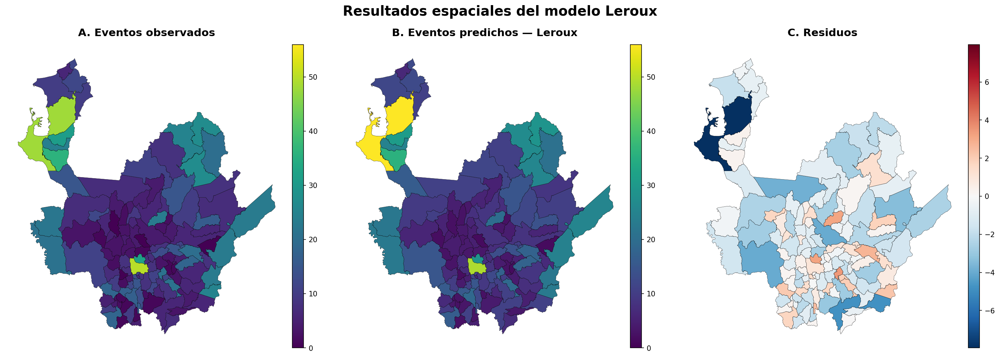

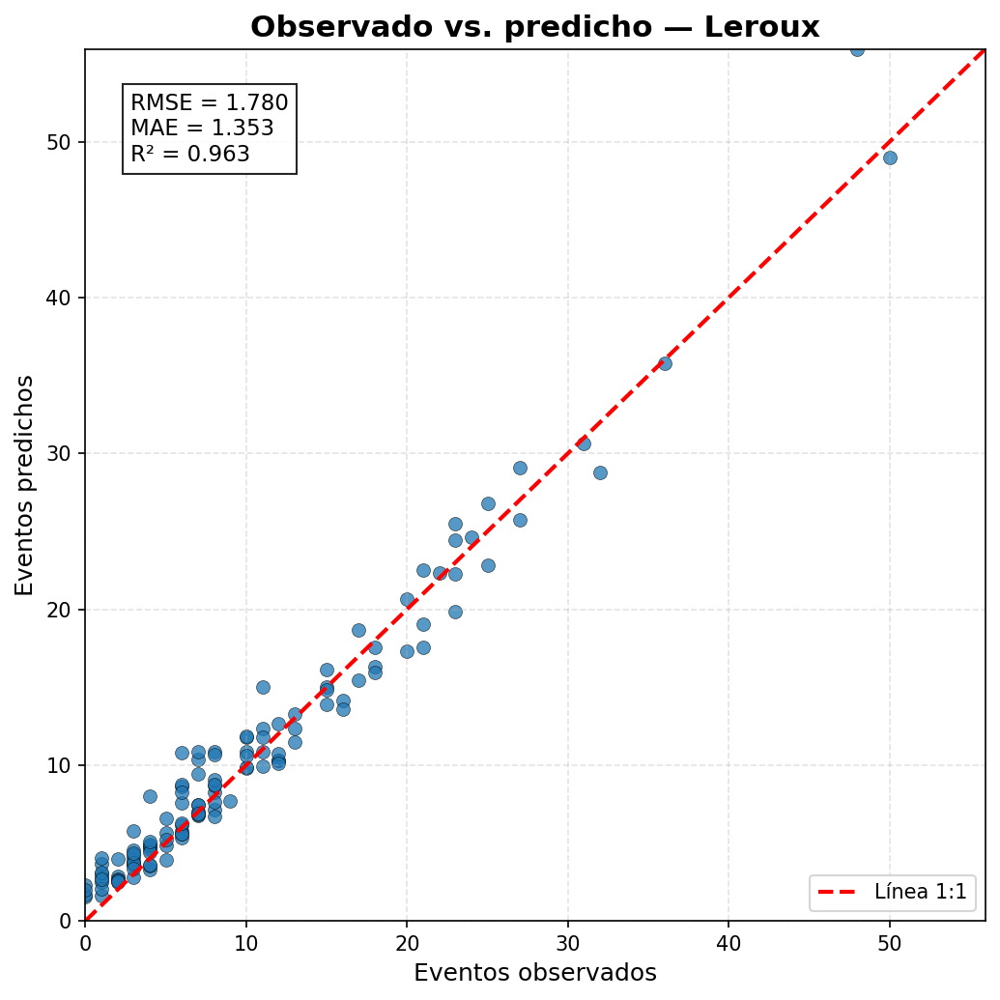

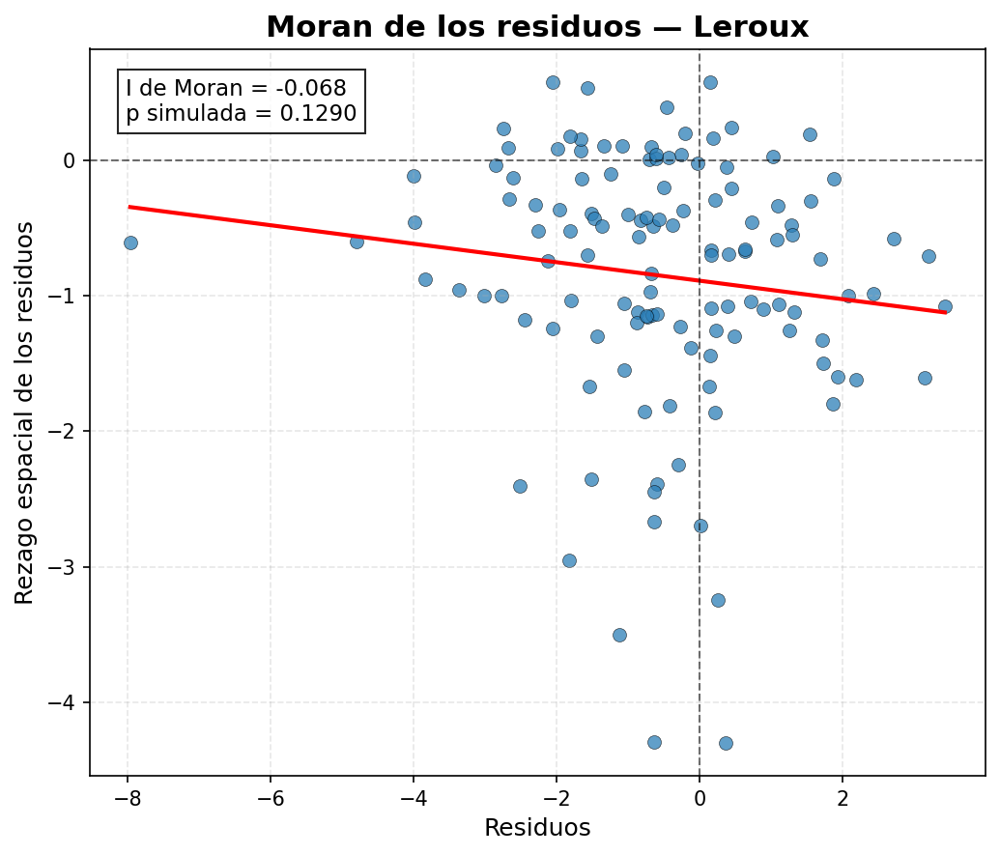


MORAN DE LOS RESIDUOS LEROUX
I de Moran : -0.0683
p_sim      : 0.1290


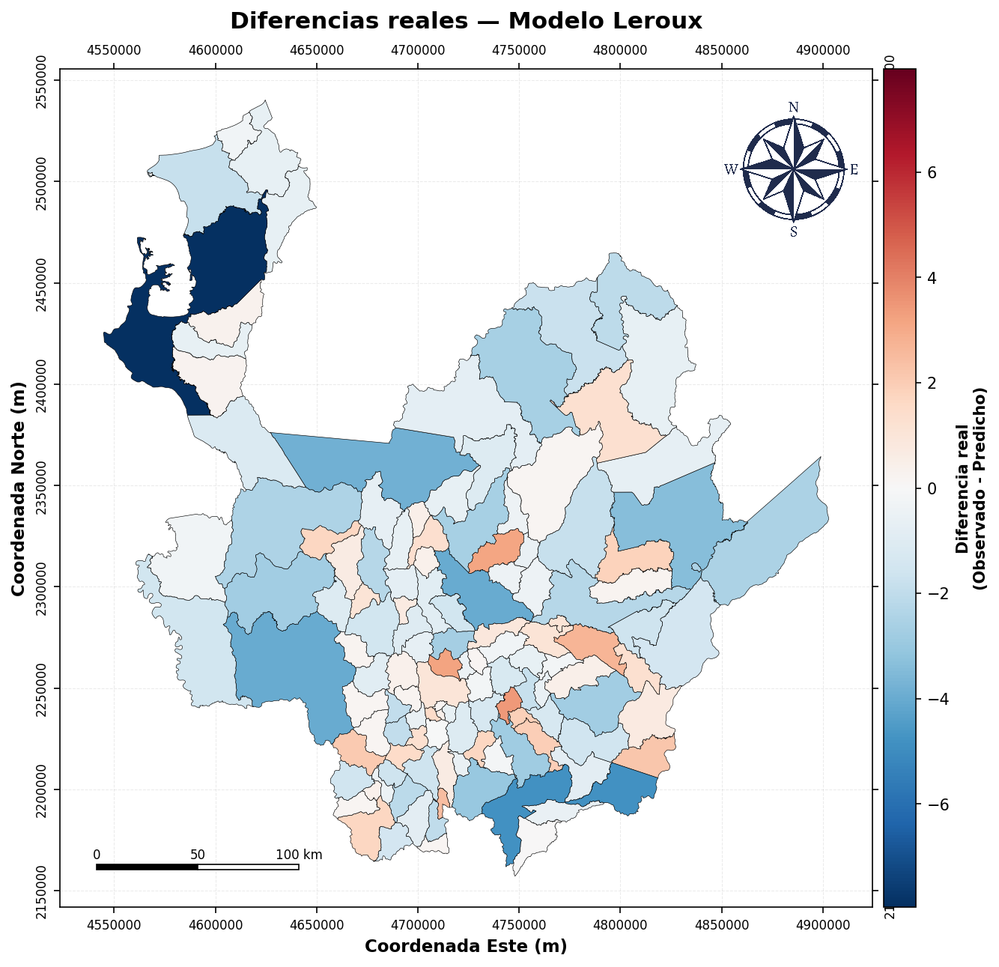

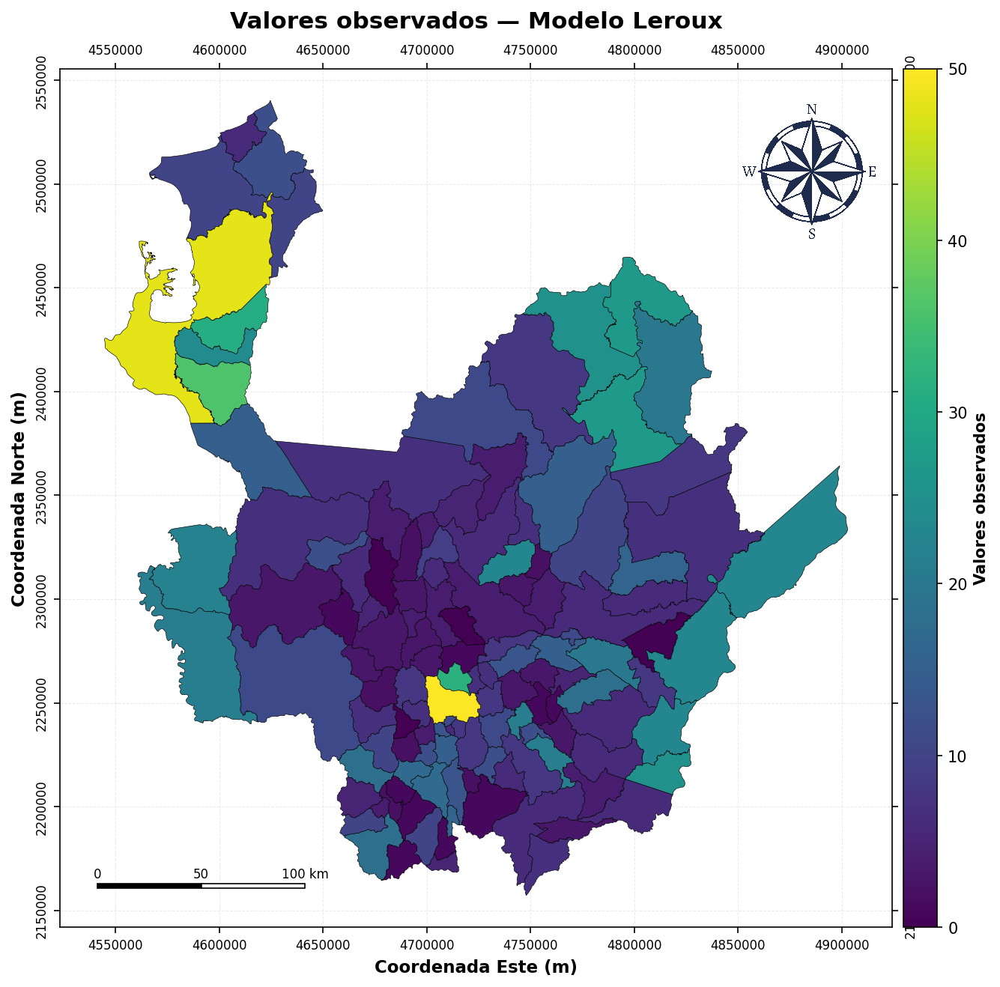

In [11]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

from libpysal import weights
from esda import Moran
from mpl_toolkits.axes_grid1 import make_axes_locatable


# =====================================================
# 1. LEER RESULTADOS DEL MODELO LEROUX
# =====================================================

ruta = (
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial"
    r"\Data\Poligonos\Poligonos\Resultados_Leroux"
    r"\Resultados_Leroux.gpkg"
)

gdf = gpd.read_file(ruta)


# =====================================================
# 2. VERIFICAR COLUMNAS
# =====================================================

columnas_requeridas = [
    "Tot_event",
    "conteo_ajustado",
    "geometry"
]

faltantes = [
    columna
    for columna in columnas_requeridas
    if columna not in gdf.columns
]

if faltantes:
    raise ValueError(
        f"Faltan las siguientes columnas: {faltantes}"
    )


# =====================================================
# 3. LIMPIEZA Y VARIABLES DEL MODELO
# =====================================================

gdf = (
    gdf
    .replace(-9999, np.nan)
    .dropna(
        subset=[
            "Tot_event",
            "conteo_ajustado",
            "geometry"
        ]
    )
    .copy()
)

gdf["Observado"] = gdf["Tot_event"].astype(float)
gdf["Predicho"] = gdf["conteo_ajustado"].astype(float)

gdf["Residuo"] = (
    gdf["Observado"]
    - gdf["Predicho"]
)

gdf["Residuo_abs"] = np.abs(
    gdf["Residuo"]
)


# =====================================================
# 4. FUNCIÓN DE MÉTRICAS
# =====================================================

def metricas_icar(
    y_obs,
    y_pred,
    n_variables=None
):
    """
    Calcula métricas descriptivas observado-predicho
    para resultados importados de un modelo Leroux.
    """

    y_obs = np.asarray(
        y_obs,
        dtype=float
    ).flatten()

    y_pred = np.asarray(
        y_pred,
        dtype=float
    ).flatten()

    mascara = (
        np.isfinite(y_obs)
        & np.isfinite(y_pred)
    )

    y_obs = y_obs[mascara]
    y_pred = y_pred[mascara]

    n = len(y_obs)

    errores = y_obs - y_pred

    rmse = np.sqrt(
        np.mean(errores**2)
    )

    mae = np.mean(
        np.abs(errores)
    )

    sse = np.sum(
        errores**2
    )

    sst = np.sum(
        (
            y_obs
            - np.mean(y_obs)
        )**2
    )

    r2 = (
        1 - sse / sst
        if sst > 0
        else np.nan
    )

    if (
        n_variables is not None
        and n > n_variables + 1
    ):
        r2_ajustado = (
            1
            - (1 - r2)
            * (n - 1)
            / (n - n_variables - 1)
        )
    else:
        r2_ajustado = np.nan

    correlacion = np.corrcoef(
        y_obs,
        y_pred
    )[0, 1]

    r2_correlacion = correlacion**2

    print("\n" + "=" * 58)
    print("MÉTRICAS DEL MODELO LEROUX")
    print("=" * 58)

    print(f"N observaciones              : {n}")
    print(f"RMSE                         : {rmse:.4f}")
    print(f"MAE                          : {mae:.4f}")
    print(f"R² observado-predicho        : {r2:.4f}")

    if np.isfinite(r2_ajustado):
        print(f"R² ajustado                  : {r2_ajustado:.4f}")

    print(f"Correlación obs.-pred.       : {correlacion:.4f}")
    print(f"R² de la correlación         : {r2_correlacion:.4f}")

    print("=" * 58)

    return {
        "N": n,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "R2_ajustado": r2_ajustado,
        "Correlacion": correlacion,
        "R2_correlacion": r2_correlacion
    }


# =====================================================
# 5. CALCULAR MÉTRICAS
# =====================================================

# Cambia este valor por el número real de covariables
# utilizadas para ajustar el ICAR en MATLAB.
n_variables_icar = 3

metricas_icar_resultado = metricas_icar(
    y_obs=gdf["Observado"],
    y_pred=gdf["Predicho"],
    n_variables=n_variables_icar
)


# =====================================================
# 6. PREPARAR MAPAS
# =====================================================

# Se usa EPSG:3857 únicamente para representación.
if gdf.crs is not None and gdf.crs.is_geographic:
    gdf_plot = gdf.to_crs(epsg=3857)
else:
    gdf_plot = gdf.copy()

vmin_eventos = min(
    gdf_plot["Observado"].min(),
    gdf_plot["Predicho"].min()
)

vmax_eventos = max(
    gdf_plot["Observado"].max(),
    gdf_plot["Predicho"].max()
)

vmax_residuo = np.nanmax(
    np.abs(
        gdf_plot["Residuo"]
    )
)


# =====================================================
# 7. MAPAS: OBSERVADO, PREDICHO Y RESIDUOS
# =====================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(20, 7),
    dpi=150
)

titulos = [
    "A. Eventos observados",
    "B. Eventos predichos — Leroux",
    "C. Residuos"
]

columnas = [
    "Observado",
    "Predicho",
    "Residuo"
]

for i, columna in enumerate(columnas):

    divider = make_axes_locatable(
        axes[i]
    )

    cax = divider.append_axes(
        "right",
        size="4%",
        pad=0.08
    )

    if columna != "Residuo":

        gdf_plot.plot(
            column=columna,
            cmap="viridis",
            vmin=vmin_eventos,
            vmax=vmax_eventos,
            legend=True,
            cax=cax,
            edgecolor="black",
            linewidth=0.25,
            ax=axes[i]
        )

    else:

        gdf_plot.plot(
            column=columna,
            cmap="RdBu_r",
            vmin=-vmax_residuo,
            vmax=vmax_residuo,
            legend=True,
            cax=cax,
            edgecolor="black",
            linewidth=0.25,
            ax=axes[i]
        )

    axes[i].set_title(
        titulos[i],
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    axes[i].set_axis_off()

fig.suptitle(
    "Resultados espaciales del modelo Leroux",
    fontsize=19,
    fontweight="bold",
    y=0.98
)

plt.tight_layout(
    rect=[0, 0, 1, 0.95]
)

plt.show()


# =====================================================
# 8. OBSERVADO VS. PREDICHO
# =====================================================

y_obs = gdf["Observado"].to_numpy()
y_pred = gdf["Predicho"].to_numpy()

limite_min = min(
    y_obs.min(),
    y_pred.min()
)

limite_max = max(
    y_obs.max(),
    y_pred.max()
)

fig, ax = plt.subplots(
    figsize=(7, 7),
    dpi=150
)

ax.scatter(
    y_obs,
    y_pred,
    s=45,
    alpha=0.75,
    edgecolor="black",
    linewidth=0.3
)

ax.plot(
    [limite_min, limite_max],
    [limite_min, limite_max],
    color="red",
    linestyle="--",
    linewidth=2,
    label="Línea 1:1"
)

ax.set_xlim(
    limite_min,
    limite_max
)

ax.set_ylim(
    limite_min,
    limite_max
)

ax.set_xlabel(
    "Eventos observados",
    fontsize=12
)

ax.set_ylabel(
    "Eventos predichos",
    fontsize=12
)

ax.set_title(
    "Observado vs. predicho — Leroux",
    fontsize=15,
    fontweight="bold"
)

ax.text(
    0.05,
    0.95,
    f"RMSE = {metricas_icar_resultado['RMSE']:.3f}\n"
    f"MAE = {metricas_icar_resultado['MAE']:.3f}\n"
    f"R² = {metricas_icar_resultado['R2']:.3f}",
    transform=ax.transAxes,
    va="top",
    fontsize=11,
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        alpha=0.85
    )
)

ax.legend()

ax.grid(
    linestyle="--",
    alpha=0.35
)

plt.tight_layout()
plt.show()


# =====================================================
# 9. MORAN DE LOS RESIDUOS
# =====================================================

# Para Queen no es necesario reproyectar.
w = weights.Queen.from_dataframe(
    gdf,
    use_index=True
)

w.transform = "R"

residuos = gdf["Residuo"].to_numpy(
    dtype=float
)

lag_residuos = weights.lag_spatial(
    w,
    residuos
)

mi = Moran(
    residuos,
    w,
    permutations=999
)


# =====================================================
# 10. MORAN SCATTERPLOT
# =====================================================

fig, ax = plt.subplots(
    figsize=(7, 6),
    dpi=150
)

ax.scatter(
    residuos,
    lag_residuos,
    s=45,
    color="#2C7FB8",
    edgecolor="black",
    linewidth=0.3,
    alpha=0.75
)

# Ajuste lineal
coeficientes = np.polyfit(
    residuos,
    lag_residuos,
    1
)

x_linea = np.linspace(
    residuos.min(),
    residuos.max(),
    200
)

y_linea = (
    coeficientes[0] * x_linea
    + coeficientes[1]
)

ax.plot(
    x_linea,
    y_linea,
    color="red",
    linewidth=2
)

ax.axvline(
    0,
    color="black",
    linestyle="--",
    linewidth=1,
    alpha=0.55
)

ax.axhline(
    0,
    color="black",
    linestyle="--",
    linewidth=1,
    alpha=0.55
)

ax.set_xlabel(
    "Residuos",
    fontsize=12
)

ax.set_ylabel(
    "Rezago espacial de los residuos",
    fontsize=12
)

ax.set_title(
    "Moran de los residuos — Leroux",
    fontsize=15,
    fontweight="bold"
)

ax.text(
    0.04,
    0.96,
    f"I de Moran = {mi.I:.3f}\n"
    f"p simulada = {mi.p_sim:.4f}",
    transform=ax.transAxes,
    va="top",
    fontsize=11,
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        alpha=0.85
    )
)

ax.grid(
    linestyle="--",
    alpha=0.30
)

plt.tight_layout()
plt.show()


# =====================================================
# 11. RESULTADO DE MORAN
# =====================================================

print("\n" + "=" * 50)
print("MORAN DE LOS RESIDUOS LEROUX")
print("=" * 50)
print(f"I de Moran : {mi.I:.4f}")
print(f"p_sim      : {mi.p_sim:.4f}")
print("=" * 50)

# =====================================================
# 12. MAPA DE DIFERENCIAS REALES
# =====================================================

import matplotlib.ticker as ticker
import matplotlib.image as mpimg
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Rectangle
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Ruta de la flecha norte
ruta_flecha = (
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial"
    r"\Mapas\Flecha_norte.png"
)

# Reproyectar a Origen Nacional
gdf_plot = gdf_plot.to_crs(epsg=9377)

# Copia para graficar
gdf_resid = gdf_plot.copy()

# Diferencias reales
gdf_resid["Diferencia_real"] = gdf_resid["Observado"] - gdf_resid["Predicho"]

# Extensión del mapa
xmin, ymin, xmax, ymax = gdf_resid.total_bounds
mx = (xmax - xmin) * 0.06
my = (ymax - ymin) * 0.04

# Escala simétrica para diferencias
vmax_dif = np.nanmax(
    np.abs(
        gdf_resid["Diferencia_real"]
    )
)

norm_dif = TwoSlopeNorm(
    vmin=-vmax_dif,
    vcenter=0,
    vmax=vmax_dif
)

# =====================================================
# FUNCIÓN DE ESCALA GRÁFICA
# =====================================================

def barra_escala(ax, longitud=None, segmentos=2):

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    ancho = np.ptp(xlim)
    alto_mapa = np.ptp(ylim)

    if longitud is None:
        longitud_base = ancho * 0.25
        potencia = 10 ** np.floor(np.log10(longitud_base))
        factor = longitud_base / potencia

        if factor < 2:
            longitud = 1 * potencia
        elif factor < 5:
            longitud = 2 * potencia
        else:
            longitud = 5 * potencia

    x0 = xlim[0] + 0.045 * ancho
    y0 = ylim[0] + 0.045 * alto_mapa
    alto = 0.006 * alto_mapa
    tramo = longitud / segmentos

    for i in range(segmentos):

        ax.add_patch(
            Rectangle(
                (x0 + i * tramo, y0),
                tramo,
                alto,
                facecolor="black" if i % 2 == 0 else "white",
                edgecolor="black",
                linewidth=0.8,
                zorder=30
            )
        )

        ax.text(
            x0 + i * tramo,
            y0 + alto * 1.5,
            f"{int(i * tramo / 1000)}",
            ha="center",
            va="bottom",
            fontsize=8,
            zorder=30
        )

    ax.text(
        x0 + longitud,
        y0 + alto * 1.5,
        f"{int(longitud / 1000)} km",
        ha="center",
        va="bottom",
        fontsize=8,
        zorder=30
    )


# =====================================================
# MAPA
# =====================================================

fig, ax = plt.subplots(
    figsize=(9, 9),
    dpi=150
)

divider = make_axes_locatable(ax)

cax = divider.append_axes(
    "right",
    size="4%",
    pad=0.10
)

gdf_resid.plot(
    column="Diferencia_real",
    cmap="RdBu_r",
    norm=norm_dif,
    legend=True,
    cax=cax,
    edgecolor="black",
    linewidth=0.30,
    ax=ax,
    zorder=2
)

cax.set_ylabel(
    "Diferencia real\n(Observado - Predicho)",
    fontsize=10,
    fontweight="bold"
)

ax.set_xlim(
    xmin - mx,
    xmax + mx
)

ax.set_ylim(
    ymin - my,
    ymax + my
)

# =====================================================
# FLECHA NORTE
# =====================================================

flecha = mpimg.imread(ruta_flecha)

ax.add_artist(
    AnnotationBbox(
        OffsetImage(flecha, zoom=0.025),
        (0.90, 0.88),
        xycoords="axes fraction",
        frameon=False,
        zorder=40
    )
)

# =====================================================
# ESCALA GRÁFICA
# =====================================================

barra_escala(
    ax,
    longitud=None,
    segmentos=2
)

# =====================================================
# FORMATO
# =====================================================

ax.set_xlabel(
    "Coordenada Este (m)",
    fontsize=11,
    fontweight="bold"
)

ax.set_ylabel(
    "Coordenada Norte (m)",
    fontsize=11,
    fontweight="bold"
)

ax.xaxis.set_major_formatter(
    ticker.StrMethodFormatter("{x:.0f}")
)

ax.yaxis.set_major_formatter(
    ticker.StrMethodFormatter("{x:.0f}")
)

ax.tick_params(
    top=True,
    bottom=True,
    left=True,
    right=True,
    labeltop=True,
    labelbottom=True,
    labelleft=True,
    labelright=True,
    labelsize=8,
    direction="out",
    length=4
)

for tick in ax.get_yticklabels():
    tick.set_rotation(90)
    tick.set_va("center")

ax.grid(
    True,
    linestyle="--",
    linewidth=0.5,
    alpha=0.25
)

ax.set_title(
    "Diferencias reales — Modelo Leroux",
    fontsize=15,
    fontweight="bold",
    pad=10
)

ax.set_aspect("equal")

plt.tight_layout()
plt.show()

# =====================================================
# 13. MAPA DE VALORES OBSERVADOS
# =====================================================

fig, ax = plt.subplots(
    figsize=(9, 9),
    dpi=150
)

divider = make_axes_locatable(ax)

cax = divider.append_axes(
    "right",
    size="4%",
    pad=0.10
)

gdf_resid.plot(
    column="Observado",
    cmap="viridis",
    legend=True,
    cax=cax,
    edgecolor="black",
    linewidth=0.30,
    ax=ax,
    zorder=2
)

cax.set_ylabel(
    "Valores observados",
    fontsize=10,
    fontweight="bold"
)

ax.set_xlim(
    xmin - mx,
    xmax + mx
)

ax.set_ylim(
    ymin - my,
    ymax + my
)

# =====================================================
# FLECHA NORTE
# =====================================================

flecha = mpimg.imread(ruta_flecha)

ax.add_artist(
    AnnotationBbox(
        OffsetImage(flecha, zoom=0.025),
        (0.90, 0.88),
        xycoords="axes fraction",
        frameon=False,
        zorder=40
    )
)

# =====================================================
# ESCALA GRÁFICA
# =====================================================

barra_escala(
    ax,
    longitud=None,
    segmentos=2
)

# =====================================================
# FORMATO
# =====================================================

ax.set_xlabel(
    "Coordenada Este (m)",
    fontsize=11,
    fontweight="bold"
)

ax.set_ylabel(
    "Coordenada Norte (m)",
    fontsize=11,
    fontweight="bold"
)

ax.xaxis.set_major_formatter(
    ticker.StrMethodFormatter("{x:.0f}")
)

ax.yaxis.set_major_formatter(
    ticker.StrMethodFormatter("{x:.0f}")
)

ax.tick_params(
    top=True,
    bottom=True,
    left=True,
    right=True,
    labeltop=True,
    labelbottom=True,
    labelleft=True,
    labelright=True,
    labelsize=8,
    direction="out",
    length=4
)

for tick in ax.get_yticklabels():
    tick.set_rotation(90)
    tick.set_va("center")

ax.grid(
    True,
    linestyle="--",
    linewidth=0.5,
    alpha=0.25
)

ax.set_title(
    "Valores observados — Modelo Leroux",
    fontsize=15,
    fontweight="bold",
    pad=10
)

ax.set_aspect("equal")

plt.tight_layout()
plt.show()

In [37]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr, spearmanr, kendalltau

# =====================================
# Variables a evaluar
# =====================================

variables = [
    "Pend_mean",
    "Elev_mean",
    "LAI_mean",
    "Curv_mean",
    "TPI_mean",
    "TRI_mean",
    "Gradiente",
    "Pend_std",
    "Elev_std",
    "LAI_std",
    "Curv_std",
    "TPI_std",
    "TRI_std",
    "Pend_cv",
    "Elev_cv",
    "LAI_cv",
    "Curv_cv",
    "TPI_cv",
    "TRI_cv",
] 

# Si deseas incluir las dummies:
# variables += [c for c in gdf.columns if c.startswith("Sg_")]

# =====================================
# Base limpia
# =====================================

df = (
    gdf[["Tot_event"] + variables]
    .replace(-9999, np.nan)
    .dropna()
)

# =====================================
# Correlaciones
# =====================================

resultados = []

for v in variables:

    r_p, p_p = pearsonr(df[v], df["Tot_event"])

    r_s, p_s = spearmanr(df[v], df["Tot_event"])

    r_k, p_k = kendalltau(df[v], df["Tot_event"])

    resultados.append({
        "Variable": v,
        "Pearson": r_p,
        "p Pearson": p_p,
        "Spearman": r_s,
        "p Spearman": p_s,
        "Kendall": r_k,
        "p Kendall": p_k
    })

tabla = (
    pd.DataFrame(resultados)
    .sort_values("Spearman", key=np.abs, ascending=False)
)

print(tabla.round(4))

     Variable  Pearson  p Pearson  Spearman  p Spearman  Kendall  p Kendall
11    TPI_std  -0.4832     0.0000   -0.4293      0.0000  -0.3026     0.0000
13    Pend_cv   0.6045     0.0000    0.4277      0.0000   0.2995     0.0000
10   Curv_std  -0.4829     0.0000   -0.4234      0.0000  -0.2944     0.0000
18     TRI_cv   0.6030     0.0000    0.4216      0.0000   0.2955     0.0000
5    TRI_mean  -0.4640     0.0000   -0.4150      0.0000  -0.2910     0.0000
0   Pend_mean  -0.4569     0.0000   -0.4127      0.0000  -0.2886     0.0000
1   Elev_mean  -0.4020     0.0000   -0.3235      0.0002  -0.2260     0.0003
8    Elev_std  -0.2734     0.0020   -0.2644      0.0029  -0.1814     0.0033
6   Gradiente  -0.2540     0.0043   -0.2508      0.0048  -0.1668     0.0069
14    Elev_cv   0.4507     0.0000    0.2303      0.0098   0.1615     0.0089
7    Pend_std  -0.2033     0.0229   -0.2132      0.0170  -0.1468     0.0175
12    TRI_std  -0.1513     0.0922   -0.1667      0.0632  -0.1164     0.0596
15     LAI_c